<div style="text-align: right; font-size: 32px;", font-style: bold>
    Практична робота № 3 - 4
</div>
<div style="text-align: right; font-size: 24px">
    Мацишин Михайло   ОІ-31
</div>

# **Варіант 3**

## Опис Компанії-Замовника:
Best Friends Animal Society: Організація в США, відома своїми зусиллями у просуванні усиновлення домашніх тварин і зниженні кількості тварин, що евтаназуються в притулках.

## Запит:
Організація шукає розв'язок для прогнозування ймовірності усиновлення тварин, що знаходяться в притулку, з метою підвищення їхніх шансів на знаходження нового дому.

## Пропозиція Реалізації:
Розробка моделі машинного навчання, для передбачення ймовірності усиновлення тварин з притулку. Модель повинна аналізувати різноманітні характеристики тварин, такі як вік, порода, здоров'я, поведінка, та інші значимі фактори, що можуть впливати на шанси тварини бути усиновленою. Цей аналіз допоможе притулку краще розуміти потреби тварин та ефективніше підходити до процесу усиновлення, збільшуючи шанси кожної тварини знайти новий дім.

---

# Практична робота № 3

# **Завдання:**

1)	Виберіть техніку моделювання для вирішення проблеми вашого підприємства.
2)	Складіть звіт моделювання та опишіть припущення для обраних моделей.
3)	Виберіть декілька метрик для ваших моделей з  попередньої практичної та обґрунтуйте свій вибір.
4)	Виберіть метод поділу даних на навчальні та тестові. Опишіть основи такого рішення.
5)	Здійсніть тренування обраних моделей на даних вашого підприємства.
6)	Здійсніть валідацію моделей на основі обраних метрик та поділу даних.
7)	Оберіть найкращу модель.
8)	Виведіть та про аналізуйте важливість ознак використовуючи метаінформацію однієї з натренованих моделей.
9)	Поясніть вибір техніки моделювання та аналіз важливості ознак. Поясніть результати тренування моделей відповідно до ваших метрик.

---

## Імпорт бібліотек

In [74]:
import os.path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

In [75]:
import warnings
warnings.simplefilter('ignore')

In [76]:
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)

## Читання набору даних

In [11]:
os.path.exists("result_lr2.csv")

True

In [12]:
ds = pd.read_csv("result_lr2.csv")

In [14]:
print('columns count - ',len(ds.columns), '\n')
print('columns: ',list(ds.columns))

columns count -  36 

columns:  ['Type', 'Name', 'Age', 'Gender', 'MaturitySize', 'FurLength', 'Vaccinated', 'Dewormed', 'Sterilized', 'Health', 'Quantity', 'Fee', 'RescuerID', 'VideoAmt', 'Description', 'PetID', 'PhotoAmt', 'AdoptionSpeed', 'BreedName_x', 'BreedName_y', 'StateName_x', 'Gender_NA', 'MaturitySize_NA', 'ColorName_NA', 'ColorName_x_Brown', 'ColorName_x_Cream', 'ColorName_x_Golden', 'ColorName_x_Yellow', 'ColorName_y_Cream', 'ColorName_y_Golden', 'ColorName_y_Gray', 'ColorName_y_Yellow', 'ColorName_Golden', 'ColorName_Gray', 'ColorName_White', 'ColorName_Yellow']


In [9]:
ds.head()

,Type,Name,Age,Gender,MaturitySize,FurLength,Vaccinated,Dewormed,Sterilized,Health,Quantity,Fee,RescuerID,VideoAmt,Description,PetID,PhotoAmt,AdoptionSpeed,BreedName_x,BreedName_y,StateName_x,Gender_NA,MaturitySize_NA,ColorName_NA,ColorName_x_Brown,ColorName_x_Cream,ColorName_x_Golden,ColorName_x_Yellow,ColorName_y_Cream,ColorName_y_Golden,ColorName_y_Gray,ColorName_y_Yellow,ColorName_Golden,ColorName_Gray,ColorName_White,ColorName_Yellow
0,2.0,Golden Tabby Girl,0.03125,2.0,2.0,1.0,2.0,1.0,2.0,1.0,0.000000,0.066667,438a9bdce8ef4d5948fc40e422d34d0d,0.0,A cute tabby kitten looking for new home. She ...,dae13a47e,0.233333,1.0,0.0,2.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2.0,Ogen & Oyen,0.06250,3.0,1.0,2.0,2.0,2.0,2.0,1.0,0.052632,0.000000,15316b9044ea4f6a57f6cb4b45fc67aa,0.0,Ogen (male) & Oyen (female) are about 2 months...,718b14a08,0.066667,1.0,1.0,2.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2.0,Noah And Nellie,0.06250,3.0,1.0,1.0,1.0,1.0,2.0,1.0,0.052632,0.000000,2e4363f80f02bda5f2f8115b6ce6aef6,0.0,"Once again, thanks to petfinder, Noah and Nell...",4a590a1cc,0.166667,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2.0,Money,0.03125,2.0,1.0,1.0,3.0,3.0,3.0,1.0,0.000000,0.000000,5201c3e05aa6ff174b006c070e9a06b5,0.0,Please adopt this cute little kitten... I eant...,19982272a,0.133333,4.0,2.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1.0,Karlo,0.06250,1.0,2.0,2.0,2.0,2.0,2.0,1.0,0.000000,0.000000,95481e953f8aed9ec3d16fc4509537e8,0.0,"Meet Karlo, brother of little Karla, the cutes...",f61c4cead,0.033333,3.0,3.0,3.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [12]:
ds.describe()

,Type,Age,Gender,MaturitySize,FurLength,Vaccinated,Dewormed,Sterilized,Health,Quantity,Fee,VideoAmt,PhotoAmt,AdoptionSpeed,BreedName_x,BreedName_y,StateName_x,Gender_NA,MaturitySize_NA,ColorName_NA,ColorName_x_Brown,ColorName_x_Cream,ColorName_x_Golden,ColorName_x_Yellow,ColorName_y_Cream,ColorName_y_Golden,ColorName_y_Gray,ColorName_y_Yellow,ColorName_Golden,ColorName_Gray,ColorName_White,ColorName_Yellow
count,1260.000000,1260.000000,1260.000000,1260.000000,1260.000000,1260.000000,1260.000000,1260.000000,1260.000000,1260.000000,1260.000000,1260.000000,1260.000000,1260.000000,1260.000000,1260.000000,1260.000000,1260.000000,1260.000000,1260.000000,1260.000000,1260.000000,1260.000000,1260.000000,1260.000000,1260.000000,1260.000000,1260.000000,1260.000000,1260.000000,1260.000000,1260.000000
mean,1.573810,0.162698,2.130952,1.861905,1.570635,1.791270,1.580159,1.974603,1.023016,0.069006,0.025728,0.076984,0.158862,2.446825,12.333333,13.051587,0.824603,0.047619,0.100794,0.152381,0.164286,0.017460,0.049206,0.035714,0.146032,0.104762,0.166667,0.136508,0.045238,0.083333,0.721429,0.040476
std,0.494719,0.195040,0.750638,0.525725,0.621762,0.601893,0.659087,0.525133,0.160253,0.106943,0.078397,0.466113,0.134762,1.209388,17.036708,22.163227,1.589340,0.213043,0.301175,0.359532,0.370682,0.131031,0.216384,0.185651,0.353278,0.306368,0.372826,0.343463,0.207908,0.276495,0.448474,0.197152
min,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,0.062500,2.000000,2.000000,1.000000,1.000000,1.000000,2.000000,1.000000,0.000000,0.000000,0.000000,0.066667,1.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,2.000000,0.093750,2.000000,2.000000,1.500000,2.000000,1.000000,2.000000,1.000000,0.000000,0.000000,0.000000,0.133333,2.000000,3.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
75%,2.000000,0.187500,3.000000,2.000000,2.000000,2.000000,2.000000,2.000000,1.000000,0.105263,0.000000,0.000000,0.175000,4.000000,15.000000,15.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
max,2.000000,1.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,1.000000,1.000000,8.000000,1.000000,4.000000,94.000000,122.000000,11.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


## Моделювання

## Класифікація

In [51]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import SGDClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
# from lightgbm import LGBMClassifier

from sklearn.model_selection import train_test_split

from sklearn import metrics
from collections import Counter

### Визначення цільової змінної та ознак

In [154]:
# Визначаємо цільову змінну (AdoptionSpeed) та ознаки (features)
y_column = ['AdoptionSpeed']
X_columns = ['Type', 'Age', 'Gender', 'MaturitySize', 'FurLength', 'Vaccinated', 'Dewormed', 
             'Sterilized', 'Health', 'Quantity', 'Fee', 'VideoAmt', 'PhotoAmt', 
             'BreedName_x', 'BreedName_y', 'StateName_x', 
             'ColorName_x_Brown', 'ColorName_x_Cream', 'ColorName_x_Golden', 
             'ColorName_x_Yellow', 'ColorName_y_Cream', 'ColorName_y_Golden', 
             'ColorName_y_Gray', 'ColorName_y_Yellow', 'ColorName_Golden', 
             'ColorName_Gray', 'ColorName_White', 'ColorName_Yellow']

X = ds_copy[X_columns]
y = ds_copy[y_column]

In [155]:
print(y['AdoptionSpeed'].unique())

[1. 4. 3. 2. 0.]


дивлячись на цільову змінну «AdoptionSpeed», можемо сказати, що ми маємо справу з багатокласовою класифікацією, оскільки змінна містить 5 категорій (0, 1, 2, 3, 4).

Цифри від 0 до 4, що використовуються для позначення швидкості адопції тварини, можуть мати наступні значення:

- 0 - Адоптовано в той же день, як тварина була розміщена онлайн або впродовж одного дня. 
- 1 - Адоптовано впродовж першого тижня з моменту розміщення онлайн. 
- 2 - Адоптовано впродовж першого місяця з моменту розміщення онлайн. 
- 3 - Адоптовано впродовж перших трьох місяців з моменту розміщення онлайн.
- 4 - Тварина не була адоптована протягом перших 90 днів після розміщення онлайн, і ймовірно, вже або буде адоптована в майбутньому, або покинута.

In [156]:
adoption_speed_counts = Counter(y['AdoptionSpeed'])

print("Розподіл класів у всьому наборі даних:")
for speed, count in sorted(adoption_speed_counts.items()):
    print(f"Клас {int(speed)}: {count}")

Розподіл класів у всьому наборі даних:
Клас 0: 52
Клас 1: 253
Клас 2: 314
Клас 3: 255
Клас 4: 296


### Розподіл даних на навчальний і тестовий набори

In [111]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

print(f'Розмір навчального набору: {X_train.shape[0]}')
print(f'Розмір тестового набору: {X_test.shape[0]}')

Розмір навчального набору: 819
Розмір тестового набору: 351


In [112]:
train_counts = Counter(y_train['AdoptionSpeed'])
test_counts = Counter(y_test['AdoptionSpeed'])

print("Розподіл класів у тренувальному наборі після стратифікації:")
for speed, count in sorted(train_counts.items()):
    print(f"Клас {int(speed)}: {count}")

print("\nРозподіл класів у тестовому наборі після стратифікації:")
for speed, count in sorted(test_counts.items()):
    print(f"Клас {int(speed)}: {count}")

Розподіл класів у тренувальному наборі після стратифікації:
Клас 0: 36
Клас 1: 177
Клас 2: 220
Клас 3: 179
Клас 4: 207

Розподіл класів у тестовому наборі після стратифікації:
Клас 0: 16
Клас 1: 76
Клас 2: 94
Клас 3: 76
Клас 4: 89


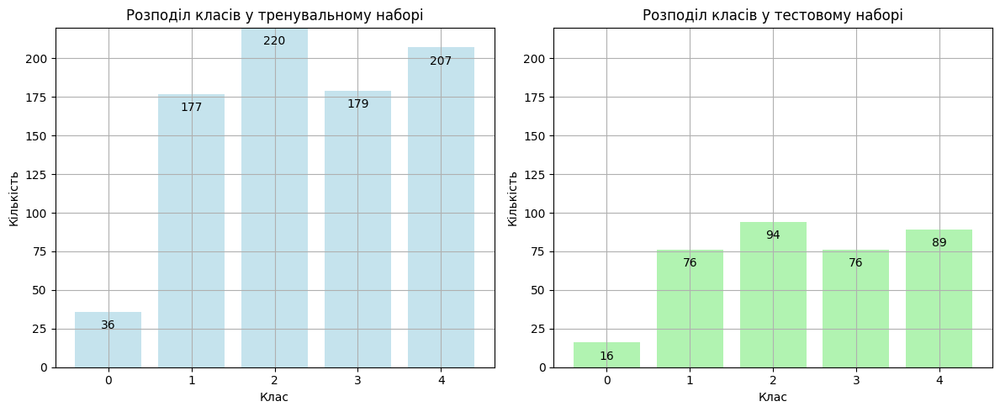

In [120]:
train_values = [train_counts[key] for key in sorted_train_keys]
test_values = [test_counts[key] for key in sorted_test_keys]

fig, ax = plt.subplots(1, 2, figsize=(12, 5))

max_height = max(max(train_values), max(test_values))

ax[0].bar(sorted_train_keys, train_values, color='lightblue', alpha=0.7)
ax[0].set_title("Розподіл класів у тренувальному наборі")
ax[0].set_xlabel("Клас")
ax[0].set_ylabel("Кількість")
ax[0].set_ylim(0, max_height)
ax[0].grid(True)

for i in range(len(sorted_train_keys)):
    ax[0].text(i, train_values[i] - 0.05 * max_height, str(train_values[i]), ha='center')

ax[1].bar(sorted_test_keys, test_values, color='lightgreen', alpha=0.7)
ax[1].set_title("Розподіл класів у тестовому наборі")
ax[1].set_xlabel("Клас")
ax[1].set_ylabel("Кількість")
ax[1].set_ylim(0, max_height)
ax[1].grid(True)

for i in range(len(sorted_test_keys)):
    ax[1].text(i, test_values[i] - 0.05 * max_height, str(test_values[i]), ha='center')

plt.tight_layout()
plt.show()

## Класифікаційні алгоритми

Розглянуті алгоритми та методи можна групувати за категоріями, що дозволяє ефективніше підійти до рішення задач класифікації:

### Лінійні моделі
- **Логістична регресія (Logistic Regression)**
### Методи на основі ядра
- **Машина опорних векторів (SVM/SVC)**
### Баєсовські класифікатори
- **Наївний Баєсовий класифікатор (Naive Bayes)**
### Методи на основі градієнтного спуску
- **Класифікатор зі стохастичним градієнтним спуском (SGD Classifier)**
### Інстанс-базові алгоритми
- **К-найближчих сусідів (K-Nearest Neighbors)**
### Дерева рішень
- **Дерево рішень (Decision Trees)**
- **Випадковий ліс (Random Forest)**
### Бустинг
- **XGBoost**
- **LightGBM**
- **CatBoost**

----


#### Logistic Regression

- В цілому низькі показники точності, відгуку та F1-оцінки, особливо для класу 0.
Це може бути пов'язано з лінійністю моделі, яка може не вловлювати складніші залежності в даних.

In [140]:
# One-vs-Rest за замовчуванням
reg_log = LogisticRegression()
reg_log.fit(X_train, y_train)
y_pred = reg_log.predict(X_test)
print(metrics.classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        16
         1.0       0.33      0.34      0.34        76
         2.0       0.25      0.29      0.26        94
         3.0       0.22      0.17      0.19        76
         4.0       0.30      0.34      0.32        89

    accuracy                           0.27       351
   macro avg       0.22      0.23      0.22       351
weighted avg       0.26      0.27      0.27       351



#### Support Vector Classifier (SVC)

- Найвищі показники для класу 2, але дуже низькі для більшості інших класів.
- SVC може мати проблеми з масштабуванням при великих наборах даних та може потребувати додаткового налаштування ядра та регуляризаційних параметрів.

In [128]:
svc_classifier = SVC()
svc_classifier.fit(X_train, y_train)
y_pred = svc_classifier.predict(X_test)
print(metrics.classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        16
         1.0       0.30      0.08      0.12        76
         2.0       0.27      0.93      0.42        94
         3.0       0.00      0.00      0.00        76
         4.0       0.20      0.02      0.04        89

    accuracy                           0.27       351
   macro avg       0.15      0.21      0.12       351
weighted avg       0.19      0.27      0.15       351



#### Gaussian Naive Bayes (GaussianNB)

- Змішані результати, деякі класи (наприклад, 4) мають відносно високу точність, але більшість інших мають дуже низьку.
- Може бути викликано припущеннями про незалежність ознак, що може не відповідати дійсності.

In [129]:
gnb_classifier = GaussianNB()
gnb_classifier.fit(X_train, y_train)
y_pred = gnb_classifier.predict(X_test)
print(metrics.classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.06      0.06      0.06        16
         1.0       0.22      0.12      0.15        76
         2.0       0.35      0.23      0.28        94
         3.0       0.18      0.09      0.12        76
         4.0       0.30      0.65      0.41        89

    accuracy                           0.28       351
   macro avg       0.22      0.23      0.21       351
weighted avg       0.26      0.28      0.24       351



#### SGD Classifier (Стохастичний градієнтний спуск)

- Загалом погані результати через можливу чутливість до масштабування ознак та налаштування параметрів.

In [134]:
sgd_classifier = SGDClassifier()
sgd_classifier.fit(X_train, y_train)
y_pred = sgd_classifier.predict(X_test)
print(metrics.classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.07      0.69      0.12        16
         1.0       0.00      0.00      0.00        76
         2.0       1.00      0.05      0.10        94
         3.0       0.19      0.46      0.27        76
         4.0       0.00      0.00      0.00        89

    accuracy                           0.15       351
   macro avg       0.25      0.24      0.10       351
weighted avg       0.31      0.15      0.09       351



#### K-Nearest Neighbors (KNN)

- Низькі показники по всіх класах, що може бути пов'язано з вибором параметра k і чутливістю до масштабування ознак.

In [135]:
kn_classifier = KNeighborsClassifier()
kn_classifier.fit(X_train, y_train)
y_pred = kn_classifier.predict(X_test)
print(metrics.classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.10      0.06      0.08        16
         1.0       0.23      0.34      0.28        76
         2.0       0.21      0.27      0.23        94
         3.0       0.15      0.08      0.10        76
         4.0       0.28      0.21      0.24        89

    accuracy                           0.22       351
   macro avg       0.19      0.19      0.19       351
weighted avg       0.21      0.22      0.21       351



#### Decision Trees

In [136]:
dt_classifier = DecisionTreeClassifier()
dt_classifier.fit(X_train, y_train)
y_pred = dt_classifier.predict(X_test)
print(metrics.classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        16
         1.0       0.32      0.28      0.30        76
         2.0       0.28      0.27      0.27        94
         3.0       0.24      0.24      0.24        76
         4.0       0.29      0.34      0.31        89

    accuracy                           0.27       351
   macro avg       0.23      0.22      0.22       351
weighted avg       0.27      0.27      0.27       351



#### Random Forest

In [137]:
rf_classifier = RandomForestClassifier()
rf_classifier.fit(X_train, y_train)
y_pred = rf_classifier.predict(X_test)
print(metrics.classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.50      0.06      0.11        16
         1.0       0.28      0.25      0.26        76
         2.0       0.24      0.30      0.27        94
         3.0       0.22      0.20      0.21        76
         4.0       0.30      0.34      0.32        89

    accuracy                           0.26       351
   macro avg       0.31      0.23      0.23       351
weighted avg       0.27      0.26      0.26       351



In [ ]:
# Let's train RandomForestClassifier with non-default parameters

rf_classifier = RandomForestClassifier(n_estimators = 10, criterion = 'entropy', max_depth = 20)
rf_classifier.fit(X_train, y_train)
y_pred = rf_classifier.predict(X_test)
print(metrics.classification_report(y_test, y_pred))

#### Gradient Boosting Machines (GBM)

In [138]:
gb_classifier = GradientBoostingClassifier()
gb_classifier.fit(X_train, y_train)
y_pred = gb_classifier.predict(X_test)
print(metrics.classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        16
         1.0       0.31      0.28      0.29        76
         2.0       0.30      0.34      0.32        94
         3.0       0.23      0.21      0.22        76
         4.0       0.34      0.37      0.35        89

    accuracy                           0.29       351
   macro avg       0.23      0.24      0.24       351
weighted avg       0.28      0.29      0.28       351



----

#### XGBoost (eXtreme Gradient Boosting)

XGBoost є високоефективною реалізацією алгоритму Gradient Boosted Decision Trees і часто використовується для досягнення одних з найкращих результатів у багатьох задачах машинного навчання.

In [146]:
from xgboost import XGBClassifier

xgb_classifier = XGBClassifier(objective='multi:softmax', num_class=5)
xgb_classifier.fit(X_train, y_train)
y_pred = xgb_classifier.predict(X_test)

print(metrics.classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        16
         1.0       0.29      0.24      0.26        76
         2.0       0.22      0.24      0.23        94
         3.0       0.20      0.21      0.21        76
         4.0       0.25      0.28      0.26        89

    accuracy                           0.23       351
   macro avg       0.19      0.19      0.19       351
weighted avg       0.23      0.23      0.23       351



#### CatBoost

CatBoost особливо ефективний для даних з категорійними ознаками і забезпечує вбудовану обробку категорійних ознак без необхідності попереднього кодування.

In [142]:
from catboost import CatBoostClassifier

catboost_classifier = CatBoostClassifier()
catboost_classifier.fit(X_train, y_train, verbose=0)
y_pred = catboost_classifier.predict(X_test)

print(metrics.classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        16
         1.0       0.23      0.18      0.20        76
         2.0       0.22      0.26      0.24        94
         3.0       0.20      0.22      0.21        76
         4.0       0.27      0.28      0.27        89

    accuracy                           0.23       351
   macro avg       0.18      0.19      0.18       351
weighted avg       0.22      0.23      0.22       351



#### LightGBM

LightGBM є ще одним потужним бустинговим алгоритмом, який оптимізований для високої швидкості і ефективності пам'яті, особливо на великих наборах даних.

In [151]:
from lightgbm import LGBMClassifier

lgbm_classifier = LGBMClassifier(verbose=0)
lgbm_classifier.fit(X_train, y_train)
y_pred = lgbm_classifier.predict(X_test)

print(metrics.classification_report(y_test, y_pred))

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

#### Порівняння за F1

In [155]:
models = [
    ('Logistic Regression', LogisticRegression()),
    ('Support Vector Classifier', SVC()),
    ('Gaussian Naive Bayes', GaussianNB()),
    ('Stochastic Gradient Descent', SGDClassifier()),
    ('K-Nearest Neighbors', KNeighborsClassifier()),
    ('Decision Tree', DecisionTreeClassifier()),
    ('Random Forest', RandomForestClassifier()),
    ('Gradient Boosting', GradientBoostingClassifier()),
    ('XGBoost', XGBClassifier()),
    ('CatBoost', CatBoostClassifier(verbose=0))
]

results = []

for name, model in models:
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    accuracy = metrics.accuracy_score(y_test, y_pred)
    precision = metrics.precision_score(y_test, y_pred, average='weighted')
    recall = metrics.recall_score(y_test, y_pred, average='weighted')
    f1 = metrics.f1_score(y_test, y_pred, average='weighted')
    results.append((name, accuracy, precision, recall, f1))

results_df = pd.DataFrame(results, columns=['Model', 'Accuracy', 'Precision', 'Recall', 'F1 Score'])
results_df = results_df.sort_values(by='F1 Score', ascending=False)

print(results_df.to_string(index=False))

                      Model  Accuracy  Precision   Recall  F1 Score
              Random Forest  0.324786   0.310569 0.324786  0.315212
          Gradient Boosting  0.290598   0.279318 0.290598  0.284133
              Decision Tree  0.276353   0.274029 0.276353  0.274735
        Logistic Regression  0.273504   0.259977 0.273504  0.265420
       Gaussian Naive Bayes  0.276353   0.260470 0.276353  0.242357
Stochastic Gradient Descent  0.270655   0.279351 0.270655  0.239067
                    XGBoost  0.233618   0.229358 0.233618  0.230513
                   CatBoost  0.227920   0.218580 0.227920  0.222236
        K-Nearest Neighbors  0.219373   0.213142 0.219373  0.209576
  Support Vector Classifier  0.270655   0.188479 0.270655  0.149867


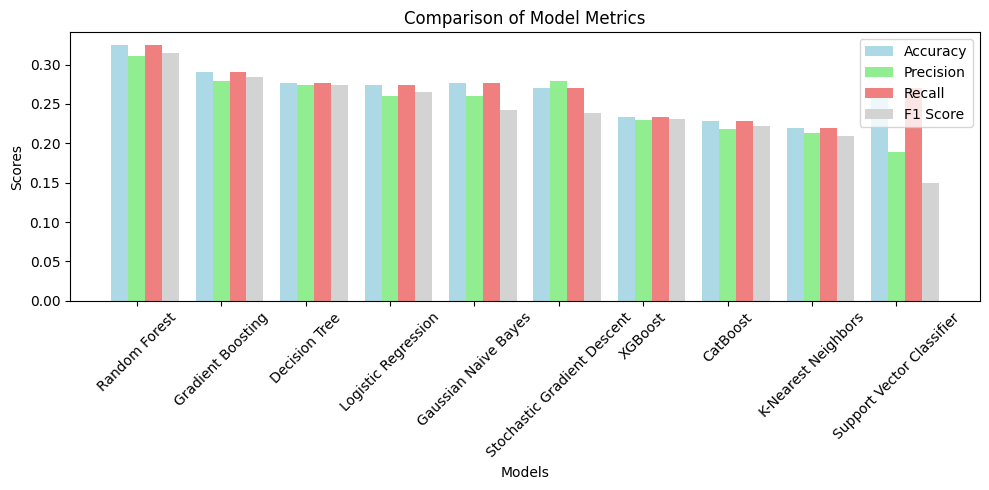

In [163]:
plt.figure(figsize=(10, 5))

colors = ['lightblue', 'lightgreen', 'lightcoral', 'lightgrey']

width = 0.2
x = range(len(results_df))  

plt.bar(x, results_df['Accuracy'], width=width, color=colors[0], label='Accuracy', align='center')
plt.bar([p + width for p in x], results_df['Precision'], width=width, color=colors[1], label='Precision', align='center')
plt.bar([p + width * 2 for p in x], results_df['Recall'], width=width, color=colors[2], label='Recall', align='center')
plt.bar([p + width * 3 for p in x], results_df['F1 Score'], width=width, color=colors[3], label='F1 Score', align='center')

plt.xlabel('Models')
plt.ylabel('Scores')
plt.title('Comparison of Model Metrics')
plt.xticks([p + width for p in x], results_df['Model'], rotation=45)

plt.legend()

plt.tight_layout()
plt.show()

## Feature importances

In [173]:
importances = rf_classifier.feature_importances_
indices = np.argsort(importances)[::-1]

print("Feature ranking:")
for f in range(X_train.shape[1]):
    print("%d. %s (%f)" % (f + 1, X_columns[indices[f]], importances[indices[f]]))

Feature ranking:
1. PhotoAmt (0.113449)
2. BreedName_x (0.090552)
3. BreedName_y (0.083960)
4. Age (0.083180)
5. Quantity (0.073716)
6. Gender (0.050186)
7. StateName_x (0.046409)
8. Sterilized (0.046049)
9. MaturitySize (0.045158)
10. Dewormed (0.044797)
11. FurLength (0.044438)
12. Vaccinated (0.035361)
13. Fee (0.034543)
14. ColorName_White (0.027389)
15. ColorName_y_Cream (0.020561)
16. ColorName_y_Yellow (0.020373)
17. ColorName_x_Brown (0.020215)
18. Type (0.018170)
19. ColorName_y_Golden (0.018153)
20. ColorName_Gray (0.016063)
21. ColorName_y_Gray (0.013146)
22. VideoAmt (0.012129)
23. ColorName_x_Golden (0.010868)
24. ColorName_Golden (0.009507)
25. ColorName_x_Yellow (0.006822)
26. ColorName_Yellow (0.005324)
27. Health (0.004769)
28. ColorName_x_Cream (0.004710)


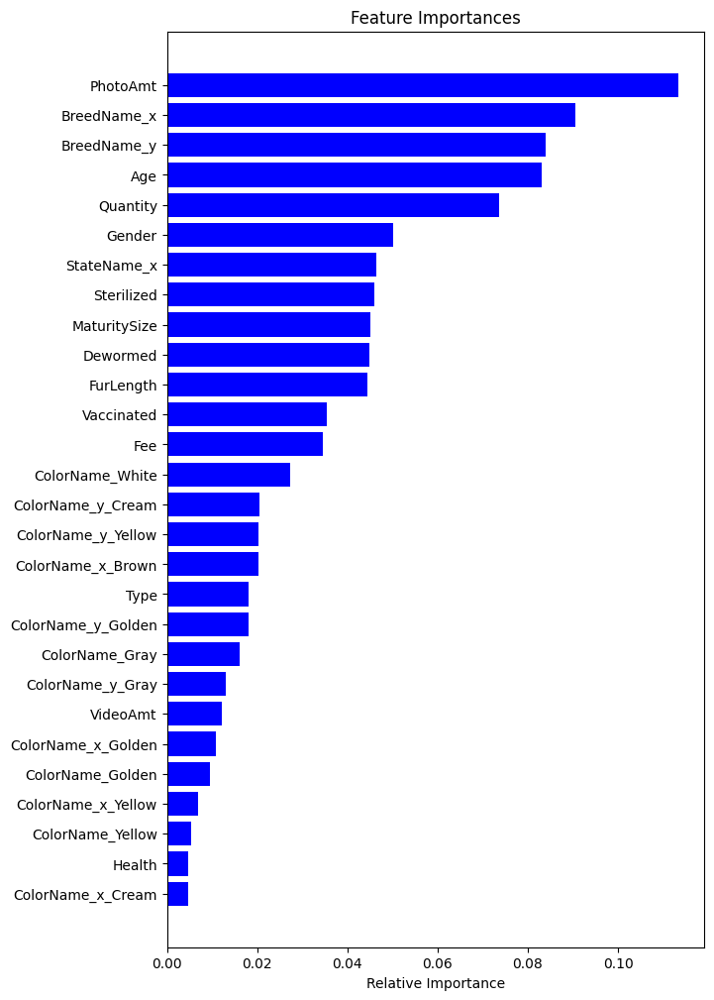

In [174]:
importances = rf_classifier.feature_importances_
indices = np.argsort(importances)
plt.figure(figsize=(7, 12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [X_columns[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

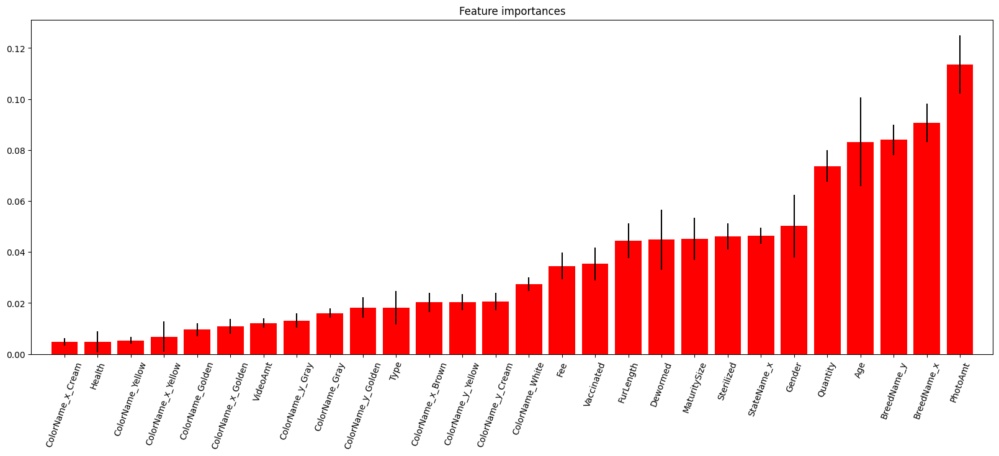

In [175]:
plt.figure(figsize=(20, 7))
plt.title("Feature importances")
plt.bar(range(X_train.shape[1]), importances[indices], color="r", yerr=std[indices], align="center")
plt.xticks(range(X_train.shape[1]), [X_columns[indices[f]] for f in range(X_train.shape[1])])
plt.xticks(rotation=70)
plt.xlim([-1, X_train.shape[1]])
plt.show()

In [170]:
from sklearn.inspection import permutation_importance

imps = permutation_importance(gb_classifier, X_test, y_test)
importances = imps.importances_mean
std = imps.importances_std
indices = np.argsort(importances)[::-1]

print("Feature ranking:")
for f in range(X_train.shape[1]):
    print("%d. %s (%f)" % (f + 1, X_columns[indices[f]], importances[indices[f]]))

Feature ranking:
1. Sterilized (0.037037)
2. Vaccinated (0.019943)
3. BreedName_y (0.015385)
4. Fee (0.013105)
5. Age (0.010826)
6. ColorName_x_Brown (0.007977)
7. Type (0.007407)
8. ColorName_x_Yellow (0.005698)
9. ColorName_Yellow (0.003989)
10. Gender (0.003419)
11. Dewormed (0.003419)
12. FurLength (0.002849)
13. ColorName_White (0.002279)
14. MaturitySize (0.001709)
15. Quantity (0.001140)
16. ColorName_x_Cream (0.001140)
17. Health (0.000570)
18. ColorName_y_Golden (0.000000)
19. ColorName_Golden (0.000000)
20. ColorName_y_Yellow (0.000000)
21. ColorName_y_Gray (-0.000570)
22. PhotoAmt (-0.002279)
23. VideoAmt (-0.002849)
24. ColorName_Gray (-0.002849)
25. ColorName_y_Cream (-0.003989)
26. StateName_x (-0.005698)
27. ColorName_x_Golden (-0.007407)
28. BreedName_x (-0.007407)


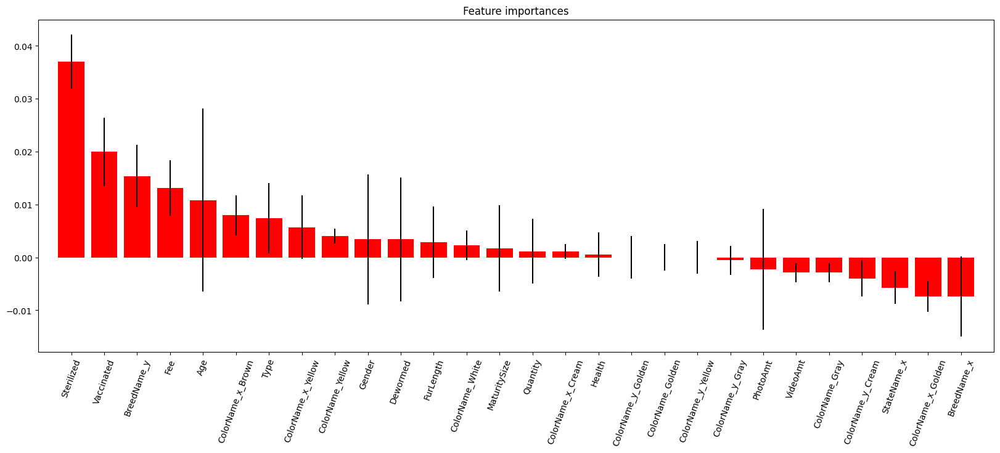

In [171]:
plt.figure(figsize=(20, 7))
plt.title("Feature importances")
plt.bar(range(X_train.shape[1]), importances[indices], color="r", yerr=std[indices], align="center")
plt.xticks(range(X_train.shape[1]), [X_columns[indices[f]] for f in range(X_train.shape[1])])
plt.xticks(rotation=70)
plt.xlim([-1, X_train.shape[1]])
plt.show()

-----
## Розділення даних

### Утриманий набір (Holdout set)

In [184]:
# Let's say we want to split the data in 80:10:10 for train:valid:test dataset
# In the first step we will split the data in training and remaining dataset
X_train, X_rem, y_train, y_rem = train_test_split(X,y, train_size=0.8)

# Now since we want the valid and test size to be equal (10% each of overall data). 
# we have to define valid_size=0.5 (that is 50% of remaining data)
X_valid, X_test, y_valid, y_test = train_test_split(X_rem,y_rem, test_size=0.5)

print(X_train.shape)
print(y_train.shape)
print(X_valid.shape)
print(y_valid.shape)
print(X_test.shape)
print(y_test.shape)

(936, 28)
(936, 1)
(117, 28)
(117, 1)
(117, 28)
(117, 1)


In [186]:
X_train, X_rem, y_train, y_rem = train_test_split(X, y, train_size=0.8, random_state=42)
X_valid, X_test, y_valid, y_test = train_test_split(X_rem, y_rem, test_size=0.5, random_state=42)

# Ініціалізація моделі RandomForest
rf_classifier = RandomForestClassifier()

# Тренування моделі
rf_classifier.fit(X_train, y_train)

# Передбачення на тестовому та валідаційному наборах
y_pred_test = rf_classifier.predict(X_test)
y_pred_valid = rf_classifier.predict(X_valid)

# Виведення метрик для тестового набору
print("Test set metrics:")
print(metrics.classification_report(y_test, y_pred_test))

# Виведення метрик для валідаційного набору
print("Validation set metrics:")
print(metrics.classification_report(y_valid, y_pred_valid))

Test set metrics:
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00         4
         1.0       0.22      0.29      0.25        21
         2.0       0.27      0.27      0.27        41
         3.0       0.15      0.19      0.17        21
         4.0       0.39      0.30      0.34        30

    accuracy                           0.26       117
   macro avg       0.21      0.21      0.21       117
weighted avg       0.26      0.26      0.26       117

Validation set metrics:
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00         3
         1.0       0.38      0.42      0.40        24
         2.0       0.21      0.21      0.21        34
         3.0       0.29      0.28      0.28        29
         4.0       0.37      0.41      0.39        27

    accuracy                           0.31       117
   macro avg       0.25      0.26      0.26       117
weighted avg       0.30      0.31  

In [30]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import roc_curve, auc, roc_auc_score
import matplotlib.pyplot as plt

Accuracy: 0.2564102564102564
Precision: 0.2618509942924659
Recall: 0.2564102564102564
F1 Score: 0.25652262675546494


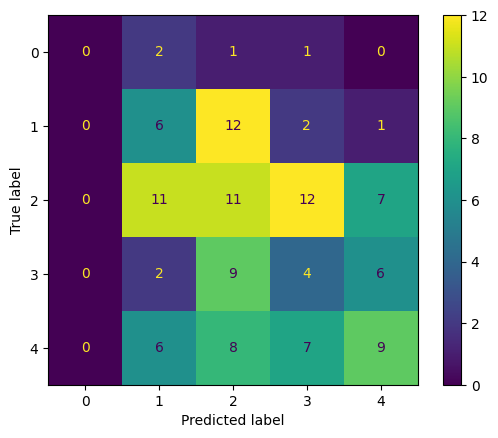

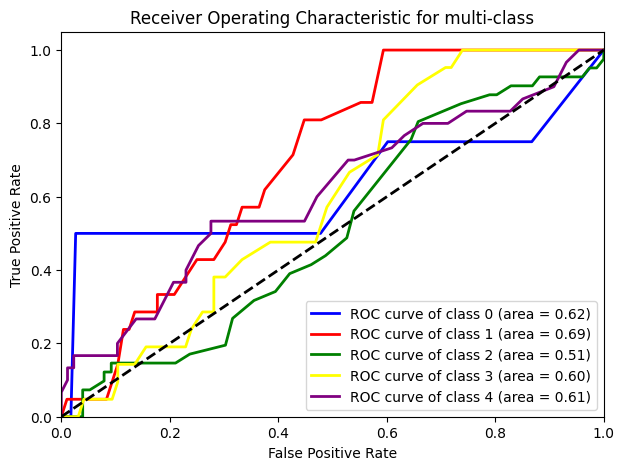

In [206]:
conf_matrix = metrics.confusion_matrix(y_test, y_pred_test)
disp = ConfusionMatrixDisplay(conf_matrix)
disp.plot()

accuracy = metrics.accuracy_score(y_test, y_pred_test)
precision = metrics.precision_score(y_test, y_pred_test, average='weighted')
recall = metrics.recall_score(y_test, y_pred_test, average='weighted')
f1 = metrics.f1_score(y_test, y_pred_test, average='weighted')

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

# Обрахунок ймовірностей класів
y_prob = rf_classifier.predict_proba(X_test)

# Змінні для зберігання результатів для кожного класу
fpr = {}
tpr = {}
roc_auc = {}

n_classes = y_prob.shape[1]  # Кількість класів

# Розрахунок FPR, TPR, і AUC для кожного класу
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test, y_prob[:, i], pos_label=i)
    roc_auc[i] = auc(fpr[i], tpr[i])

# Відображення ROC кривих
plt.figure(figsize=(7, 5))
colors = ['blue', 'red', 'green', 'yellow', 'purple']  # Кольори для кожного класу

for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class')
plt.legend(loc="lower right")
plt.show()

----
### Перехресна перевірка k-Fold ( k-Fold validation)

In [225]:
from numpy import array
from sklearn.model_selection import KFold


# split train/test data
X_train, X_rem, y_train, y_rem = train_test_split(X,y, train_size=0.8)


# prepare cross validation
kfold = KFold(n_splits=5, shuffle=True, random_state=42)
# enumerate splits
for train, test in kfold.split(X_train):
    classifier = RandomForestClassifier()
    classifier.fit(X_train.iloc[train], y_train.iloc[train])
    y_pred = classifier.predict(X_train.iloc[test])
    print('k-fold set metrics: \n', metrics.classification_report(y_train.iloc[test], y_pred))

y_pred_kf = classifier.predict(X_test)    
print('test set metrics: \n', metrics.classification_report(y_test, y_pred_kf))

k-fold set metrics: 
               precision    recall  f1-score   support

         0.0       0.00      0.00      0.00         9
         1.0       0.17      0.19      0.18        42
         2.0       0.23      0.27      0.25        49
         3.0       0.14      0.14      0.14        35
         4.0       0.42      0.40      0.41        53

    accuracy                           0.25       188
   macro avg       0.19      0.20      0.20       188
weighted avg       0.24      0.25      0.25       188

k-fold set metrics: 
               precision    recall  f1-score   support

         0.0       0.00      0.00      0.00         6
         1.0       0.31      0.42      0.36        40
         2.0       0.31      0.36      0.33        53
         3.0       0.53      0.20      0.29        41
         4.0       0.36      0.43      0.39        47

    accuracy                           0.34       187
   macro avg       0.30      0.28      0.27       187
weighted avg       0.36      0.34

Accuracy: 0.7905982905982906
Precision: 0.7926503984843718
Recall: 0.7905982905982906
F1 Score: 0.7907419043321681


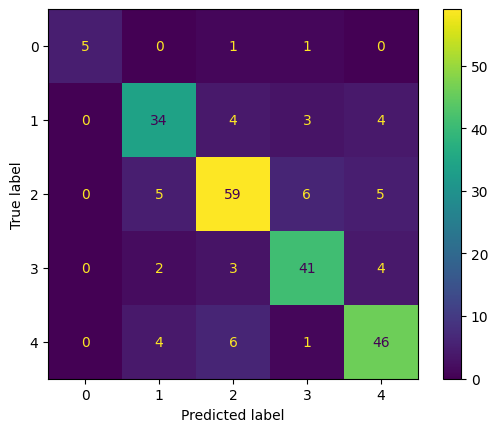

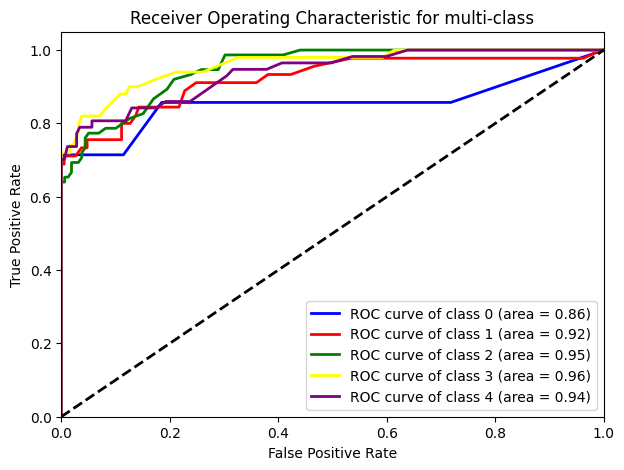

In [229]:
conf_matrix = metrics.confusion_matrix(y_test, y_pred_kf)
disp = ConfusionMatrixDisplay(conf_matrix)
disp.plot()

accuracy = metrics.accuracy_score(y_test, y_pred_kf)
precision = metrics.precision_score(y_test, y_pred_kf, average='weighted')
recall = metrics.recall_score(y_test, y_pred_kf, average='weighted')
f1 = metrics.f1_score(y_test, y_pred_kf, average='weighted')

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

# Обрахунок ймовірностей класів
y_prob_kf = classifier.predict_proba(X_test)

# Змінні для зберігання результатів для кожного класу
fpr = {}
tpr = {}
roc_auc = {}

n_classes = y_prob_kf.shape[1]  # Кількість класів

# Розрахунок FPR, TPR, і AUC для кожного класу
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test, y_prob_kf[:, i], pos_label=i)
    roc_auc[i] = auc(fpr[i], tpr[i])

# Відображення ROC кривих
plt.figure(figsize=(7, 5))
colors = ['blue', 'red', 'green', 'yellow', 'purple']  # Кольори для кожного класу

for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class')
plt.legend(loc="lower right")
plt.show()

**Точність (Precision):** Низька точність для деяких класів, особливо для класу 0, яка часто була нульовою, вказує на те, що модель має тенденцію неправильно класифікувати позитивні випадки цих класів. Точність вища для класу 4, що може вказувати на краще визначення цього класу моделлю або на меншу кількість помилок типу I (неправильне позитивне визначення) для цього класу.

**Відгук (Recall):** Низький відгук для деяких класів, зокрема класу 0, вказує на проблеми з ідентифікацією всіх релевантних випадків. Високий відгук для класу 4 говорить про здатність моделі виявляти більшість випадків цього класу.

**F1-Міра:** F1-міра, яка є гармонійним середнім між точністю і відгуком, також показує низькі значення для деяких класів, особливо для класу 0. Низькі значення F1-міри для цього класу підкреслюють проблеми з його точною класифікацією.

----
### Випадкова підвибірка
### Random permutations cross-validation

In [232]:
from sklearn.model_selection import ShuffleSplit

ss = ShuffleSplit(n_splits=5, test_size=0.2, random_state=0)
for train_index, test_index in ss.split(X):
    classifier = RandomForestClassifier()
    classifier.fit(X.iloc[train_index], y.iloc[train_index])
    y_pred = classifier.predict(X.iloc[test_index])
    print('k-fold set metrics: \n', metrics.classification_report(y.iloc[test_index], y_pred))

y_pred_kf = classifier.predict(X_test)    
print('test set metrics: \n', metrics.classification_report(y_test, y_pred_kf))

k-fold set metrics: 
               precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        13
         1.0       0.22      0.26      0.24        43
         2.0       0.33      0.38      0.35        65
         3.0       0.29      0.23      0.26        53
         4.0       0.40      0.45      0.43        60

    accuracy                           0.32       234
   macro avg       0.25      0.26      0.25       234
weighted avg       0.30      0.32      0.31       234

k-fold set metrics: 
               precision    recall  f1-score   support

         0.0       1.00      0.11      0.20         9
         1.0       0.31      0.27      0.29        49
         2.0       0.37      0.35      0.36        71
         3.0       0.30      0.26      0.28        50
         4.0       0.35      0.51      0.41        55

    accuracy                           0.34       234
   macro avg       0.47      0.30      0.31       234
weighted avg       0.36      0.34

Accuracy: 0.8846153846153846
Precision: 0.8849174666639524
Recall: 0.8846153846153846
F1 Score: 0.8846971168623807


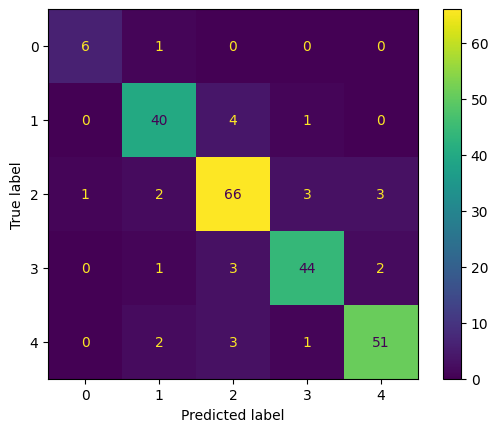

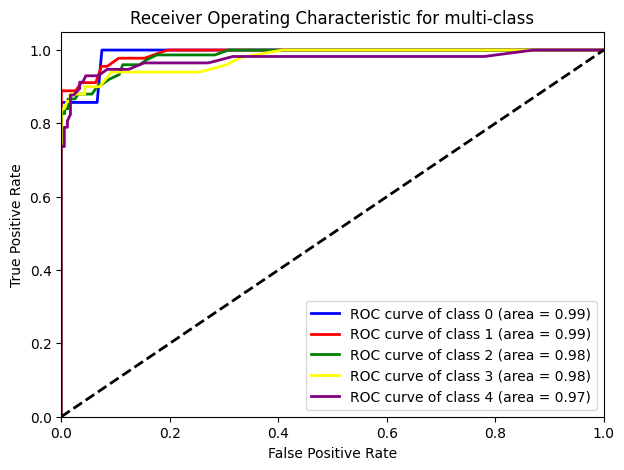

In [233]:
conf_matrix = metrics.confusion_matrix(y_test, y_pred_kf)
disp = ConfusionMatrixDisplay(conf_matrix)
disp.plot()

accuracy = metrics.accuracy_score(y_test, y_pred_kf)
precision = metrics.precision_score(y_test, y_pred_kf, average='weighted')
recall = metrics.recall_score(y_test, y_pred_kf, average='weighted')
f1 = metrics.f1_score(y_test, y_pred_kf, average='weighted')

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

# Обрахунок ймовірностей класів
y_prob_kf = classifier.predict_proba(X_test)

# Змінні для зберігання результатів для кожного класу
fpr = {}
tpr = {}
roc_auc = {}

n_classes = y_prob_kf.shape[1]  # Кількість класів

# Розрахунок FPR, TPR, і AUC для кожного класу
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test, y_prob_kf[:, i], pos_label=i)
    roc_auc[i] = auc(fpr[i], tpr[i])

# Відображення ROC кривих
plt.figure(figsize=(7, 5))
colors = ['blue', 'red', 'green', 'yellow', 'purple']  # Кольори для кожного класу

for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class')
plt.legend(loc="lower right")
plt.show()

----
### Перехресна перевірка з одноразовим використанням
### Leave-one-out Cross-Validation  LOOCV

In [235]:
from sklearn.model_selection import LeaveOneOut
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier

print(X.shape, y.shape)
# create loocv procedure
cv = LeaveOneOut()
# create model
model = RandomForestClassifier(random_state=1)
# evaluate model
scores = cross_val_score(model, X, y, scoring='accuracy', cv=cv)
# report performance
print('Accuracy: %.3f (%.3f)' % (np.mean(scores), np.std(scores)))

(1170, 28) (1170, 1)
Accuracy: 0.303 (0.459)


----
### Перехресна перевірка "залишити одну групу"
### Leave-one-group-out Cross-Validation (LOGOCV)

In [237]:
X['StateName_x'].unique()

array([0., 1., 2., 3.])

In [241]:
from sklearn.model_selection import GroupKFold

gkf = GroupKFold(n_splits=4)
for train_index, test_index in gkf.split(X, y, groups=X['StateName_x']):
    print('Uniq StateName_x for test ',X.iloc[test_index]['StateName_x'].unique())
    classifier = RandomForestClassifier()
    classifier.fit(X.iloc[train_index], y.iloc[train_index])
    y_pred = classifier.predict(X.iloc[test_index])
    print('k-fold set metrics: \n', metrics.classification_report(y.iloc[test_index], y_pred))

Uniq StateName_x for test  [0.]
k-fold set metrics: 
               precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        30
         1.0       0.29      0.23      0.25       168
         2.0       0.27      0.24      0.25       216
         3.0       0.25      0.22      0.23       172
         4.0       0.28      0.45      0.34       180

    accuracy                           0.27       766
   macro avg       0.22      0.23      0.22       766
weighted avg       0.26      0.27      0.26       766

Uniq StateName_x for test  [1.]
k-fold set metrics: 
               precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        15
         1.0       0.27      0.21      0.24        75
         2.0       0.26      0.41      0.32        76
         3.0       0.27      0.19      0.22        63
         4.0       0.27      0.29      0.28        80

    accuracy                           0.27       309
   macro avg       0.22

Uniq StateName_x for test: [0.]
Accuracy: 0.27676240208877284
Precision: 0.2649176270330479
Recall: 0.27676240208877284
F1 Score: 0.26420089751311404


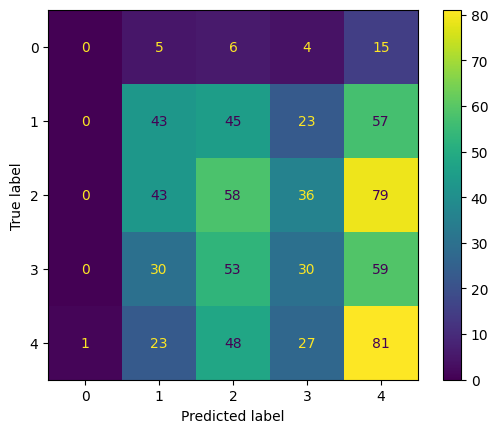

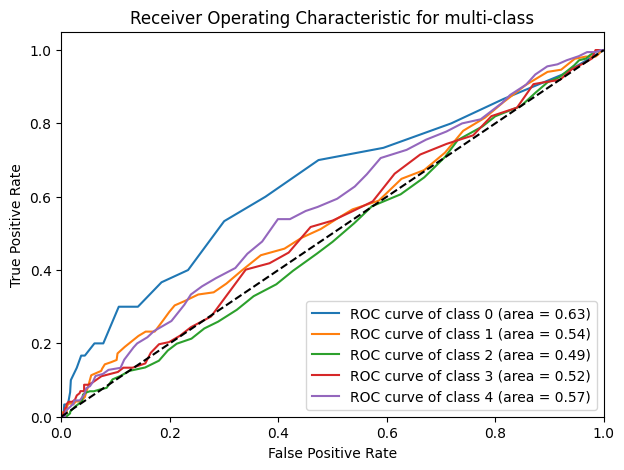

Uniq StateName_x for test: [1.]
Accuracy: 0.284789644012945
Precision: 0.26571753620652505
Recall: 0.284789644012945
F1 Score: 0.26771439776406014


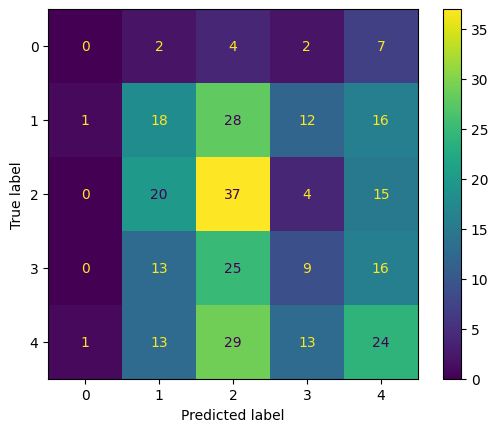

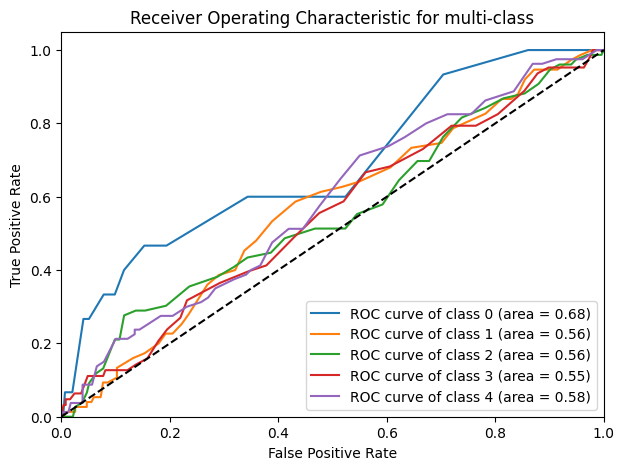

Uniq StateName_x for test: [2.]
Accuracy: 0.3103448275862069
Precision: 0.3205329153605016
Recall: 0.3103448275862069
F1 Score: 0.3153256704980843


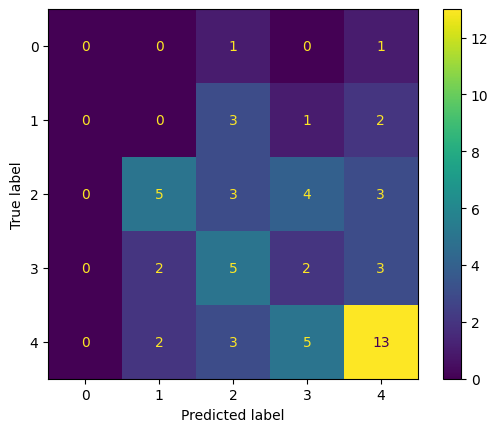

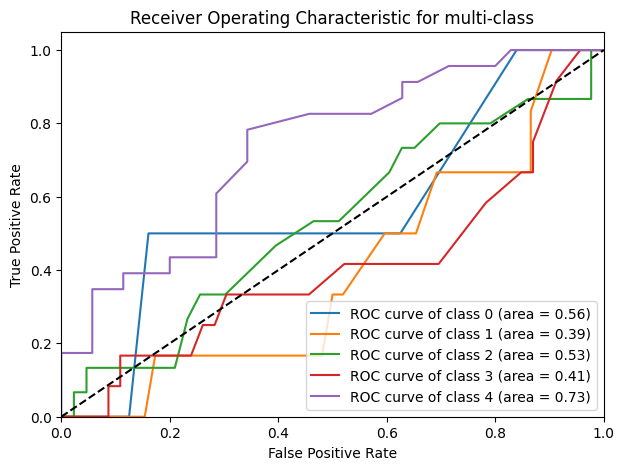

Uniq StateName_x for test: [3.]
Accuracy: 0.2702702702702703
Precision: 0.3338632750397456
Recall: 0.2702702702702703
F1 Score: 0.26306306306306304


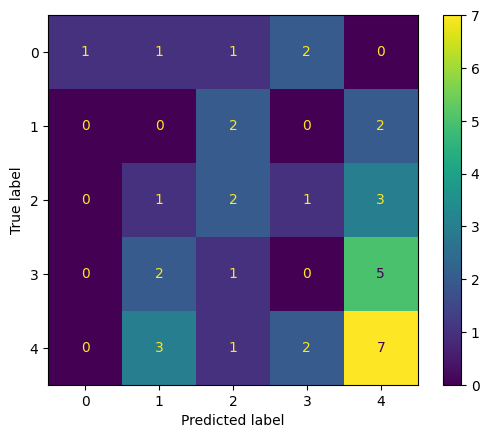

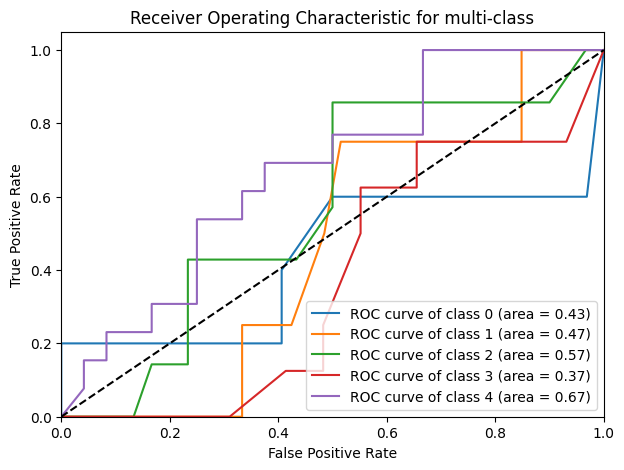

In [243]:

# Визначаємо групи за державою
groups = X['StateName_x']

# Ініціалізація GroupKFold
gkf = GroupKFold(n_splits=4)

# Перебирання кожного розділення
for train_index, test_index in gkf.split(X, y, groups=groups):
    print('Uniq StateName_x for test:', X.iloc[test_index]['StateName_x'].unique())
    
    # Навчання моделі
    classifier = RandomForestClassifier(random_state=42)
    classifier.fit(X.iloc[train_index], y.iloc[train_index])
    
    # Прогнозування
    y_pred = classifier.predict(X.iloc[test_index])
    y_prob = classifier.predict_proba(X.iloc[test_index])  # Для розрахунку ROC
    
    # Виведення метрик
    conf_matrix = confusion_matrix(y.iloc[test_index], y_pred)
    disp = ConfusionMatrixDisplay(conf_matrix)
    disp.plot()
    
    accuracy = accuracy_score(y.iloc[test_index], y_pred)
    precision = precision_score(y.iloc[test_index], y_pred, average='weighted')
    recall = recall_score(y.iloc[test_index], y_pred, average='weighted')
    f1 = f1_score(y.iloc[test_index], y_pred, average='weighted')
    
    print("Accuracy:", accuracy)
    print("Precision:", precision)
    print("Recall:", recall)
    print("F1 Score:", f1)
    
    # Розрахунок ROC кривих для кожного класу
    plt.figure(figsize=(7, 5))
    n_classes = y_prob.shape[1]
    fpr, tpr, roc_auc = {}, {}, {}
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y.iloc[test_index], y_prob[:, i], pos_label=i)
        roc_auc[i] = auc(fpr[i], tpr[i])
        
        # Відображення ROC кривих
        plt.plot(fpr[i], tpr[i], label=f'ROC curve of class {i} (area = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic for multi-class')
    plt.legend(loc="lower right")
    plt.show()

----

# Практична робота № 4

# **Завдання:**

1)	Виберіть декілька метрик для ваших моделей для оптимізації гіперпараметрів.
2)	Виберіть метод оптимізації гіперпараметрів, гіперпараметри та їх можливі значення. Опишіть основи такого рішення.
3)	Здійсніть оптимізацію гіперпараметрів моделі на основі обраних метрик та гіперпараметрів.
4)	Оберіть оптимальний результат.
5)	Поясніть результати пошуку гіперпараметрів моделі відповідно до ваших метрик.
6)	Застосуйте підходи роботи з незбалансованими класами якщо є така необхідність. Обгрунтуйте свій вибір.

---

## Оптимізація моделі

In [23]:
X_train, X_test, y_train, y_test = train_test_split(X,y, train_size=0.8)

print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(936, 28)
(936, 1)
(234, 28)
(234, 1)


### Створення базової моделі RandomForest

In [25]:
rf = RandomForestClassifier(max_features=5, n_estimators=100)

`max_features` визначає максимальну кількість функцій, які слід розглядати при пошуку кращого розділення у дереві, тоді як `n_estimators` вказує кількість дерев у лісі.

In [26]:
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)

test set metrics: 
               precision    recall  f1-score   support

         0.0       0.00      0.00      0.00         9
         1.0       0.30      0.36      0.33        47
         2.0       0.30      0.41      0.35        63
         3.0       0.22      0.13      0.16        54
         4.0       0.46      0.44      0.45        61

    accuracy                           0.33       234
   macro avg       0.26      0.27      0.26       234
weighted avg       0.31      0.33      0.31       234

Accuracy: 0.32905982905982906
Precision: 0.31121024609846937
Recall: 0.32905982905982906
F1 Score: 0.3145096614581826


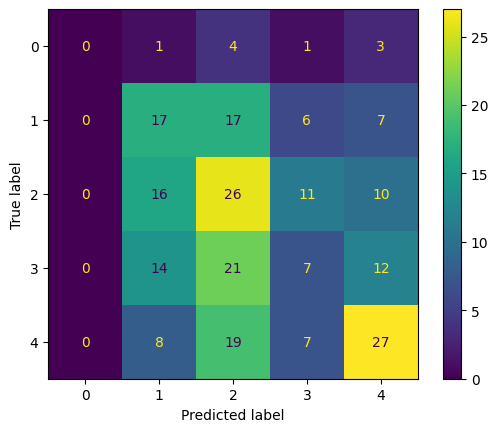

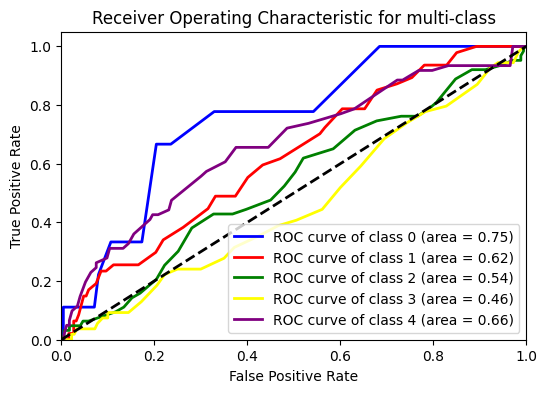

In [60]:
from sklearn.metrics import roc_curve, auc, ConfusionMatrixDisplay

print('test set metrics: \n', metrics.classification_report(y_test, y_pred))

conf_matrix = metrics.confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(conf_matrix)
disp.plot();

accuracy = metrics.accuracy_score(y_test, y_pred)
precision = metrics.precision_score(y_test, y_pred, average='weighted')
recall = metrics.recall_score(y_test, y_pred, average='weighted')
f1 = metrics.f1_score(y_test, y_pred, average='weighted')

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

y_prob = rf.predict_proba(X_test)

fpr = {}
tpr = {}
roc_auc = {}

n_classes = y_prob.shape[1]

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test, y_prob[:, i], pos_label=i)
    roc_auc[i] = auc(fpr[i], tpr[i])

plt.figure(figsize=(6, 4))
colors = ['blue', 'red', 'green', 'yellow', 'purple']

for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class')
plt.legend(loc="lower right")
plt.show()

In [61]:
rf.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 5,
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'monotonic_cst': None,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

## Налаштування гіперпараметрів (для RandomForest)

1. **n_estimators:**
   - **Опис:** Кількість дерев у лісі.
   - **Вплив:** Збільшення кількості дерев може покращити здатність моделі узагальнювати на нових даних, але також збільшить час обчислень та може призвести до перенавчання при дуже великій кількості дерев.

2. **max_features:**
   - **Опис:** Максимальна кількість функцій, розглянутих при розділенні вузла.
   - **Вплив:** Контролює кількість функцій, які розглядаються при пошуку кращого розділення на кожному кроці. Менше значення може покращити роботу моделі за рахунок зниження кореляції між деревами і зменшення перенавчання.

3. **max_depth:**
   - **Опис:** Максимальна кількість рівнів у кожному дереві рішень.
   - **Вплив:** Встановлення цього обмеження допомагає запобігти перенавчанню. Дерева, що є занадто глибокими, можуть дуже точно описати тренувальні дані, але погано працювати на невідомих даних.

4. **min_samples_split:**
   - **Опис:** Мінімальна кількість точок даних, які мають бути в вузлі, перш ніж вузол буде розділений.
   - **Вплив:** Вищі значення запобігають моделі у розділенні вузлів на занадто малі вузли, що може бути корисним для запобігання перенавчання.

5. **min_samples_leaf:**
   - **Опис:** Мінімальна кількість точок даних, дозволених у листковому вузлі.
   - **Вплив:** Запобігає створенню вузлів, що містять занадто мало точок даних, що також допомагає запобігти перенавчанню.

6. **bootstrap:**
   - **Опис:** Метод для вибірки точок даних (з заміщенням або без).
   - **Вплив:** Якщо включено, кожне дерево навчається на випадковій вибірці даних, що забезпечує різноманітність у моделях та краще узагальнення.

<div style="text-align: center;">
    <img src="1_sPTZiXuWHBct_kYiD_5aYA.webp" alt="Порівняння" width="900"/>
</div>

### Grid Search

In [64]:
from sklearn.model_selection import GridSearchCV

In [123]:
%%time
param_grid = {'n_estimators': np.arange(25,55,10),
               'max_features': [0.5, 0.6, 0.8],
               'min_samples_split': [10,15],
               'min_samples_leaf': [3,4],
               'bootstrap': [False]}


rf = RandomForestClassifier()

grid = GridSearchCV(estimator=rf, 
                    param_grid=param_grid, 
                    scoring='roc_auc_ovr', 
                    cv=5,
                    verbose = 3,
                    return_train_score=True)

grid.fit(X_train, y_train)

print("The best parameters are %s with a score of %0.2f"
      % (grid.best_params_, grid.best_score_))

Fitting 5 folds for each of 36 candidates, totalling 180 fits
[CV 1/5] END bootstrap=False, max_features=0.5, min_samples_leaf=3, min_samples_split=10, n_estimators=25;, score=(train=0.995, test=0.574) total time=   0.1s
[CV 2/5] END bootstrap=False, max_features=0.5, min_samples_leaf=3, min_samples_split=10, n_estimators=25;, score=(train=0.993, test=0.530) total time=   0.0s
[CV 3/5] END bootstrap=False, max_features=0.5, min_samples_leaf=3, min_samples_split=10, n_estimators=25;, score=(train=0.995, test=0.583) total time=   0.0s
[CV 4/5] END bootstrap=False, max_features=0.5, min_samples_leaf=3, min_samples_split=10, n_estimators=25;, score=(train=0.994, test=0.541) total time=   0.0s
[CV 5/5] END bootstrap=False, max_features=0.5, min_samples_leaf=3, min_samples_split=10, n_estimators=25;, score=(train=0.993, test=0.520) total time=   0.0s
[CV 1/5] END bootstrap=False, max_features=0.5, min_samples_leaf=3, min_samples_split=10, n_estimators=35;, score=(train=0.996, test=0.616) tot

<Figure size 1000x800 with 0 Axes>

(0.0, 1.0)

(0.0, 1.05)

Text(0.5, 0, 'False Positive Rate')

Text(0, 0.5, 'True Positive Rate')

Text(0.5, 1.0, 'Receiver operating characteristic for multi-class')

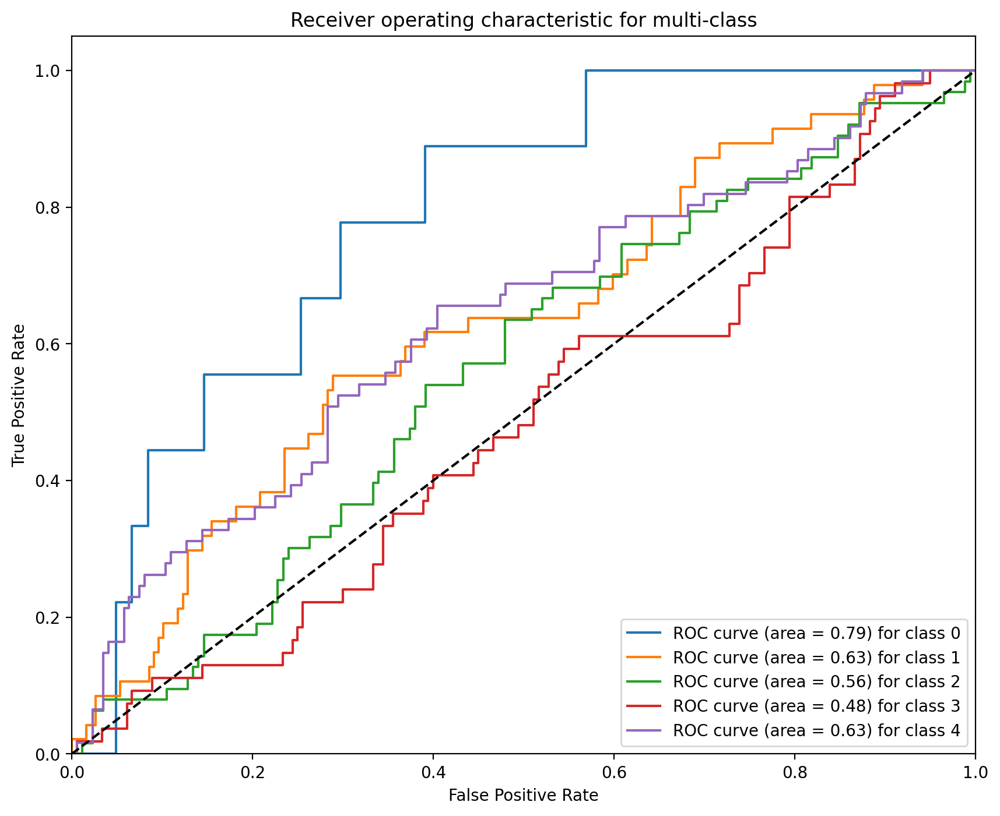

In [124]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Прогнозування ймовірностей класів
y_prob = grid.best_estimator_.predict_proba(X_test)

# Кількість класів
n_classes = y_prob.shape[1]

# Петля для кожного класу
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test == i, y_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Побудова ROC кривої для кожного класу
plt.figure(figsize=(10, 8))
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve (area = %0.2f) for class %i' % (roc_auc[i], i))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate');
plt.ylabel('True Positive Rate');
plt.title('Receiver operating characteristic for multi-class');
plt.legend(loc="lower right");
plt.show()

In [128]:
grid_results = pd.concat([pd.DataFrame(grid.cv_results_["params"]),
                          pd.DataFrame(grid.cv_results_["mean_test_score"], 
                          columns=["roc_auc_ovr"])],
                          axis=1)

grid_results

,bootstrap,max_features,min_samples_leaf,min_samples_split,n_estimators,roc_auc_ovr
0,False,0.5,3,10,25,0.549721
1,False,0.5,3,10,35,0.559400
2,False,0.5,3,10,45,0.563559
3,False,0.5,3,15,25,0.557376
4,False,0.5,3,15,35,0.555277
5,False,0.5,3,15,45,0.560507
6,False,0.5,4,10,25,0.564316
7,False,0.5,4,10,35,0.561697
8,False,0.5,4,10,45,0.561094
9,False,0.5,4,15,25,0.562014


In [129]:
grid_results.columns

Index(['bootstrap', 'max_features', 'min_samples_leaf', 'min_samples_split',
       'n_estimators', 'roc_auc_ovr'],
      dtype='object')

In [130]:
grid_contour = grid_results.groupby([  'max_features', 'min_samples_leaf',
       'min_samples_split', 'n_estimators']).mean()
grid_contour

bootstrap  \
max_features min_samples_leaf min_samples_split n_estimators              
0.5          3                10                25                  0.0   
                                                35                  0.0   
                                                45                  0.0   
                              15                25                  0.0   
                                                35                  0.0   
                                                45                  0.0   
             4                10                25                  0.0   
                                                35                  0.0   
                                                45                  0.0   
                              15                25                  0.0   
                                                35                  0.0   
                                                45                  0.0   
0.6          3                10                25                  0.0   
                                                35                  0.0   
                                                45                  0.0   
                              15                25                  0.0   
                                                35                  0.0   
                                                45                  0.0   
             4                10                25                  0.0   
                                                35                  0.0   
                                                45                  0.0   
                              15                25                  0.0   
                                                35                  0.0   
                                                45                  0.0   
0.8          3                10                25                  0.0   
                                                35                  0.0   
                                                45                  0.0   
                              15                25                  0.0   
                                                35                  0.0   
                                                45                  0.0   
             4                10                25                  0.0   
                                                35                  0.0   
                                                45                  0.0   
                              15                25                  0.0   
                                                35                  0.0   
                                                45                  0.0   

                                                              roc_auc_ovr  
max_features min_samples_leaf min_samples_split n_estimators               
0.5          3                10                25               0.549721  
                                                35               0.559400  
                                                45               0.563559  
                              15                25               0.557376  
                                                35               0.555277  
                                                45               0.560507  
             4                10                25               0.564316  
                                                35               0.561697  
                                                45               0.561094  
                              15                25               0.562014  
                                                35               0.569064  
                                                45               0.559587  
0.6          3                10                25               0.566974  
                                                35               0.5632

### Random Search¶

In [92]:
from sklearn.model_selection import RandomizedSearchCV

In [134]:
%%time
# Встановлення діапазонів для параметрів
param_distributions = {
    'n_estimators': np.arange(25, 55, 10),
    'max_features': [0.5, 0.6, 0.8],
    'min_samples_split': [10, 15],
    'min_samples_leaf': [3, 4],
    'bootstrap': [True, False]
}

# Створення моделі RandomForestClassifier
rf = RandomForestClassifier()

# Налаштування RandomizedSearchCV
random_search = RandomizedSearchCV(
    estimator=rf,
    param_distributions=param_distributions,
    n_iter=100,  # Кількість ітерацій для випадкового пошуку
    scoring='roc_auc_ovr',  # Метрика оцінки
    cv=5,  # Крос-валідація
    verbose=3,
    random_state=42,
    return_train_score=True
)

# Запуск випадкового пошуку
random_search.fit(X_train, y_train)

# Вивід результатів
print("Найкращі параметри:", random_search.best_params_)
print("Найкращий бал:", random_search.best_score_)

Fitting 5 folds for each of 72 candidates, totalling 360 fits
[CV 1/5] END bootstrap=True, max_features=0.5, min_samples_leaf=3, min_samples_split=10, n_estimators=25;, score=(train=0.981, test=0.630) total time=   0.1s
[CV 2/5] END bootstrap=True, max_features=0.5, min_samples_leaf=3, min_samples_split=10, n_estimators=25;, score=(train=0.970, test=0.551) total time=   0.0s
[CV 3/5] END bootstrap=True, max_features=0.5, min_samples_leaf=3, min_samples_split=10, n_estimators=25;, score=(train=0.979, test=0.571) total time=   0.0s
[CV 4/5] END bootstrap=True, max_features=0.5, min_samples_leaf=3, min_samples_split=10, n_estimators=25;, score=(train=0.973, test=0.577) total time=   0.0s
[CV 5/5] END bootstrap=True, max_features=0.5, min_samples_leaf=3, min_samples_split=10, n_estimators=25;, score=(train=0.973, test=0.499) total time=   0.0s
[CV 1/5] END bootstrap=True, max_features=0.5, min_samples_leaf=3, min_samples_split=10, n_estimators=35;, score=(train=0.984, test=0.606) total tim

<Figure size 1000x800 with 0 Axes>

(0.0, 1.0)

(0.0, 1.05)

Text(0.5, 0, 'False Positive Rate')

Text(0, 0.5, 'True Positive Rate')

Text(0.5, 1.0, 'Receiver operating characteristic for multi-class')

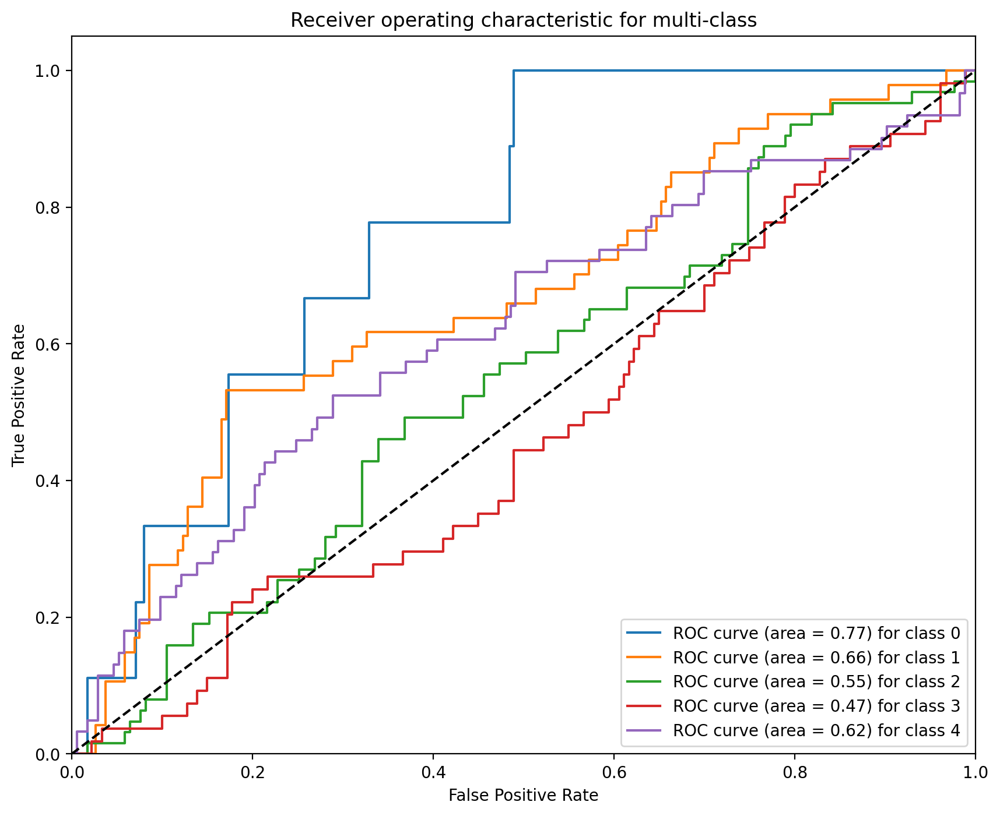

In [138]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Прогнозування ймовірностей класів
y_prob = random_search.best_estimator_.predict_proba(X_test)

# Кількість класів
n_classes = y_prob.shape[1]

# Петля для кожного класу
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test == i, y_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Побудова ROC кривої для кожного класу
plt.figure(figsize=(10, 8))
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve (area = %0.2f) for class %i' % (roc_auc[i], i))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate');
plt.ylabel('True Positive Rate');
plt.title('Receiver operating characteristic for multi-class');
plt.legend(loc="lower right");
plt.show()

In [135]:
grid_results_rs = pd.concat([pd.DataFrame(random_search.cv_results_["params"]),
                          pd.DataFrame(random_search.cv_results_["mean_test_score"], 
                          columns=["roc_auc_ovr"])],
                          axis=1)

grid_results_rs

,n_estimators,min_samples_split,min_samples_leaf,max_features,bootstrap,roc_auc_ovr
0,25,10,3,0.5,True,0.565627
1,35,10,3,0.5,True,0.572208
2,45,10,3,0.5,True,0.558405
3,25,15,3,0.5,True,0.550028
4,35,15,3,0.5,True,0.572360
5,45,15,3,0.5,True,0.574328
6,25,10,4,0.5,True,0.556917
7,35,10,4,0.5,True,0.565620
8,45,10,4,0.5,True,0.568523
9,25,15,4,0.5,True,0.568326


In [136]:
grid_results_rs.columns

Index(['n_estimators', 'min_samples_split', 'min_samples_leaf', 'max_features',
       'bootstrap', 'roc_auc_ovr'],
      dtype='object')

In [137]:
grid_contour_rs = grid_results_rs.groupby([  'max_features', 'min_samples_leaf',
       'min_samples_split', 'n_estimators']).mean()
grid_contour_rs

bootstrap  \
max_features min_samples_leaf min_samples_split n_estimators              
0.5          3                10                25                  0.5   
                                                35                  0.5   
                                                45                  0.5   
                              15                25                  0.5   
                                                35                  0.5   
                                                45                  0.5   
             4                10                25                  0.5   
                                                35                  0.5   
                                                45                  0.5   
                              15                25                  0.5   
                                                35                  0.5   
                                                45                  0.5   
0.6          3                10                25                  0.5   
                                                35                  0.5   
                                                45                  0.5   
                              15                25                  0.5   
                                                35                  0.5   
                                                45                  0.5   
             4                10                25                  0.5   
                                                35                  0.5   
                                                45                  0.5   
                              15                25                  0.5   
                                                35                  0.5   
                                                45                  0.5   
0.8          3                10                25                  0.5   
                                                35                  0.5   
                                                45                  0.5   
                              15                25                  0.5   
                                                35                  0.5   
                                                45                  0.5   
             4                10                25                  0.5   
                                                35                  0.5   
                                                45                  0.5   
                              15                25                  0.5   
                                                35                  0.5   
                                                45                  0.5   

                                                              roc_auc_ovr  
max_features min_samples_leaf min_samples_split n_estimators               
0.5          3                10                25               0.556630  
                                                35               0.565285  
                                                45               0.556883  
                              15                25               0.552254  
                                                35               0.568243  
                                                45               0.568007  
             4                10                25               0.563791  
                                                35               0.565689  
                                                45               0.567583  
                              15                25               0.569512  
                                                35               0.565499  
                                                45               0.564589  
0.6          3                10                25               0.571815  
                                                35               0.5658

### Bayesian Search¶

In [104]:
from skopt import BayesSearchCV
from skopt.space import Integer, Real, Categorical

In [117]:
%%time
# Встановлення діапазонів для параметрів
search_spaces = {
    'n_estimators': Integer(25, 55),
    'max_features': Categorical([0.5, 0.6, 0.8]),
    'min_samples_split': Integer(10, 15),
    'min_samples_leaf': Integer(3, 4),
    'bootstrap': Categorical([True, False])
}

# Створення моделі RandomForestClassifier
rf = RandomForestClassifier()

# Налаштування BayesSearchCV
bayes_search = BayesSearchCV(
    estimator=rf,
    search_spaces=search_spaces,
    n_iter=100,  # Кількість ітерацій для Байєсівського пошуку
    scoring='roc_auc_ovr',  # Метрика оцінки
    cv=5,  # Крос-валідація
    verbose=3,
    return_train_score=True,
    random_state=42
)

# Запуск Байєсівського пошуку
bayes_search.fit(X_train, y_train)

# Вивід результатів
print("Найкращі параметри:", bayes_search.best_params_)
print("Найкращий бал:", bayes_search.best_score_)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV 1/5] END bootstrap=True, max_features=0.8, min_samples_leaf=4, min_samples_split=12, n_estimators=45;, score=(train=0.972, test=0.627) total time=   0.2s
[CV 2/5] END bootstrap=True, max_features=0.8, min_samples_leaf=4, min_samples_split=12, n_estimators=45;, score=(train=0.962, test=0.543) total time=   0.1s
[CV 3/5] END bootstrap=True, max_features=0.8, min_samples_leaf=4, min_samples_split=12, n_estimators=45;, score=(train=0.970, test=0.561) total time=   0.1s
[CV 4/5] END bootstrap=True, max_features=0.8, min_samples_leaf=4, min_samples_split=12, n_estimators=45;, score=(train=0.969, test=0.565) total time=   0.1s
[CV 5/5] END bootstrap=True, max_features=0.8, min_samples_leaf=4, min_samples_split=12, n_estimators=45;, score=(train=0.962, test=0.536) total time=   0.1s
Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV 1/5] END bootstrap=False, max_features=0.8, min_samples_leaf=3, min_samples_split=15, n_

<Figure size 1000x800 with 0 Axes>

(0.0, 1.0)

(0.0, 1.05)

Text(0.5, 0, 'False Positive Rate')

Text(0, 0.5, 'True Positive Rate')

Text(0.5, 1.0, 'Receiver operating characteristic for multi-class')

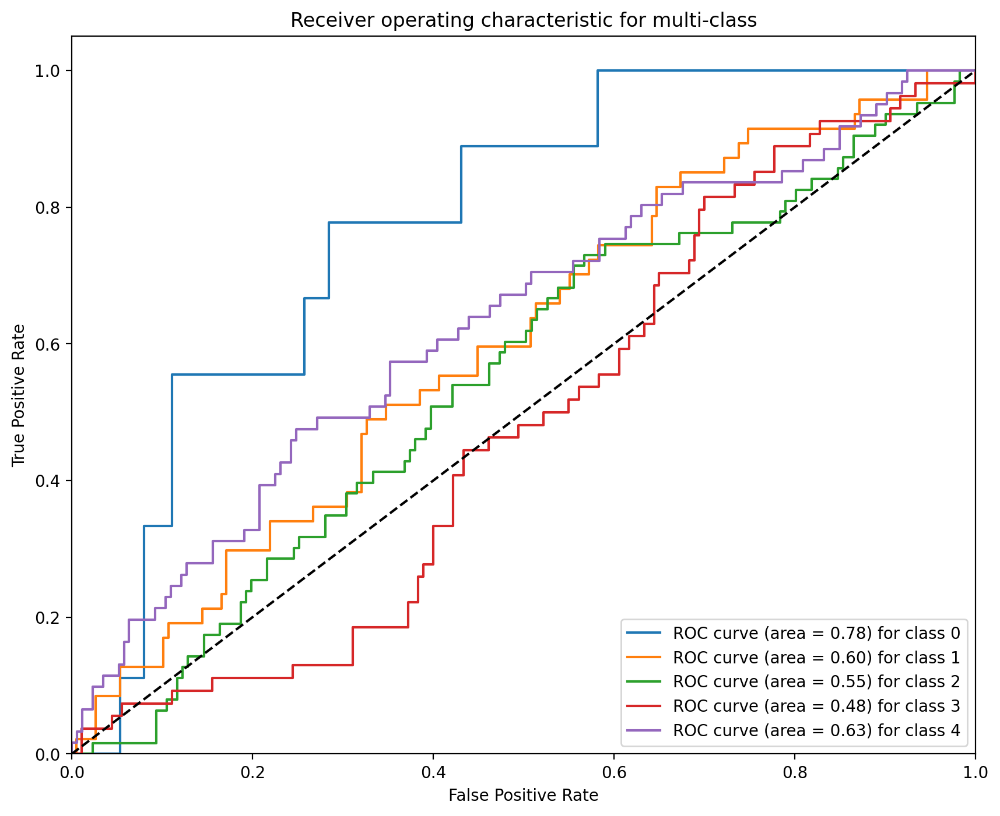

In [118]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Прогнозування ймовірностей класів
y_prob = bayes_search.best_estimator_.predict_proba(X_test)

# Кількість класів
n_classes = y_prob.shape[1]

# Петля для кожного класу
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test == i, y_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Побудова ROC кривої для кожного класу
plt.figure(figsize=(10, 8))
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve (area = %0.2f) for class %i' % (roc_auc[i], i))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate');
plt.ylabel('True Positive Rate');
plt.title('Receiver operating characteristic for multi-class');
plt.legend(loc="lower right");
plt.show()

In [ ]:
import matplotlib.pyplot as plt
from skopt.plots import plot_objective, plot_histogram

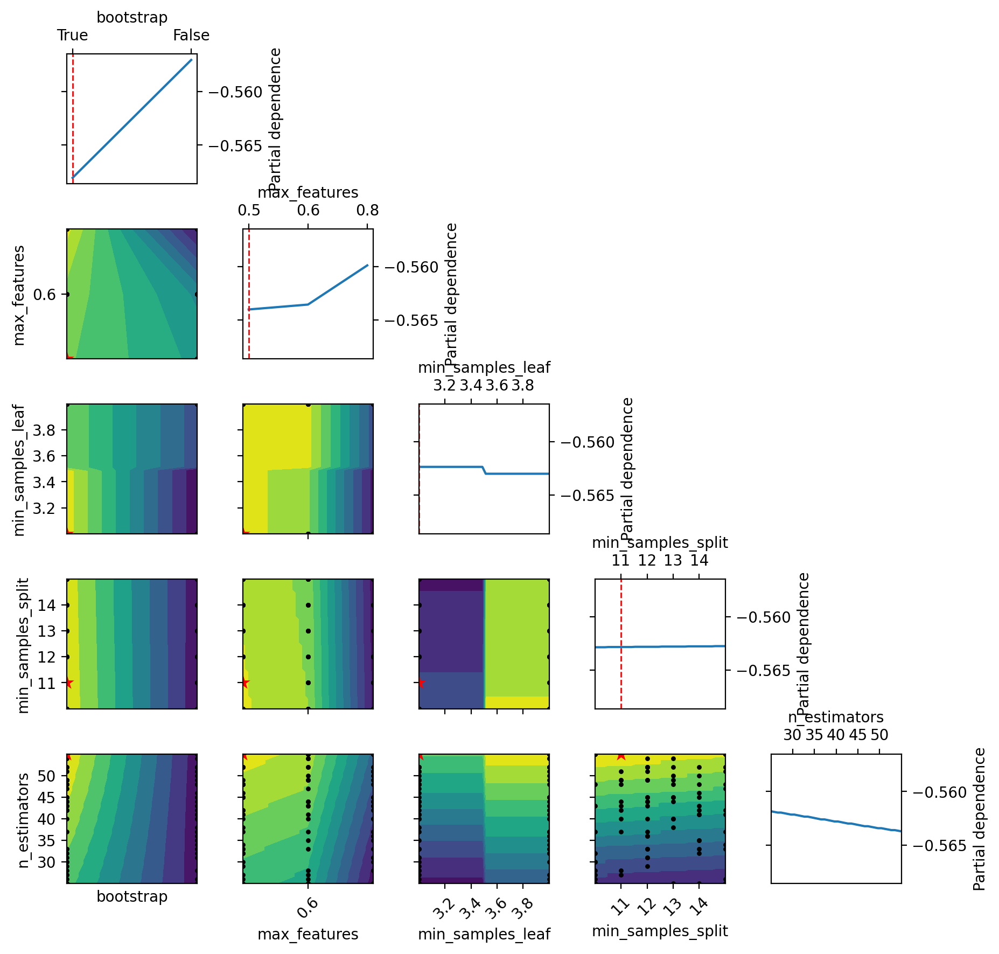

In [119]:
_ = plot_objective(bayes_search.optimizer_results_[0])
plt.show()

In [131]:
grid_results = pd.concat([pd.DataFrame(bayes_search.cv_results_["params"]),
                          pd.DataFrame(bayes_search.cv_results_["mean_test_score"], 
                          columns=["roc_auc_ovr"])],
                          axis=1)

grid_results

,bootstrap,max_features,min_samples_leaf,min_samples_split,n_estimators,roc_auc_ovr
0,True,0.8,4,12,45,0.566403
1,False,0.8,3,15,51,0.545146
2,True,0.8,3,12,31,0.568024
3,False,0.5,4,14,41,0.569112
4,False,0.6,4,14,52,0.564883
5,False,0.8,3,11,49,0.551640
6,False,0.8,3,14,43,0.545238
7,False,0.8,3,14,35,0.553846
8,False,0.8,4,12,36,0.546268
9,True,0.8,4,11,42,0.575353


In [132]:
grid_results.columns

Index(['bootstrap', 'max_features', 'min_samples_leaf', 'min_samples_split',
       'n_estimators', 'roc_auc_ovr'],
      dtype='object')

In [133]:
grid_contour = grid_results.groupby([  'max_features', 'min_samples_leaf',
       'min_samples_split', 'n_estimators']).mean()
grid_contour

bootstrap  \
max_features min_samples_leaf min_samples_split n_estimators              
0.5          3                10                25                  0.0   
                                                30                  1.0   
                                                55                  1.0   
                              11                27                  1.0   
                                                37                  0.0   
                                                48                  0.0   
                                                55                  1.0   
                              12                29                  1.0   
                                                40                  0.0   
                                                52                  0.0   
                              13                38                  0.0   
                                                45                  0.0   
                                                48                  1.0   
                              14                33                  1.0   
                                                41                  0.0   
                                                42                  1.0   
                                                46                  0.0   
                              15                48                  0.0   
                                                52                  0.0   
                                                55                  1.0   
             4                10                26                  1.0   
                                                32                  1.0   
                                                48                  0.0   
                                                55                  0.5   
                              12                33                  0.0   
                                                45                  0.0   
                                                49                  1.0   
                                                52                  1.0   
                              13                45                  1.0   
                                                52                  1.0   
                              14                32                  0.0   
                                                41                  0.0   
                              15                34                  0.0   
                                                42                  0.0   
                                                55                  1.0   
0.6          3                10                28                  1.0   
                                                55                  0.5   
                              11                43                  0.0   
                                                49                  1.0   
                              12                49                  1.0   
                              13                25                  1.0   
                                                44                  1.0   
                                                49                  1.0   
                                                50                  0.0   
                              15                25                  1.0   
                                                26                  0.0   
                                                33                  0.0   
                                                41                  0.0   
                                                47                  1.0   
                                                55                  1.0   
             4                10                27                  1.0   
                                                37                  0.0   
            

### Перевірка гіперпараметрів

RandomForestClassifier(bootstrap=False, max_features=0.5, min_samples_leaf=4,
                       min_samples_split=15, n_estimators=35)

Test set metrics:
               precision    recall  f1-score   support

         0.0       0.00      0.00      0.00         9
         1.0       0.27      0.26      0.26        47
         2.0       0.36      0.44      0.40        63
         3.0       0.23      0.19      0.20        54
         4.0       0.37      0.41      0.39        61

    accuracy                           0.32       234
   macro avg       0.25      0.26      0.25       234
weighted avg       0.30      0.32      0.31       234



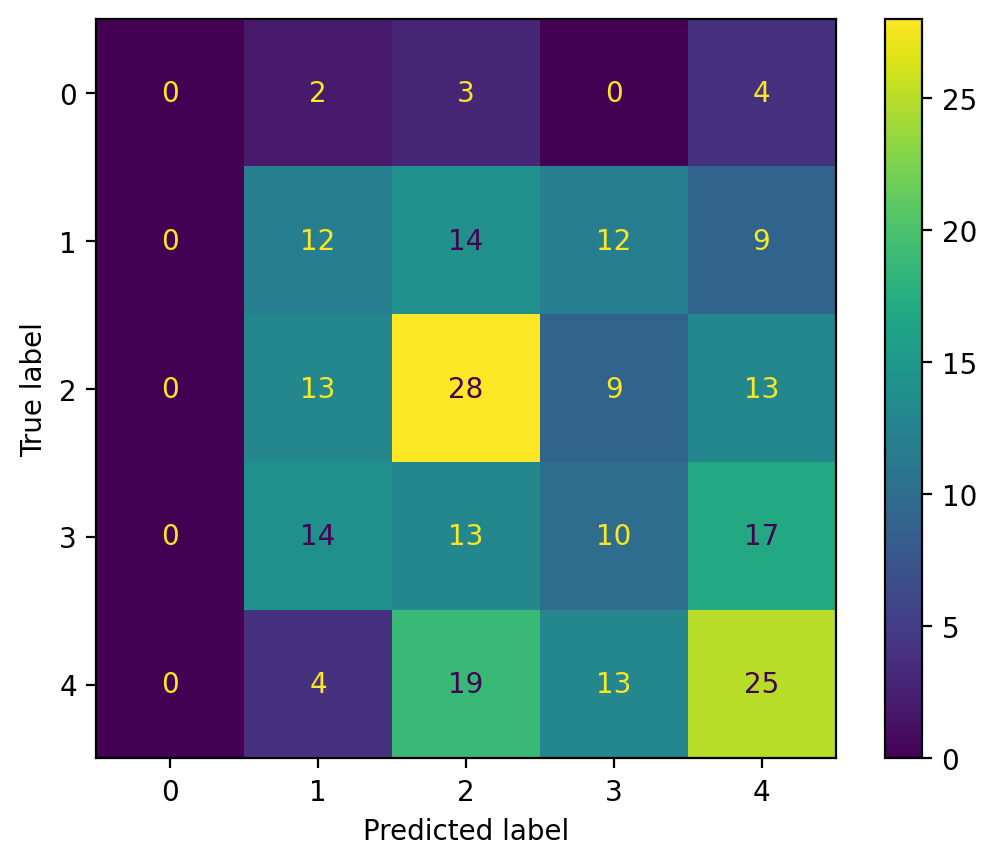

Accuracy: 0.32051282051282054
Precision: 0.2997505218093454
Recall: 0.32051282051282054
F1 Score: 0.3082251648769055


<Figure size 600x400 with 0 Axes>

(0.0, 1.0)

(0.0, 1.05)

Text(0.5, 0, 'False Positive Rate')

Text(0, 0.5, 'True Positive Rate')

Text(0.5, 1.0, 'Receiver Operating Characteristic for multi-class')

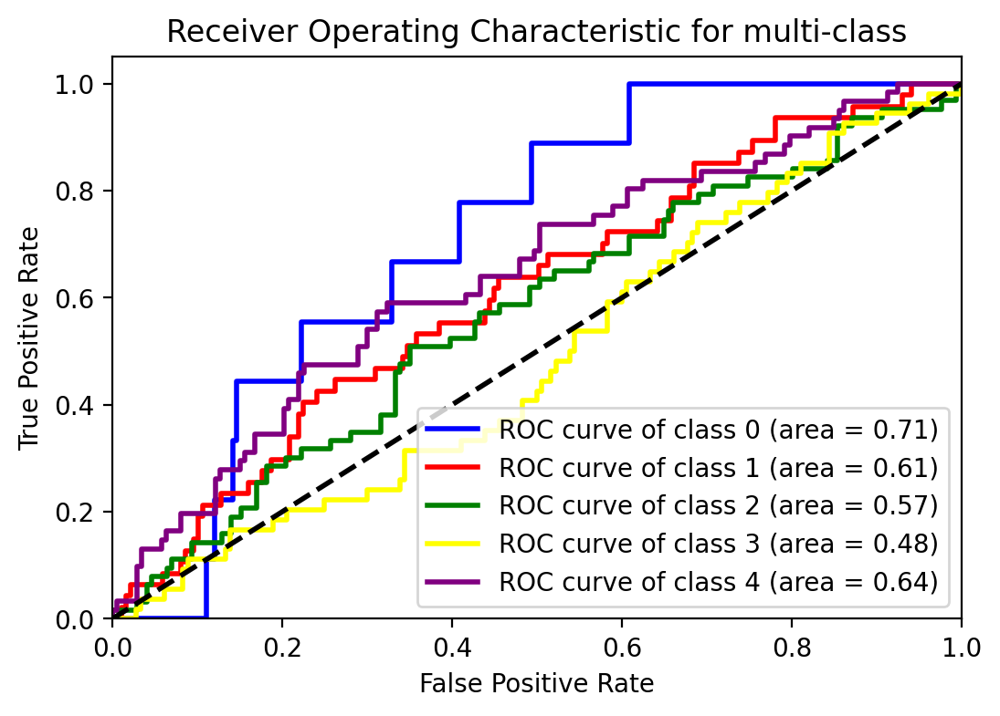

RandomForestClassifier(max_features=0.6, min_samples_leaf=4,
                       min_samples_split=15, n_estimators=45)

Test set metrics:
               precision    recall  f1-score   support

         0.0       0.00      0.00      0.00         9
         1.0       0.26      0.32      0.29        47
         2.0       0.28      0.35      0.31        63
         3.0       0.21      0.11      0.15        54
         4.0       0.37      0.43      0.40        61

    accuracy                           0.29       234
   macro avg       0.23      0.24      0.23       234
weighted avg       0.27      0.29      0.28       234



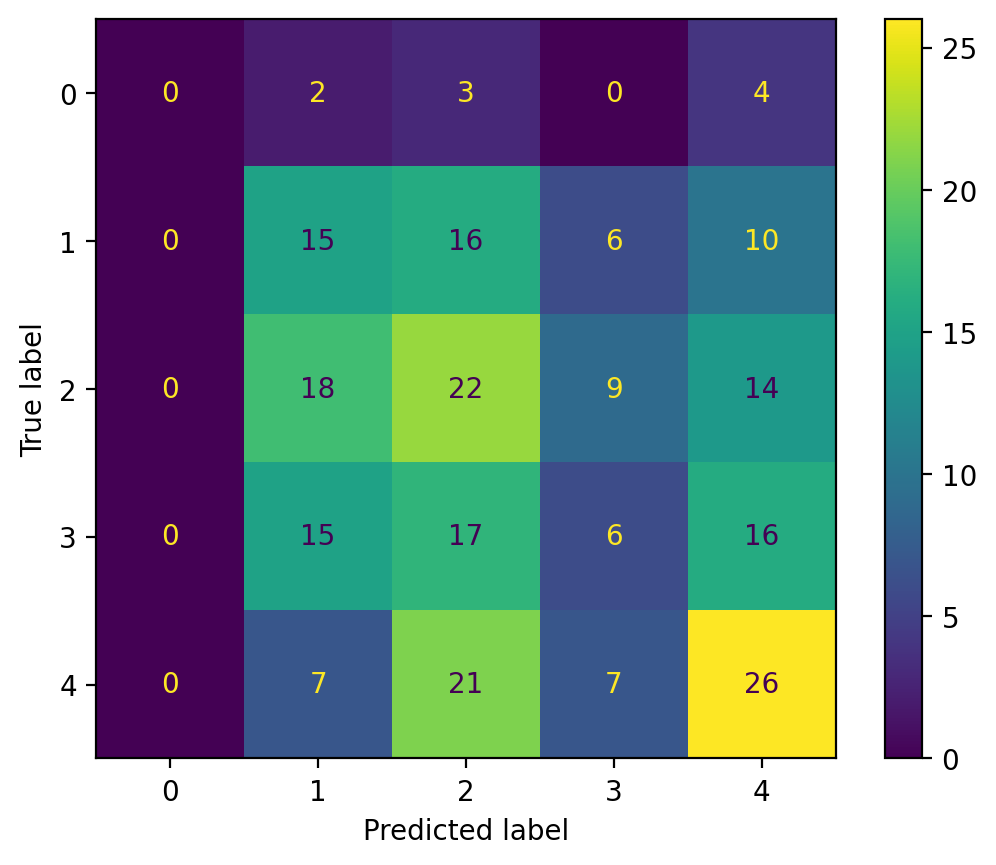

Accuracy: 0.2948717948717949
Precision: 0.2741081037550058
Recall: 0.2948717948717949
F1 Score: 0.2786111049173555


<Figure size 600x400 with 0 Axes>

(0.0, 1.0)

(0.0, 1.05)

Text(0.5, 0, 'False Positive Rate')

Text(0, 0.5, 'True Positive Rate')

Text(0.5, 1.0, 'Receiver Operating Characteristic for multi-class')

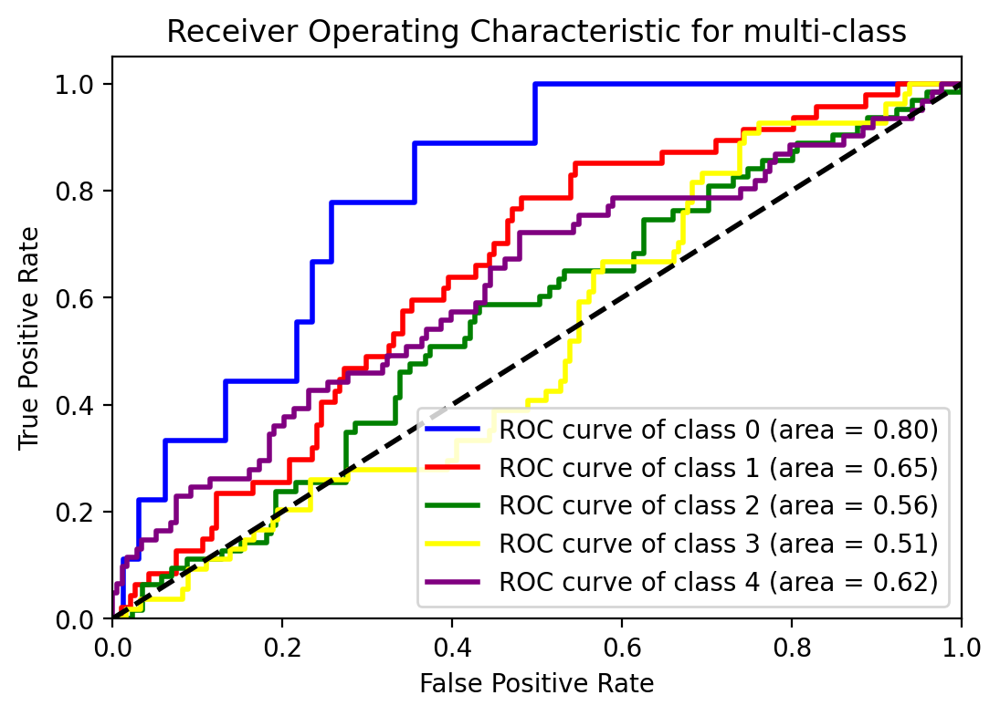

RandomForestClassifier(max_features=0.5, min_samples_leaf=3,
                       min_samples_split=11, n_estimators=55)

Test set metrics:
               precision    recall  f1-score   support

         0.0       0.00      0.00      0.00         9
         1.0       0.33      0.38      0.35        47
         2.0       0.31      0.41      0.35        63
         3.0       0.23      0.11      0.15        54
         4.0       0.41      0.46      0.43        61

    accuracy                           0.33       234
   macro avg       0.26      0.27      0.26       234
weighted avg       0.31      0.33      0.31       234



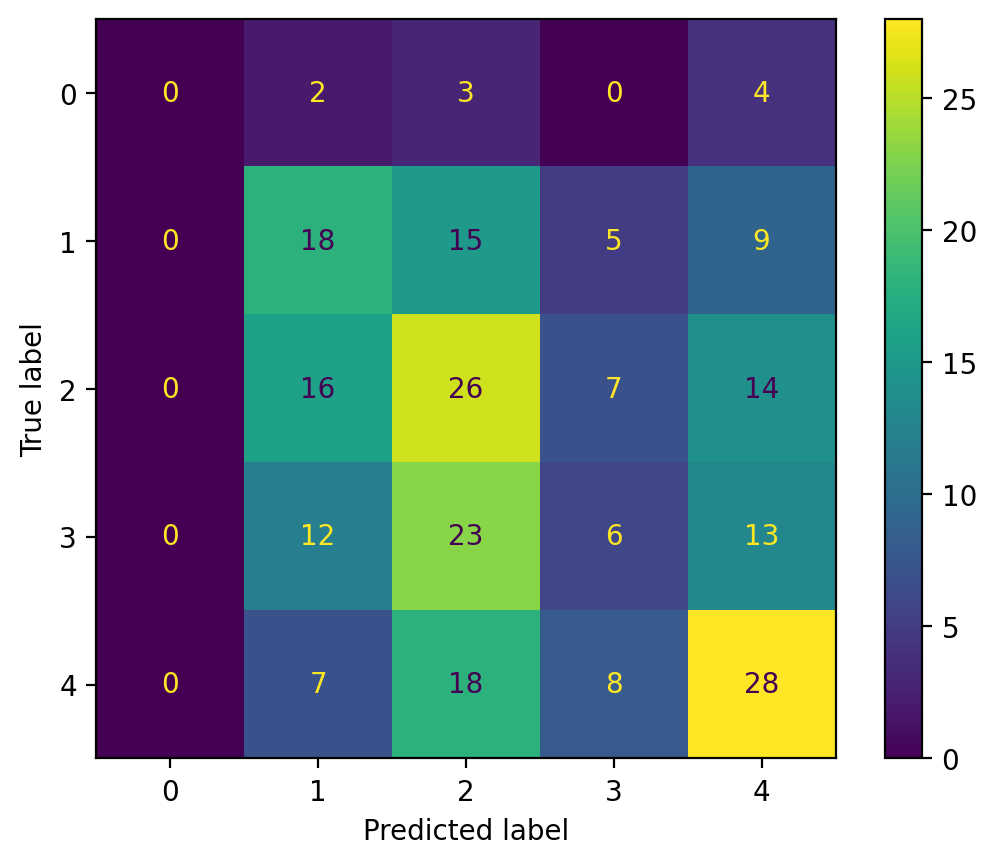

Accuracy: 0.3333333333333333
Precision: 0.30868201682681323
Recall: 0.3333333333333333
F1 Score: 0.3132649170268869


<Figure size 600x400 with 0 Axes>

(0.0, 1.0)

(0.0, 1.05)

Text(0.5, 0, 'False Positive Rate')

Text(0, 0.5, 'True Positive Rate')

Text(0.5, 1.0, 'Receiver Operating Characteristic for multi-class')

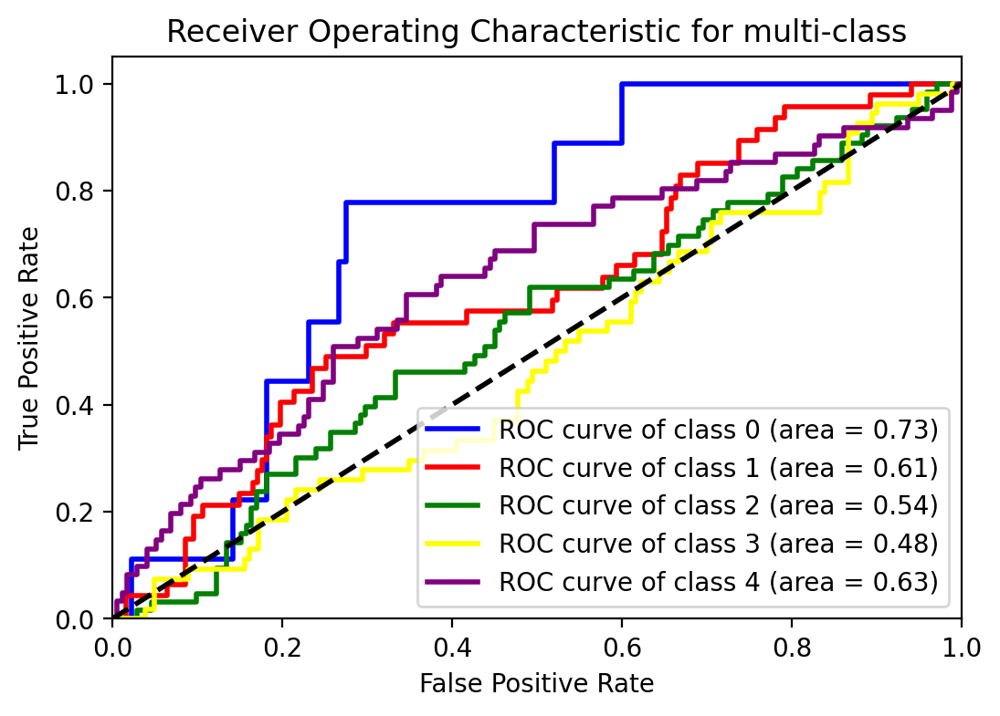

In [141]:
# Набори параметрів для кожного методу налаштування гіперпараметрів
param_sets = [
    {'bootstrap': False, 'max_features': 0.5, 'min_samples_leaf': 4, 'min_samples_split': 15, 'n_estimators': 35},
    {'n_estimators': 45, 'min_samples_split': 15, 'min_samples_leaf': 4, 'max_features': 0.6, 'bootstrap': True},
    {'bootstrap': True, 'max_features': 0.5, 'min_samples_leaf': 3, 'min_samples_split': 11, 'n_estimators': 55}
]

# Цикл по кожному набору параметрів
for params in param_sets:
    rf = RandomForestClassifier(**params)
    rf.fit(X_train, y_train)
    y_pred = rf.predict(X_test)
    y_prob = rf.predict_proba(X_test)

    # Виведення метрик класифікації
    print('Test set metrics:\n', metrics.classification_report(y_test, y_pred))
    disp = ConfusionMatrixDisplay(confusion_matrix(y_test, y_pred))
    disp.plot();
    plt.show();

    accuracy = metrics.accuracy_score(y_test, y_pred)
    precision = metrics.precision_score(y_test, y_pred, average='weighted')
    recall = metrics.recall_score(y_test, y_pred, average='weighted')
    f1 = metrics.f1_score(y_test, y_pred, average='weighted')

    print("Accuracy:", accuracy)
    print("Precision:", precision)
    print("Recall:", recall)
    print("F1 Score:", f1)

    # Візуалізація ROC кривих
    fpr, tpr, roc_auc = {}, {}, {}
    n_classes = y_prob.shape[1]

    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test, y_prob[:, i], pos_label=i)
        roc_auc[i] = auc(fpr[i], tpr[i])

    plt.figure(figsize=(6, 4))
    colors = ['blue', 'red', 'green', 'yellow', 'purple']

    for i, color in zip(range(n_classes), colors):
        plt.plot(fpr[i], tpr[i], color=color, lw=2,
                 label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

    plt.plot([0, 1], [0, 1], 'k--', lw=2);
    plt.xlim([0.0, 1.0]);
    plt.ylim([0.0, 1.05]);
    plt.xlabel('False Positive Rate');
    plt.ylabel('True Positive Rate');
    plt.title('Receiver Operating Characteristic for multi-class');
    plt.legend(loc="lower right");
    plt.show();


## Незбалансовані класи

In [158]:
y.value_counts()

AdoptionSpeed
2.0              314
4.0              296
3.0              255
1.0              253
0.0               52
Name: count, dtype: int64

In [159]:
# display size
X.shape, y.shape

((1170, 28), (1170, 1))

In [160]:
X.head()

,Type,Age,Gender,MaturitySize,FurLength,Vaccinated,Dewormed,Sterilized,Health,Quantity,Fee,VideoAmt,PhotoAmt,BreedName_x,BreedName_y,StateName_x,ColorName_x_Brown,ColorName_x_Cream,ColorName_x_Golden,ColorName_x_Yellow,ColorName_y_Cream,ColorName_y_Golden,ColorName_y_Gray,ColorName_y_Yellow,ColorName_Golden,ColorName_Gray,ColorName_White,ColorName_Yellow
0,2.0,0.03125,2.0,2.0,1.0,2.0,1.0,2.0,1.0,0.000000,0.066667,0.0,0.233333,0.0,2.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2.0,0.06250,3.0,1.0,2.0,2.0,2.0,2.0,1.0,0.052632,0.000000,0.0,0.066667,1.0,2.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2.0,0.06250,3.0,1.0,1.0,1.0,1.0,2.0,1.0,0.052632,0.000000,0.0,0.166667,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2.0,0.03125,2.0,1.0,1.0,3.0,3.0,3.0,1.0,0.000000,0.000000,0.0,0.133333,2.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1.0,0.06250,1.0,2.0,2.0,2.0,2.0,2.0,1.0,0.000000,0.000000,0.0,0.033333,3.0,3.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [176]:
from sklearn.preprocessing import LabelEncoder

# Перетворення міток класів у числові
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

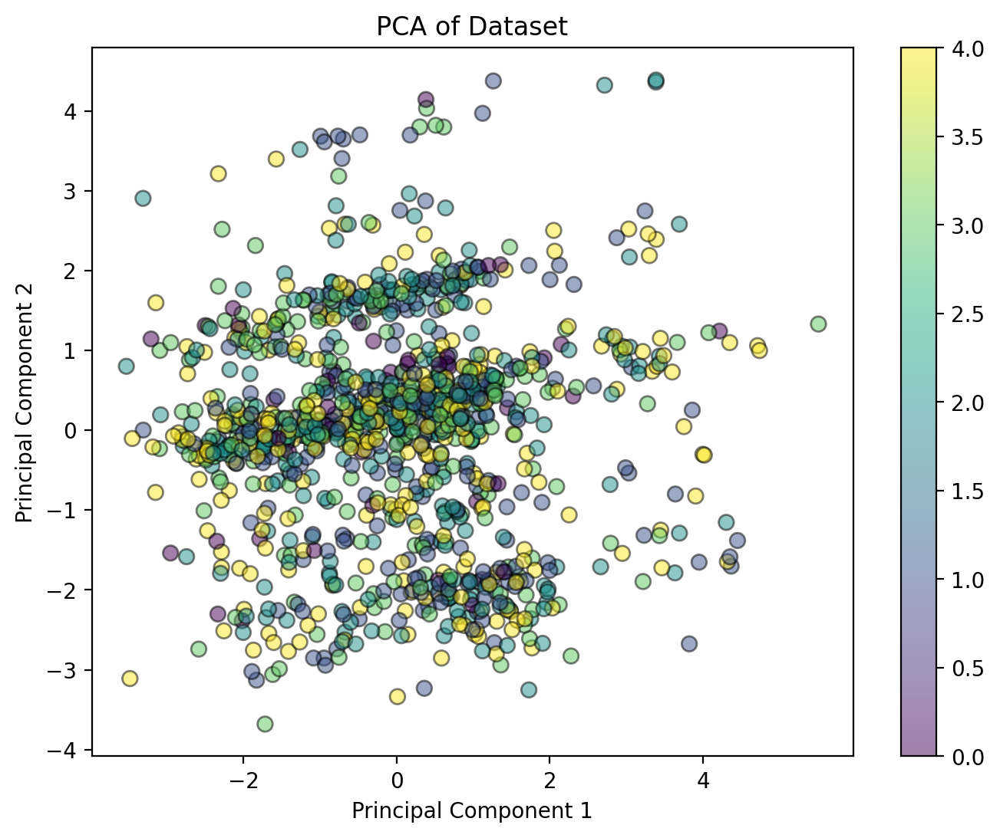

In [212]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np

# Нормалізація даних
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)  # X - ваші ознаки без цільової змінної

# PCA для зменшення розмірності до 2D
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# Створення графіка
plt.figure(figsize=(8, 6));
scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_encoded, cmap='viridis', edgecolor='k', s=50, alpha=0.5);
plt.xlabel('Principal Component 1');
plt.ylabel('Principal Component 2');
plt.title('PCA of Dataset');
plt.colorbar(scatter);
plt.show();

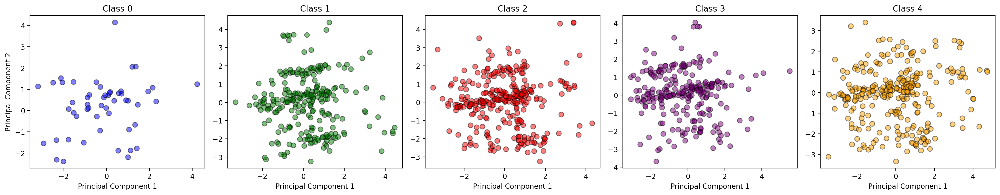

In [213]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Нормалізація даних
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)  # X - ваші ознаки без цільової змінної

# PCA для зменшення розмірності до 2D
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# Створення п'яти окремих діаграм для кожного класу
fig, axes = plt.subplots(1, 5, figsize=(20, 4))  # 5 графіків в одному ряду

classes = np.unique(y_encoded)  # Припускаю, що y_encoded - це ваша цільова змінна
colors = ['blue', 'green', 'red', 'purple', 'orange']  # Кольори для кожного класу

for i, ax in enumerate(axes):
    class_mask = y_encoded == classes[i]
    ax.scatter(X_pca[class_mask, 0], X_pca[class_mask, 1], color=colors[i], edgecolor='k', s=50, alpha=0.5);
    ax.set_title(f'Class {classes[i]}');
    ax.set_xlabel('Principal Component 1');
    if i == 0:
        ax.set_ylabel('Principal Component 2');

plt.tight_layout();
plt.show();

<div style="text-align: center;">
    <img src="large.png" alt="Порівняння" width="800"/>
</div>

<div style="text-align: center;">
    <img src="AdoptionSpeed.png" alt="Порівняння" width="400"/>
</div>

### Random Over-sampling

In [199]:
ros = RandomOverSampler(
    sampling_strategy='auto', # samples only the minority class
    random_state=0,  # for reproducibility
)  

X_res, y_res = ros.fit_resample(X, y)

In [200]:
# size of original data

X.shape, y.shape

((1170, 28), (1170, 1))

In [201]:
# size of undersampled data

X_res.shape, y_res.shape

((1570, 28), (1570, 1))

In [202]:
# number of minority class observations

y.value_counts(), y_res.value_counts()

(AdoptionSpeed
 2.0              314
 4.0              296
 3.0              255
 1.0              253
 0.0               52
 Name: count, dtype: int64,
 AdoptionSpeed
 0.0              314
 1.0              314
 2.0              314
 3.0              314
 4.0              314
 Name: count, dtype: int64)

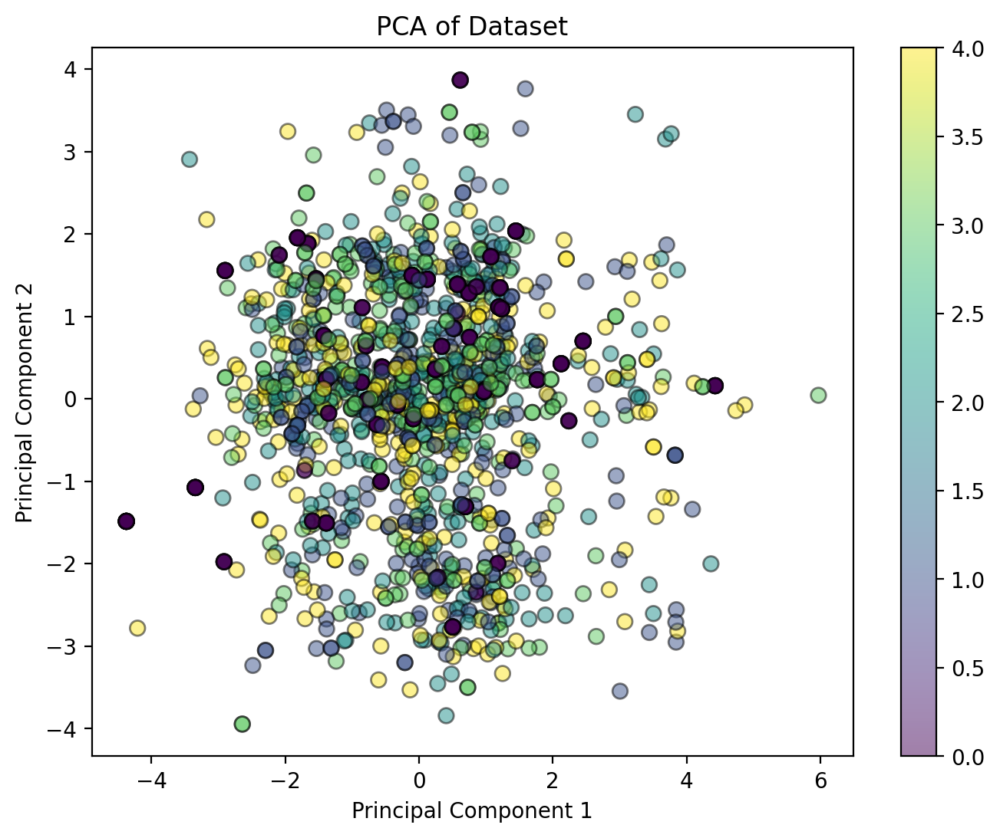

In [214]:
label_encoder = LabelEncoder()
y_res_encoded = label_encoder.fit_transform(y_res)

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_res) 

# PCA для зменшення розмірності до 2D
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# Створення графіка
plt.figure(figsize=(8, 6));
scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_res_encoded, cmap='viridis', edgecolor='k', s=50, alpha=0.5);
plt.xlabel('Principal Component 1');
plt.ylabel('Principal Component 2');
plt.title('PCA of Dataset');
plt.colorbar(scatter);
plt.show();

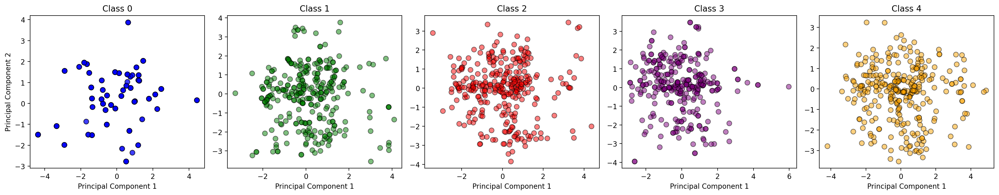

In [215]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_res)

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

fig, axes = plt.subplots(1, 5, figsize=(20, 4))

classes = np.unique(y_res_encoded) 
colors = ['blue', 'green', 'red', 'purple', 'orange']

for i, ax in enumerate(axes):
    class_mask = y_res_encoded == classes[i]
    ax.scatter(X_pca[class_mask, 0], X_pca[class_mask, 1], color=colors[i], edgecolor='k', s=50, alpha=0.5);
    ax.set_title(f'Class {classes[i]}');
    ax.set_xlabel('Principal Component 1');
    if i == 0:
        ax.set_ylabel('Principal Component 2');

plt.tight_layout();
plt.show();

<div style="text-align: center;">
    <img src="base.png" alt="Порівняння" width="1800"/>
</div>

### SMOTE

In [217]:
sm = SMOTE(
    sampling_strategy='auto',  # samples only the minority class
    random_state=0,  # for reproducibility
    k_neighbors=5,
    n_jobs=4
)

X_res_sm, y_res_sm = sm.fit_resample(X, y)

In [218]:
# size of original data

X.shape, y.shape

((1170, 28), (1170, 1))

In [219]:
# size of undersampled data

X_res_sm.shape, y_res_sm.shape

((1570, 28), (1570, 1))

In [220]:
# number of minority class observations

y.value_counts(), y_res_sm.value_counts()

(AdoptionSpeed
 2.0              314
 4.0              296
 3.0              255
 1.0              253
 0.0               52
 Name: count, dtype: int64,
 AdoptionSpeed
 0.0              314
 1.0              314
 2.0              314
 3.0              314
 4.0              314
 Name: count, dtype: int64)

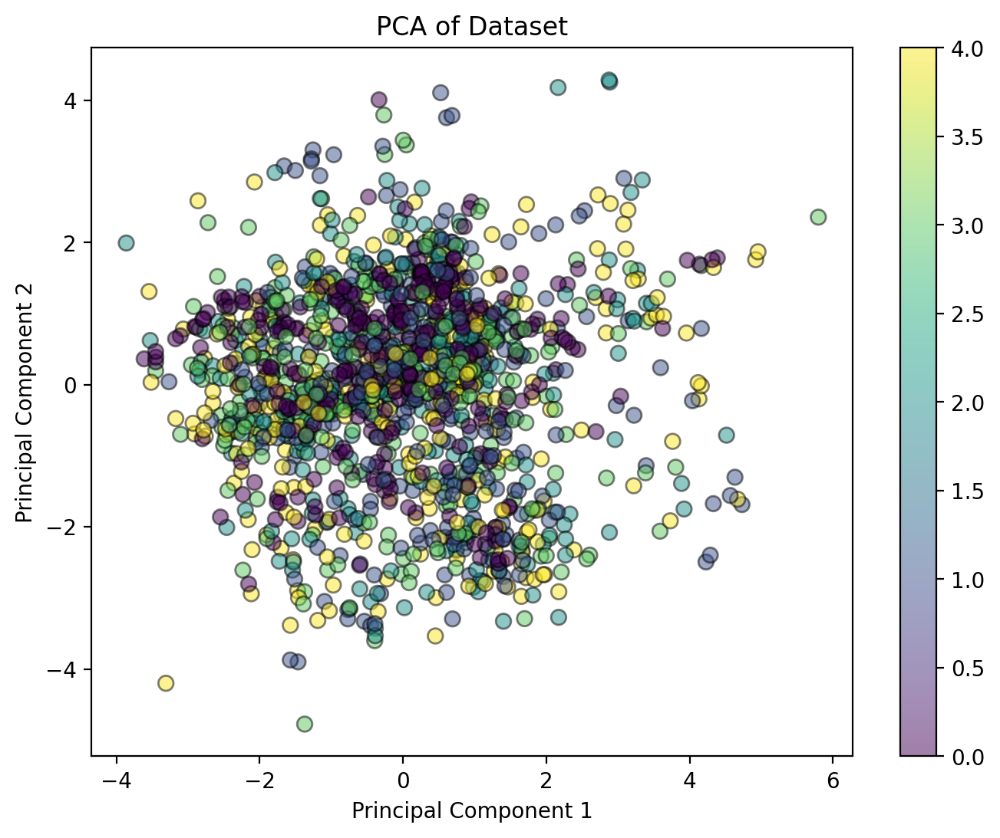

In [221]:
label_encoder = LabelEncoder()
y_res_sm_encoded = label_encoder.fit_transform(y_res_sm)

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_res_sm) 

# PCA для зменшення розмірності до 2D
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# Створення графіка
plt.figure(figsize=(8, 6));
scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_res_sm_encoded, cmap='viridis', edgecolor='k', s=50, alpha=0.5);
plt.xlabel('Principal Component 1');
plt.ylabel('Principal Component 2');
plt.title('PCA of Dataset');
plt.colorbar(scatter);
plt.show();

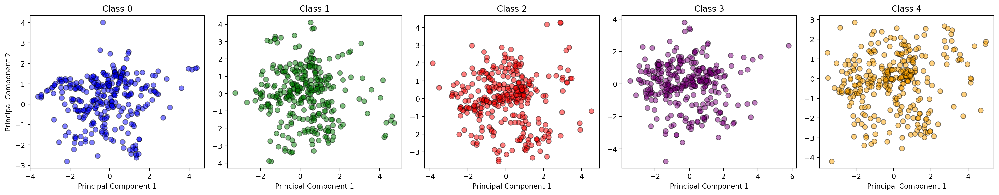

In [222]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_res_sm)

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

fig, axes = plt.subplots(1, 5, figsize=(20, 4))

classes = np.unique(y_res_sm_encoded) 
colors = ['blue', 'green', 'red', 'purple', 'orange']

for i, ax in enumerate(axes):
    class_mask = y_res_sm_encoded == classes[i]
    ax.scatter(X_pca[class_mask, 0], X_pca[class_mask, 1], color=colors[i], edgecolor='k', s=50, alpha=0.5);
    ax.set_title(f'Class {classes[i]}');
    ax.set_xlabel('Principal Component 1');
    if i == 0:
        ax.set_ylabel('Principal Component 2');

plt.tight_layout();
plt.show();

<div style="text-align: center;">
    <img src="base.png" alt="Порівняння" width="1800"/>
</div>

### Random Undersampling

In [226]:
from imblearn.under_sampling import RandomUnderSampler

# set up the random undersampling class

rus = RandomUnderSampler(
    sampling_strategy='auto',  # samples only the majority class
    random_state=0,  # for reproducibility
    replacement=True # if it should resample with replacement
)  

X_resampled, y_resampled = rus.fit_resample(X, y)

In [227]:
# size of original data

X.shape, y.shape

((1170, 28), (1170, 1))

In [228]:
# size of undersampled data

X_resampled.shape, y_resampled.shape

((260, 28), (260, 1))

In [230]:
# number of minority class observations

y.value_counts(), y_resampled.value_counts()

(AdoptionSpeed
 2.0              314
 4.0              296
 3.0              255
 1.0              253
 0.0               52
 Name: count, dtype: int64,
 AdoptionSpeed
 0.0              52
 1.0              52
 2.0              52
 3.0              52
 4.0              52
 Name: count, dtype: int64)

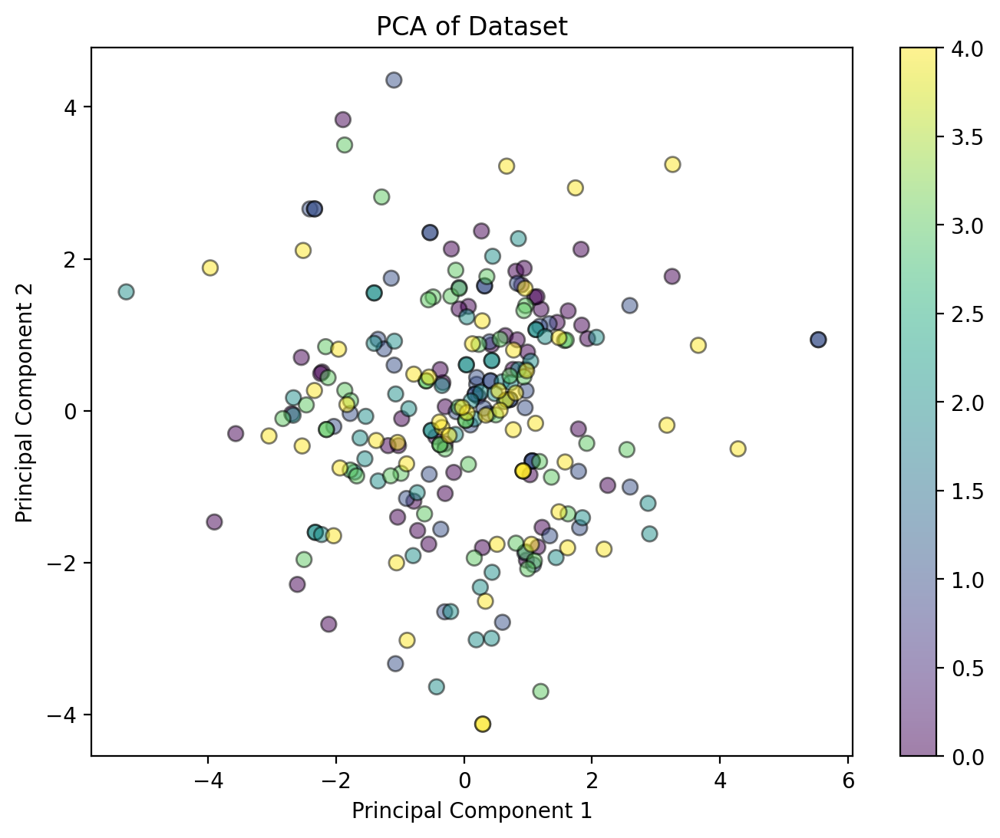

In [231]:
label_encoder = LabelEncoder()
y_resampled_encoded = label_encoder.fit_transform(y_resampled)

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_resampled) 

# PCA для зменшення розмірності до 2D
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# Створення графіка
plt.figure(figsize=(8, 6));
scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_resampled_encoded, cmap='viridis', edgecolor='k', s=50, alpha=0.5);
plt.xlabel('Principal Component 1');
plt.ylabel('Principal Component 2');
plt.title('PCA of Dataset');
plt.colorbar(scatter);
plt.show();

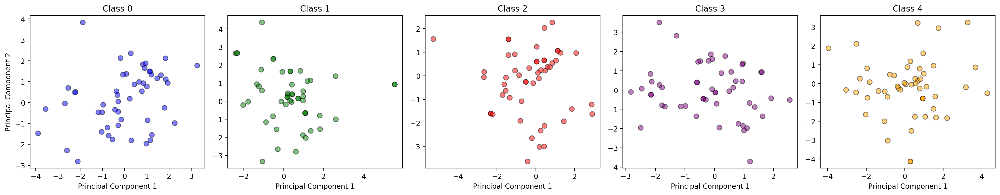

In [232]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_resampled)

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

fig, axes = plt.subplots(1, 5, figsize=(20, 4))

classes = np.unique(y_resampled_encoded) 
colors = ['blue', 'green', 'red', 'purple', 'orange']

for i, ax in enumerate(axes):
    class_mask = y_resampled_encoded == classes[i]
    ax.scatter(X_pca[class_mask, 0], X_pca[class_mask, 1], color=colors[i], edgecolor='k', s=50, alpha=0.5);
    ax.set_title(f'Class {classes[i]}');
    ax.set_xlabel('Principal Component 1');
    if i == 0:
        ax.set_ylabel('Principal Component 2');

plt.tight_layout();
plt.show();

<div style="text-align: center;">
    <img src="base.png" alt="Порівняння" width="1800"/>
</div>

### Tomek Links

In [237]:
from imblearn.under_sampling import TomekLinks

# set up Tomek Links

tl = TomekLinks(
    sampling_strategy='auto',  # undersamples only the majority class
    n_jobs=-1)

X_resampled, y_resampled = tl.fit_resample(X, y)

In [238]:
# size of original data

X.shape, y.shape

((1170, 28), (1170, 1))

In [239]:
# size of undersampled data

X_resampled.shape, y_resampled.shape

((809, 28), (809, 1))

In [240]:
# number of minority class observations

y.value_counts(), y_resampled.value_counts()

(AdoptionSpeed
 2.0              314
 4.0              296
 3.0              255
 1.0              253
 0.0               52
 Name: count, dtype: int64,
 AdoptionSpeed
 4.0              223
 2.0              211
 1.0              171
 3.0              152
 0.0               52
 Name: count, dtype: int64)

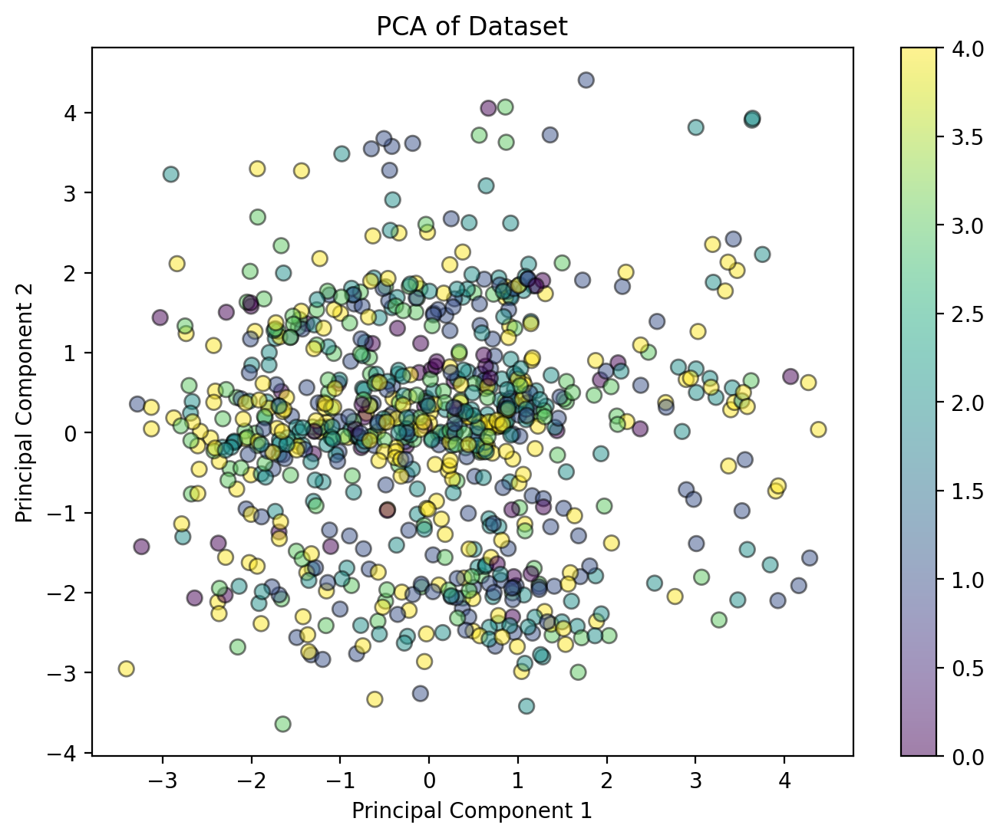

In [241]:
label_encoder = LabelEncoder()
y_resampled_encoded = label_encoder.fit_transform(y_resampled)

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_resampled) 

# PCA для зменшення розмірності до 2D
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# Створення графіка
plt.figure(figsize=(8, 6));
scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_resampled_encoded, cmap='viridis', edgecolor='k', s=50, alpha=0.5);
plt.xlabel('Principal Component 1');
plt.ylabel('Principal Component 2');
plt.title('PCA of Dataset');
plt.colorbar(scatter);
plt.show();

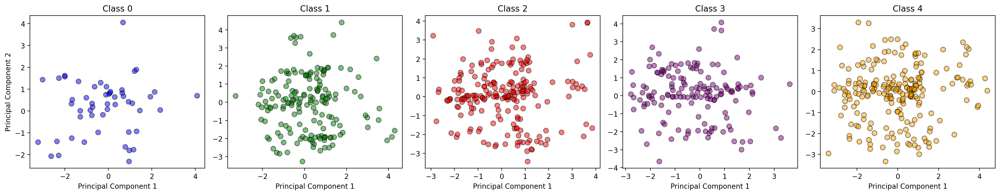

In [242]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_resampled)

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

fig, axes = plt.subplots(1, 5, figsize=(20, 4))

classes = np.unique(y_resampled_encoded) 
colors = ['blue', 'green', 'red', 'purple', 'orange']

for i, ax in enumerate(axes):
    class_mask = y_resampled_encoded == classes[i]
    ax.scatter(X_pca[class_mask, 0], X_pca[class_mask, 1], color=colors[i], edgecolor='k', s=50, alpha=0.5);
    ax.set_title(f'Class {classes[i]}');
    ax.set_xlabel('Principal Component 1');
    if i == 0:
        ax.set_ylabel('Principal Component 2');

plt.tight_layout();
plt.show();

<div style="text-align: center;">
    <img src="base.png" alt="Порівняння" width="1800"/>
</div>

### Тестування навчання моделі при кожному методі балансування

In [246]:
# Ініціалізація методів балансування
resampling_methods = {
    'random_over': RandomOverSampler(sampling_strategy='auto', random_state=0),
    'smote': SMOTE(sampling_strategy='auto', random_state=0, k_neighbors=5, n_jobs=4),
    'random_under': RandomUnderSampler(sampling_strategy='auto', random_state=0, replacement=True),
    'tomek_links': TomekLinks(sampling_strategy='auto', n_jobs=-1)
}

In [269]:
import matplotlib.pyplot as plt
from sklearn import metrics
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc, confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from collections import Counter

def train_and_evaluate(X, y, sampler=None, sampler_name="No balancing"):
    print(f"==================================== {sampler_name} ====================================")
    
    # Розділення даних на тренувальні та тестові вибірки
    X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state=42)

    print("Класи до балансування:", y_train.value_counts())

    # Застосування методу балансування (якщо вказано)
    if sampler:
        X_train, y_train = sampler.fit_resample(X_train, y_train)
        print("Класи після балансування:", (y_train.value_counts()))

    label_encoder = LabelEncoder()
    y_encoded = label_encoder.fit_transform(y_train)

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X_train)

    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X_scaled)

    fig, axes = plt.subplots(1, 5, figsize=(20, 4))

    classes = np.unique(y_encoded) 
    colors = ['blue', 'green', 'red', 'purple', 'orange']

    for i, ax in enumerate(axes):
        class_mask = y_encoded == classes[i]
        ax.scatter(X_pca[class_mask, 0], X_pca[class_mask, 1], color=colors[i], edgecolor='k', s=50, alpha=0.5);
        ax.set_title(f'Class {classes[i]}');
        ax.set_xlabel('Principal Component 1');
        if i == 0:
            ax.set_ylabel('Principal Component 2');

    plt.tight_layout();
    plt.show();

    # Стандартизація даних
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Створення моделі
    rf = RandomForestClassifier(max_features=5, n_estimators=100, random_state=42)
    rf.fit(X_train_scaled, y_train)

    # Оцінка моделі
    y_pred = rf.predict(X_test_scaled)
    y_prob = rf.predict_proba(X_test_scaled)

    # Розрахунок метрик
    accuracy = metrics.accuracy_score(y_test, y_pred)
    precision = metrics.precision_score(y_test, y_pred, average='weighted')
    recall = metrics.recall_score(y_test, y_pred, average='weighted')
    f1 = metrics.f1_score(y_test, y_pred, average='weighted')

    print('Test set metrics:\n', metrics.classification_report(y_test, y_pred))
    print("Accuracy:", accuracy)
    print("Precision:", precision)
    print("Recall:", recall)
    print("F1 Score:", f1)

    # Виведення матриці помилок
    conf_matrix = metrics.confusion_matrix(y_test, y_pred)
    disp = ConfusionMatrixDisplay(conf_matrix)
    disp.plot()
    plt.show()

    # ROC AUC
    fpr, tpr, roc_auc = {}, {}, {}
    n_classes = y_prob.shape[1]
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test == i, y_prob[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
        print(f'ROC AUC for class {i}: {roc_auc[i]:.2f}')

    # Побудова ROC-кривих для кожного класу
    plt.figure(figsize=(6, 4))
    colors = ['blue', 'red', 'green', 'yellow', 'purple']
    for i, color in zip(range(n_classes), colors):
        plt.plot(fpr[i], tpr[i], color=color, lw=2,
                 label=f'ROC curve of class {i} (area = {roc_auc[i]:.2f})')
    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic for multi-class')
    plt.legend(loc="lower right")
    plt.show()

    return accuracy, precision, recall, f1, roc_auc

==================================== random_over ====================================
Класи до балансування: AdoptionSpeed
2.0              239
4.0              239
1.0              208
3.0              205
0.0               45
Name: count, dtype: int64
Класи після балансування: AdoptionSpeed
0.0              239
1.0              239
2.0              239
3.0              239
4.0              239
Name: count, dtype: int64


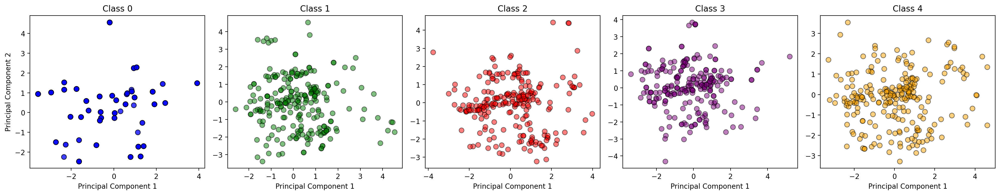

Test set metrics:
               precision    recall  f1-score   support

         0.0       0.00      0.00      0.00         7
         1.0       0.27      0.31      0.29        45
         2.0       0.28      0.23      0.25        75
         3.0       0.27      0.34      0.30        50
         4.0       0.41      0.40      0.41        57

    accuracy                           0.30       234
   macro avg       0.25      0.26      0.25       234
weighted avg       0.30      0.30      0.30       234

Accuracy: 0.3034188034188034
Precision: 0.30029129227847173
Recall: 0.3034188034188034
F1 Score: 0.299685330004948


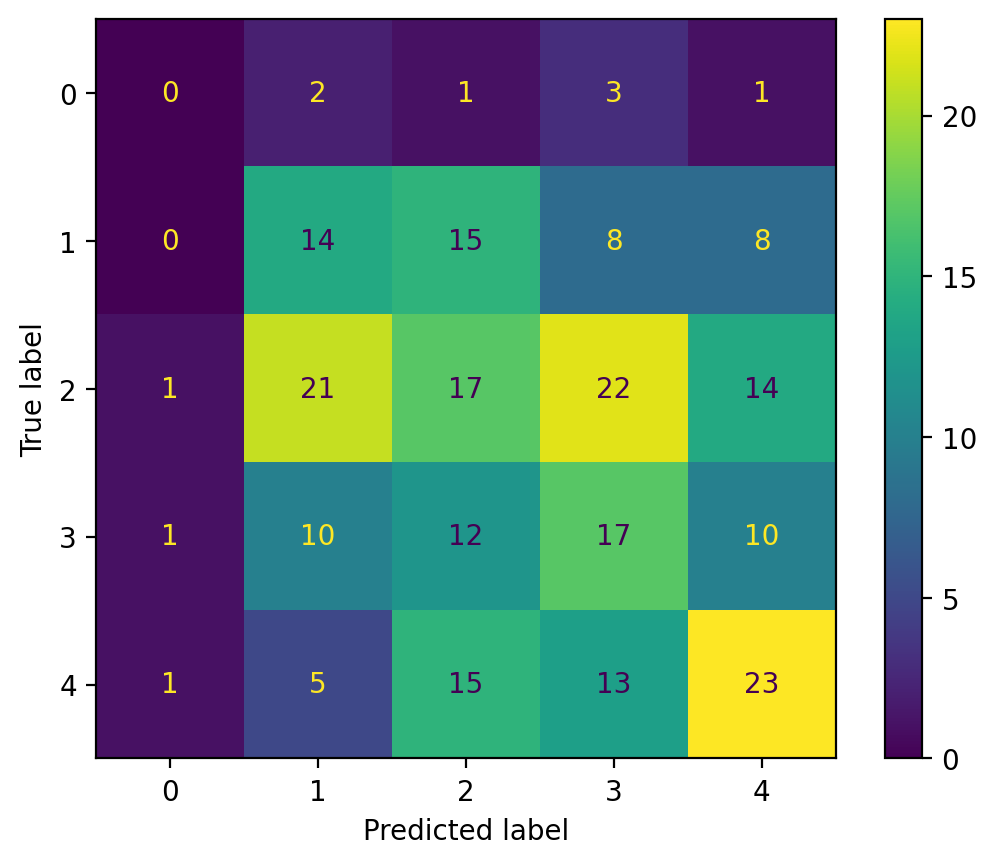

ROC AUC for class 0: 0.54
ROC AUC for class 1: 0.63
ROC AUC for class 2: 0.51
ROC AUC for class 3: 0.60
ROC AUC for class 4: 0.67


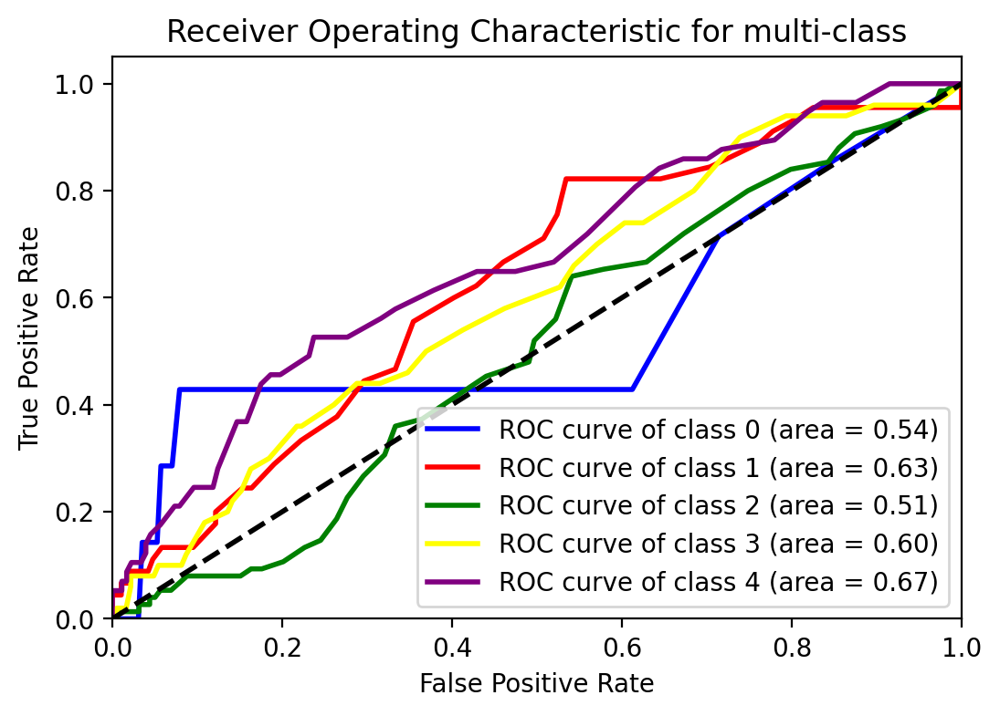

==================================== smote ====================================
Класи до балансування: AdoptionSpeed
2.0              239
4.0              239
1.0              208
3.0              205
0.0               45
Name: count, dtype: int64
Класи після балансування: AdoptionSpeed
0.0              239
1.0              239
2.0              239
3.0              239
4.0              239
Name: count, dtype: int64


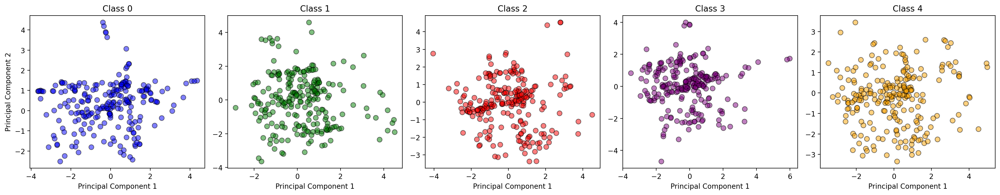

Test set metrics:
               precision    recall  f1-score   support

         0.0       0.33      0.14      0.20         7
         1.0       0.24      0.27      0.25        45
         2.0       0.26      0.24      0.25        75
         3.0       0.31      0.36      0.33        50
         4.0       0.42      0.39      0.40        57

    accuracy                           0.30       234
   macro avg       0.31      0.28      0.29       234
weighted avg       0.31      0.30      0.30       234

Accuracy: 0.3034188034188034
Precision: 0.3063637797031954
Recall: 0.3034188034188034
F1 Score: 0.30275589892738797


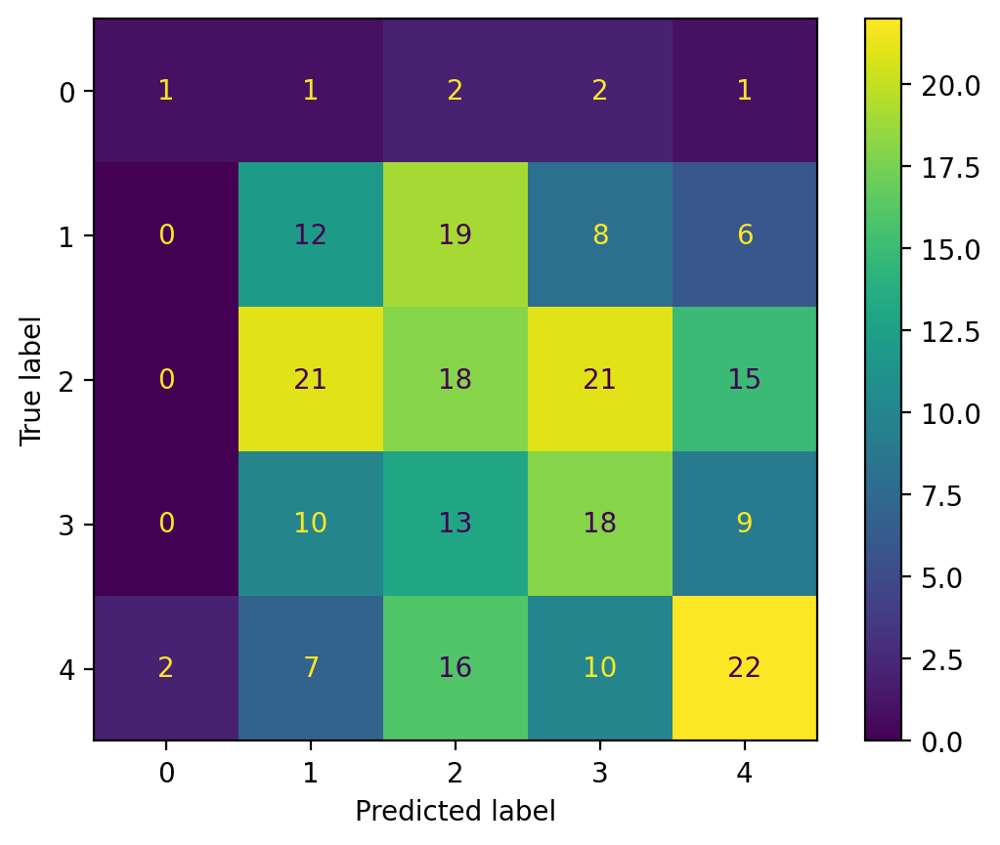

ROC AUC for class 0: 0.50
ROC AUC for class 1: 0.60
ROC AUC for class 2: 0.50
ROC AUC for class 3: 0.59
ROC AUC for class 4: 0.62


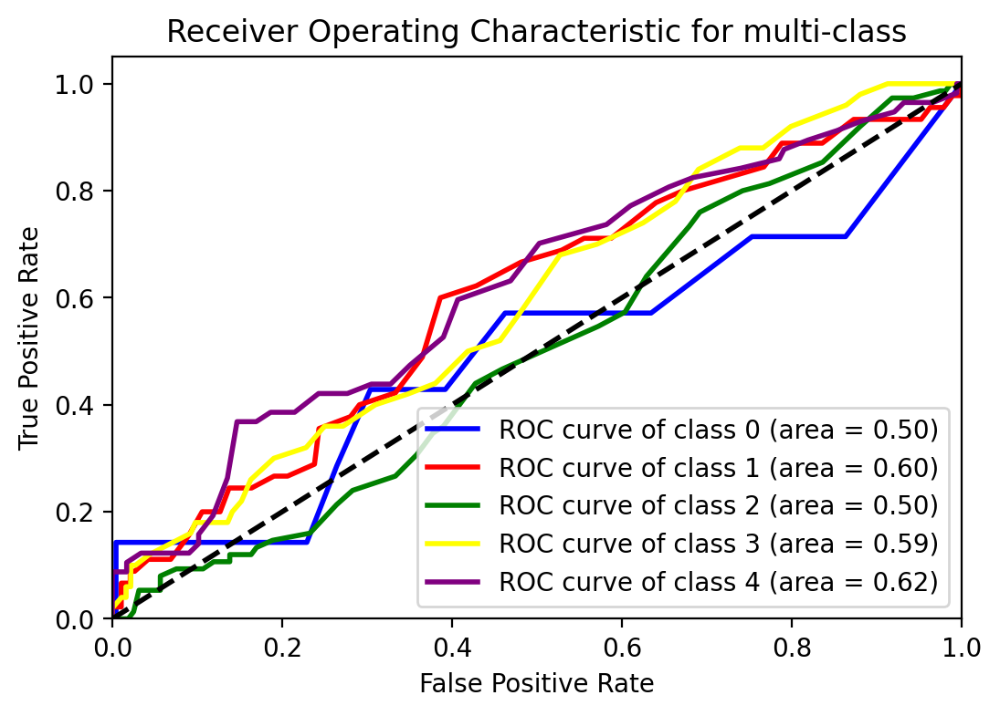

==================================== random_under ====================================
Класи до балансування: AdoptionSpeed
2.0              239
4.0              239
1.0              208
3.0              205
0.0               45
Name: count, dtype: int64
Класи після балансування: AdoptionSpeed
0.0              45
1.0              45
2.0              45
3.0              45
4.0              45
Name: count, dtype: int64


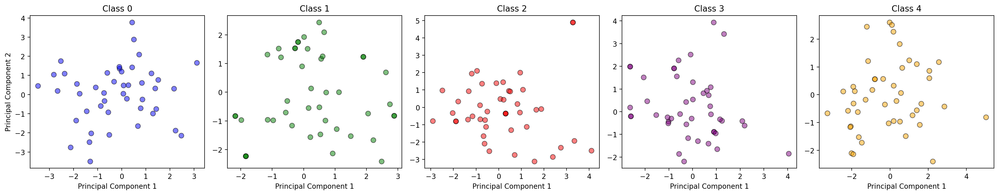

Test set metrics:
               precision    recall  f1-score   support

         0.0       0.02      0.14      0.03         7
         1.0       0.27      0.27      0.27        45
         2.0       0.33      0.24      0.28        75
         3.0       0.25      0.20      0.22        50
         4.0       0.31      0.23      0.26        57

    accuracy                           0.23       234
   macro avg       0.24      0.22      0.21       234
weighted avg       0.29      0.23      0.25       234

Accuracy: 0.23076923076923078
Precision: 0.2874997120280139
Recall: 0.23076923076923078
F1 Score: 0.2531810853516279


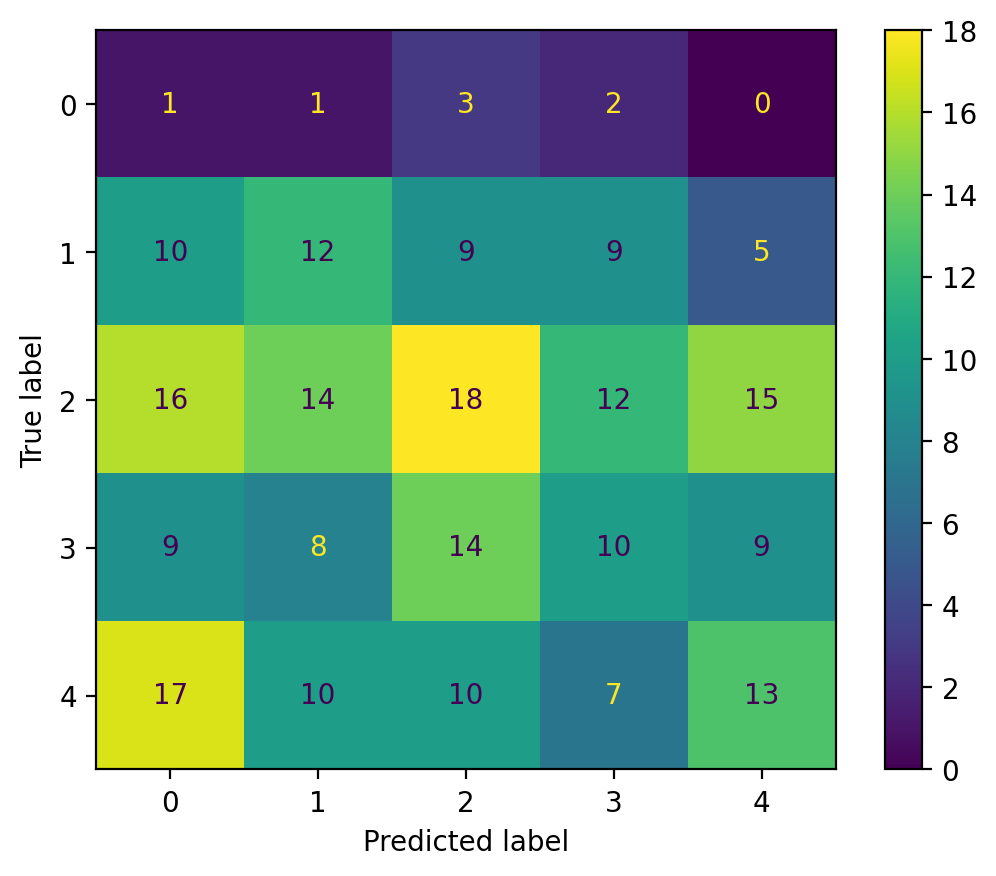

ROC AUC for class 0: 0.53
ROC AUC for class 1: 0.63
ROC AUC for class 2: 0.54
ROC AUC for class 3: 0.56
ROC AUC for class 4: 0.63


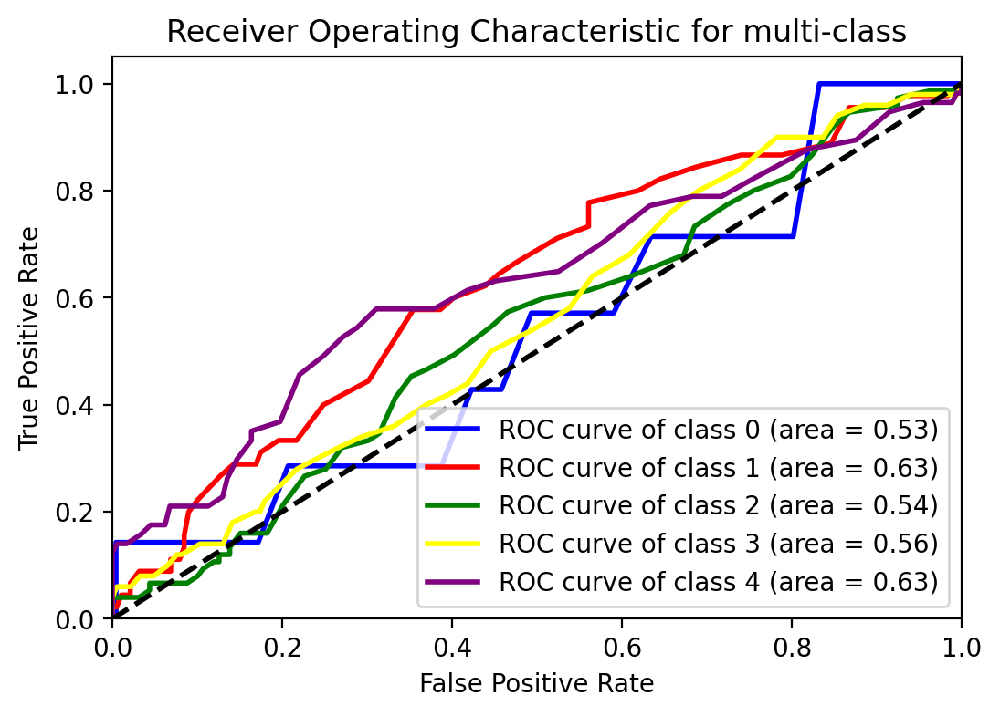

==================================== tomek_links ====================================
Класи до балансування: AdoptionSpeed
2.0              239
4.0              239
1.0              208
3.0              205
0.0               45
Name: count, dtype: int64
Класи після балансування: AdoptionSpeed
4.0              183
2.0              158
1.0              132
3.0              128
0.0               45
Name: count, dtype: int64


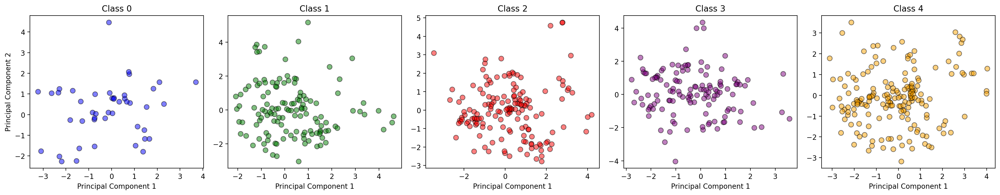

Test set metrics:
               precision    recall  f1-score   support

         0.0       0.00      0.00      0.00         7
         1.0       0.26      0.29      0.27        45
         2.0       0.31      0.24      0.27        75
         3.0       0.23      0.22      0.23        50
         4.0       0.38      0.51      0.44        57

    accuracy                           0.30       234
   macro avg       0.24      0.25      0.24       234
weighted avg       0.29      0.30      0.29       234

Accuracy: 0.3034188034188034
Precision: 0.29242730653222215
Recall: 0.3034188034188034
F1 Score: 0.2940764546841595


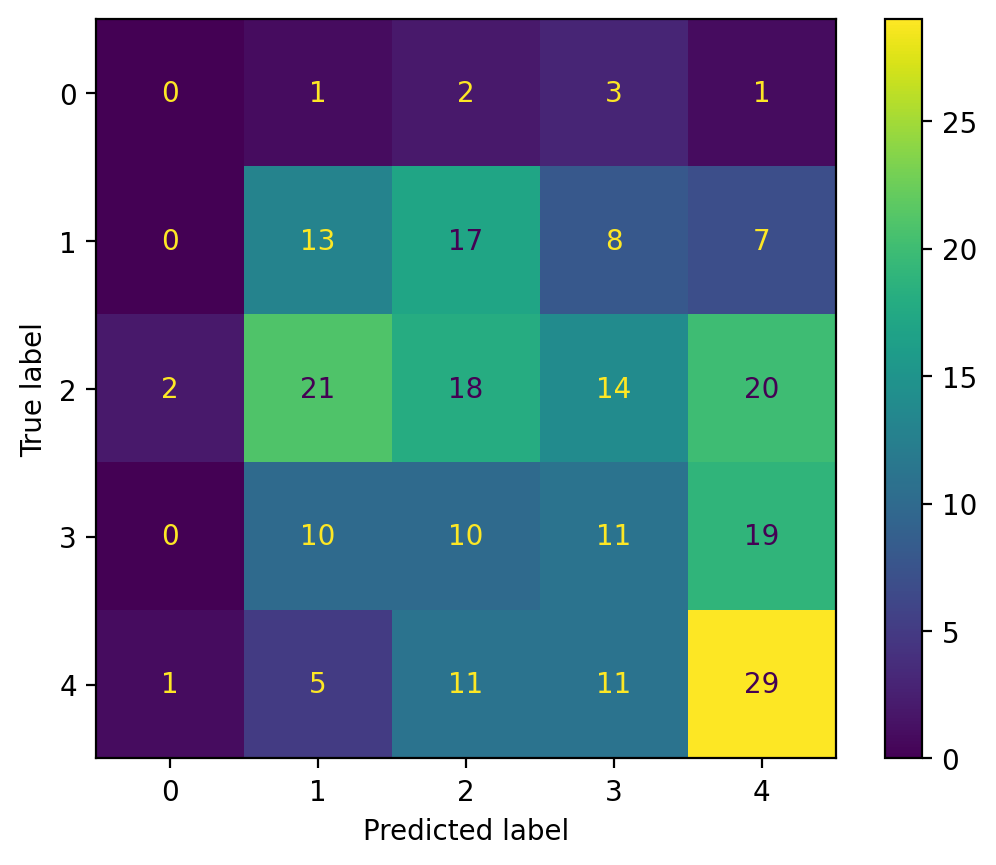

ROC AUC for class 0: 0.57
ROC AUC for class 1: 0.59
ROC AUC for class 2: 0.52
ROC AUC for class 3: 0.57
ROC AUC for class 4: 0.65


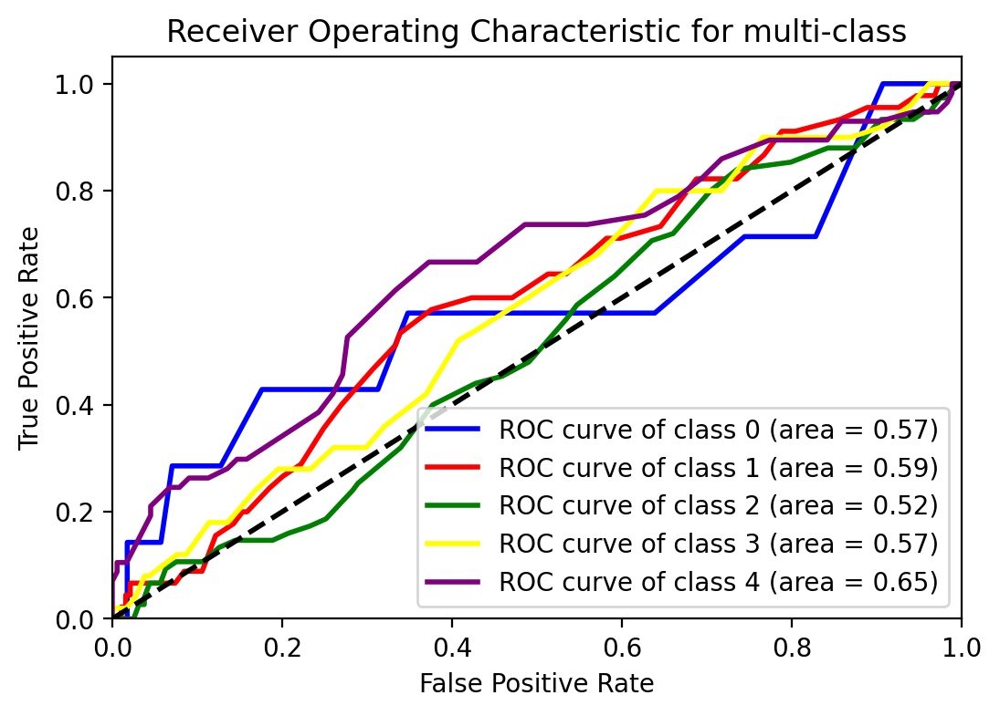

In [270]:
results = {}
for method_name, sampler in resampling_methods.items():
    accuracy, precision, recall, f1, roc_auc = train_and_evaluate(X, y, sampler=sampler, sampler_name=method_name)
    results[method_name] = {
        'accuracy': accuracy,
        'precision': precision,
        'recall': recall,
        'f1': f1,
        'roc_auc': roc_auc
    }

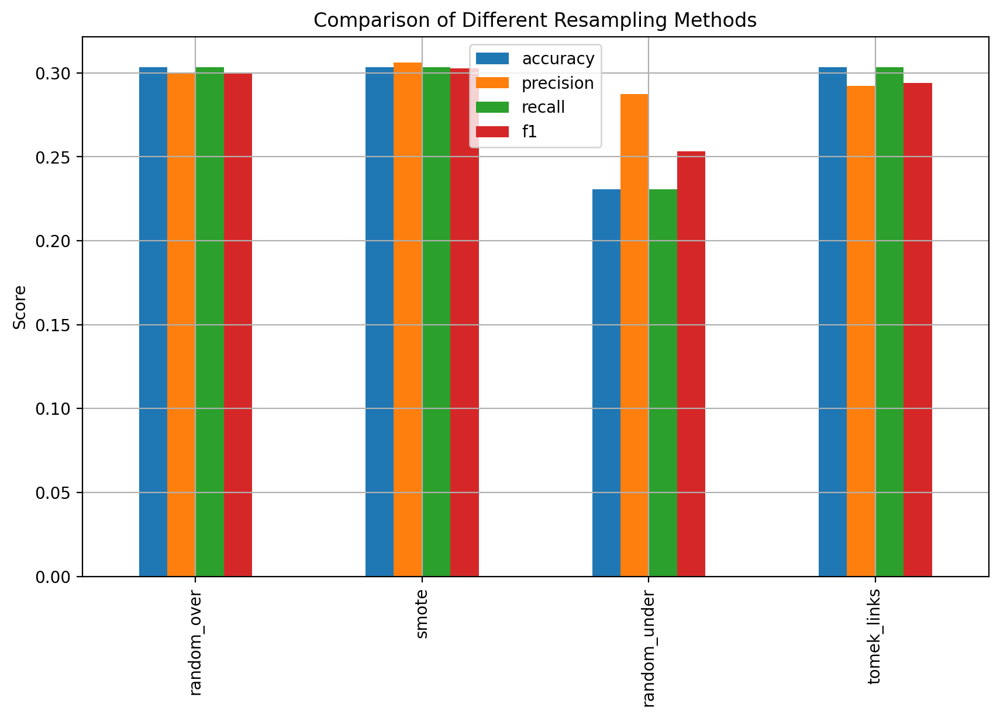

In [273]:
import matplotlib.pyplot as plt
import pandas as pd

metrics_df = pd.DataFrame(results).T
metrics_df.plot(kind='bar', figsize=(10, 6), title='Comparison of Different Resampling Methods');
plt.ylabel('Score');
plt.grid();
plt.show();

## Огляд результатів:

1. **Random Over-sampling:**

- Всі класи були збалансовані до однакової кількості зразків.
- Візуалізація PCA показує збільшення розсіяння даних у кожному класі.
- Модель має низьку точність і F1-скор по класах.
- ROC AUC варіюється від 0.54 до 0.67.

2. **SMOTE (Synthetic Minority Over-sampling Technique):**

- Створено синтетичні зразки для збалансування класів.
- PCA показує, що класи можуть бути краще відділеними один від одного порівняно з випадковим перевибіркою.
- Загальна точність трохи краща, ніж у випадкового перевибірки, але все ще низька.
- ROC AUC для класів покращений у деяких класах.

3. **Random Under-sampling:**

- Кількість зразків у кожному класі зменшена до кількості зразків у найменшому класі.
- PCA показує суттєве скорочення даних, що може призвести до втрати важливої інформації.
- Відносно найнижча загальна точність та F1-скор.
- ROC AUC має найнижчі значення серед усіх методів.

4. **Tomek Links (Under-sampling):**

- Усунення перекривань між класами видаленням окремих зразків.
- PCA показує невелике збільшення роздільної спроможності між деякими класами.
- Точність та F1-скор кращі, ніж при випадковому недовибірці.
- ROC AUC покращений, але не дуже високий.

**Висновок:**
- **SMOTE** виявився найбільш обнадійливим методом, оскільки забезпечив кращий баланс між точністю та здатністю до класифікації серед різних класів. Він також покращив ROC AUC для більшості класів.
- **Tomek Links** показав певне поліпшення порівняно з випадковою недовибіркою, що робить його потенційно корисним для додаткового дослідження у комбінації з іншими методами.
- **Random Over-sampling та Random Under-sampling** зазвичай мають нижчу продуктивність, що може бути пов'язано з втратою інформації або зі штучним збільшенням шуму в даних.

==================================== random_over ====================================
Класи до балансування: AdoptionSpeed
2.0              239
4.0              239
1.0              208
3.0              205
0.0               45
Name: count, dtype: int64
Класи після балансування: AdoptionSpeed
0.0              239
1.0              239
2.0              239
3.0              239
4.0              239
Name: count, dtype: int64


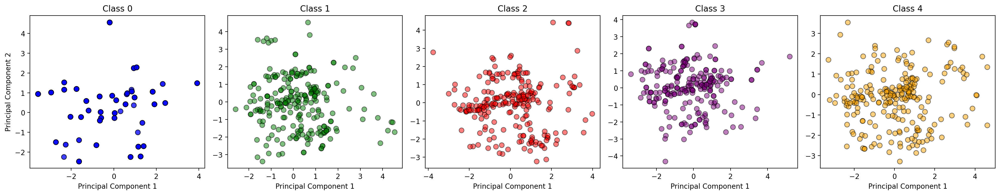

Test set metrics:
               precision    recall  f1-score   support

         0.0       0.05      0.14      0.07         7
         1.0       0.26      0.31      0.28        45
         2.0       0.25      0.19      0.21        75
         3.0       0.23      0.26      0.25        50
         4.0       0.37      0.30      0.33        57

    accuracy                           0.25       234
   macro avg       0.23      0.24      0.23       234
weighted avg       0.27      0.25      0.26       234

Accuracy: 0.25213675213675213
Precision: 0.27097097749271665
Recall: 0.25213675213675213
F1 Score: 0.25777884881660756


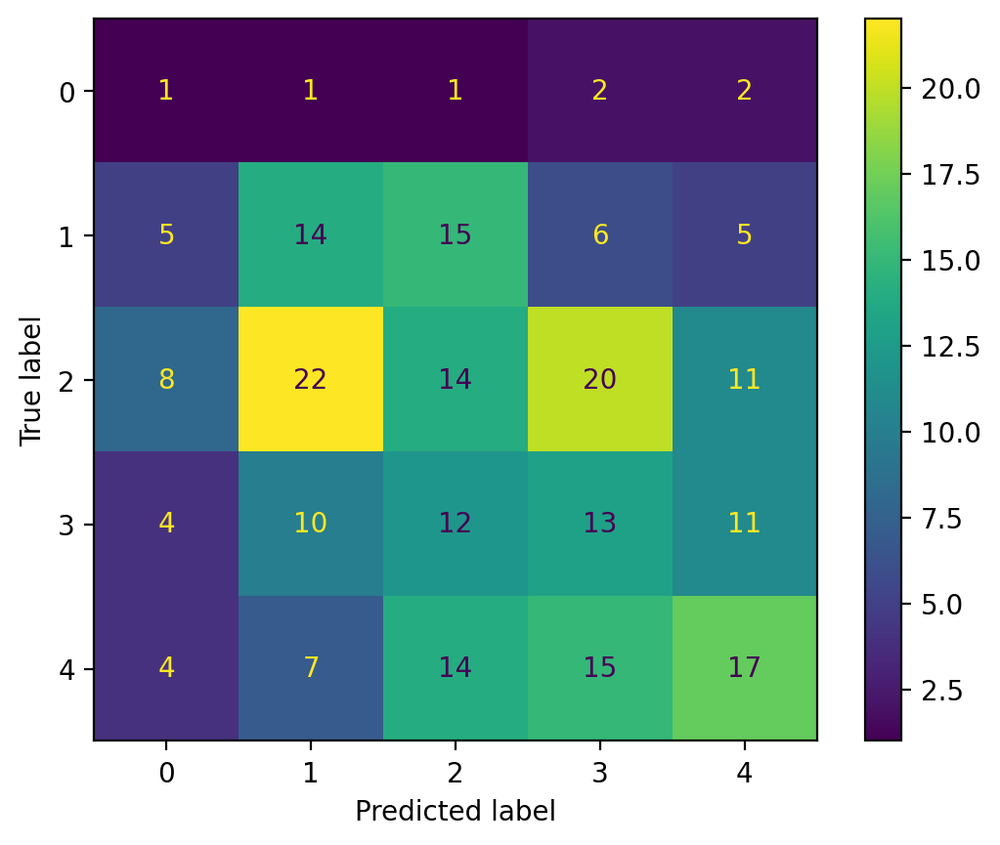

ROC AUC for class 0: 0.50
ROC AUC for class 1: 0.61
ROC AUC for class 2: 0.45
ROC AUC for class 3: 0.54
ROC AUC for class 4: 0.63


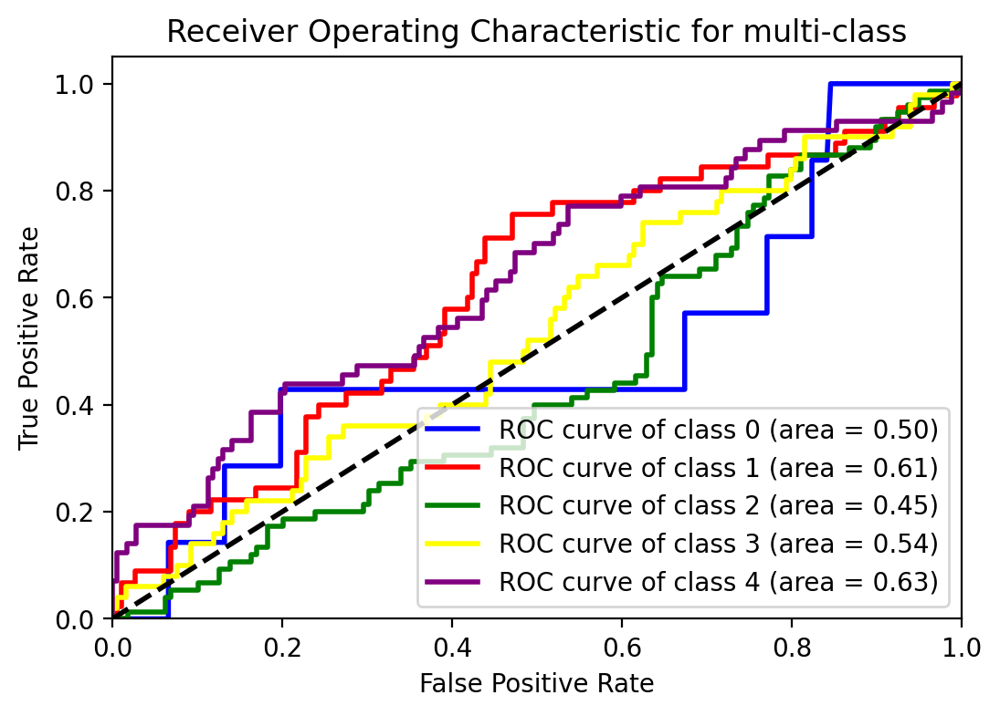

==================================== smote ====================================
Класи до балансування: AdoptionSpeed
2.0              239
4.0              239
1.0              208
3.0              205
0.0               45
Name: count, dtype: int64
Класи після балансування: AdoptionSpeed
0.0              239
1.0              239
2.0              239
3.0              239
4.0              239
Name: count, dtype: int64


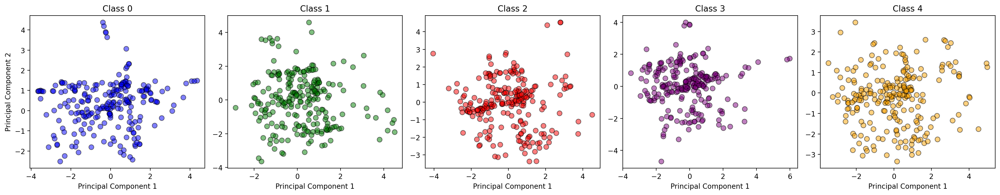

Test set metrics:
               precision    recall  f1-score   support

         0.0       0.07      0.14      0.10         7
         1.0       0.23      0.27      0.24        45
         2.0       0.32      0.31      0.31        75
         3.0       0.21      0.16      0.18        50
         4.0       0.39      0.39      0.39        57

    accuracy                           0.28       234
   macro avg       0.24      0.25      0.24       234
weighted avg       0.29      0.28      0.28       234

Accuracy: 0.28205128205128205
Precision: 0.28734183403382574
Recall: 0.28205128205128205
F1 Score: 0.2832627563980282


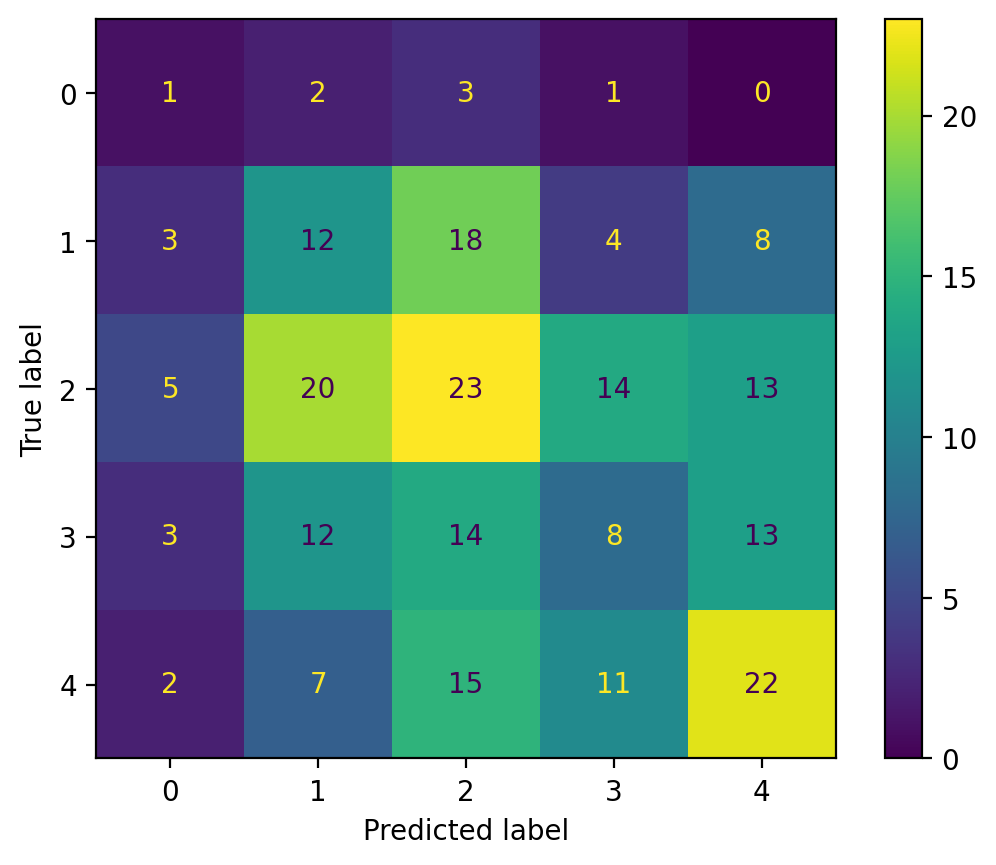

ROC AUC for class 0: 0.56
ROC AUC for class 1: 0.61
ROC AUC for class 2: 0.54
ROC AUC for class 3: 0.54
ROC AUC for class 4: 0.63


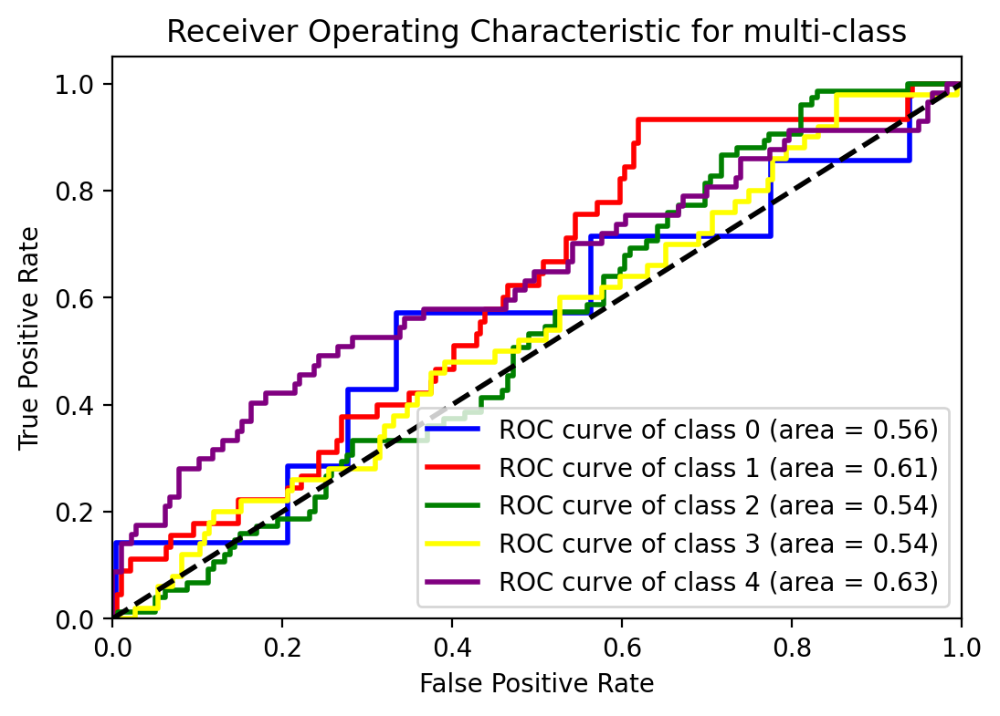

==================================== random_under ====================================
Класи до балансування: AdoptionSpeed
2.0              239
4.0              239
1.0              208
3.0              205
0.0               45
Name: count, dtype: int64
Класи після балансування: AdoptionSpeed
0.0              45
1.0              45
2.0              45
3.0              45
4.0              45
Name: count, dtype: int64


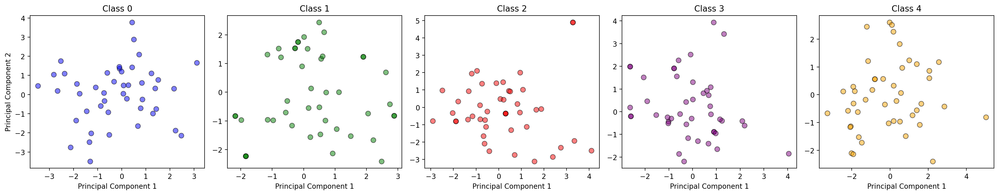

Test set metrics:
               precision    recall  f1-score   support

         0.0       0.06      0.29      0.10         7
         1.0       0.27      0.24      0.26        45
         2.0       0.32      0.36      0.34        75
         3.0       0.20      0.14      0.16        50
         4.0       0.38      0.26      0.31        57

    accuracy                           0.26       234
   macro avg       0.24      0.26      0.23       234
weighted avg       0.29      0.26      0.27       234

Accuracy: 0.26495726495726496
Precision: 0.2892988998620275
Recall: 0.26495726495726496
F1 Score: 0.2708901196752361


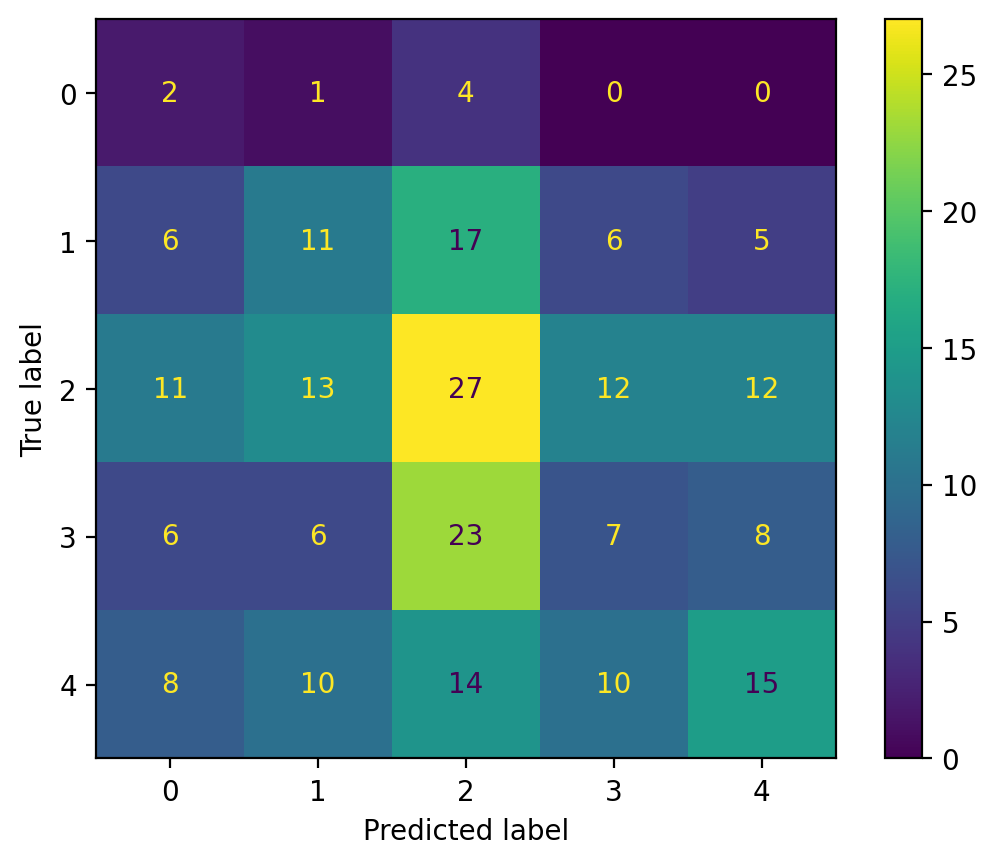

ROC AUC for class 0: 0.53
ROC AUC for class 1: 0.59
ROC AUC for class 2: 0.54
ROC AUC for class 3: 0.49
ROC AUC for class 4: 0.65


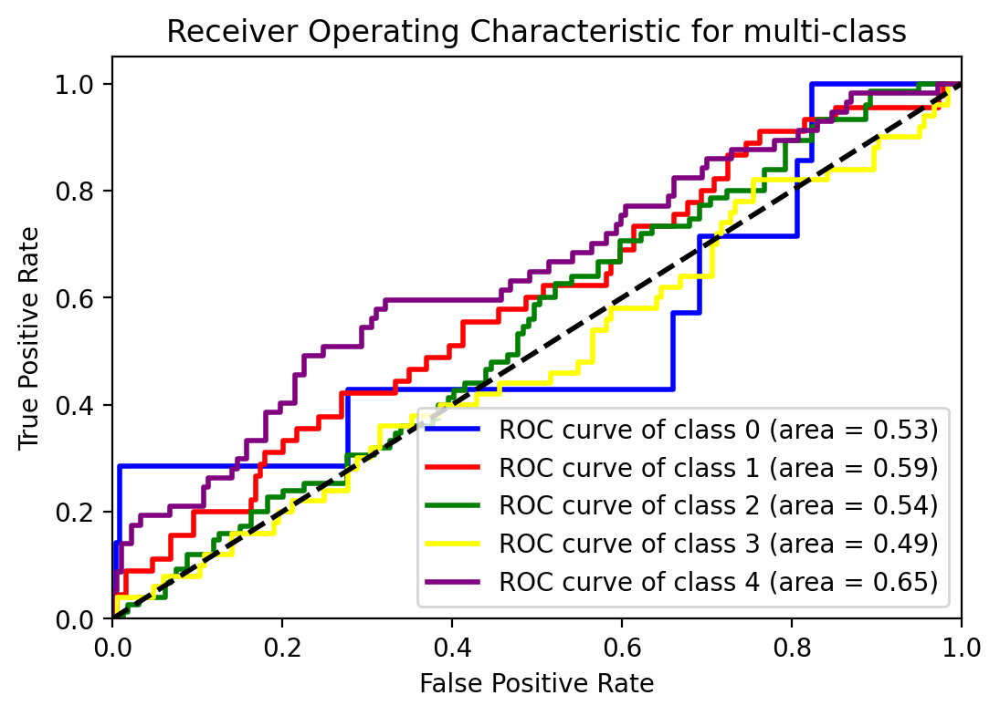

==================================== tomek_links ====================================
Класи до балансування: AdoptionSpeed
2.0              239
4.0              239
1.0              208
3.0              205
0.0               45
Name: count, dtype: int64
Класи після балансування: AdoptionSpeed
4.0              183
2.0              158
1.0              132
3.0              128
0.0               45
Name: count, dtype: int64


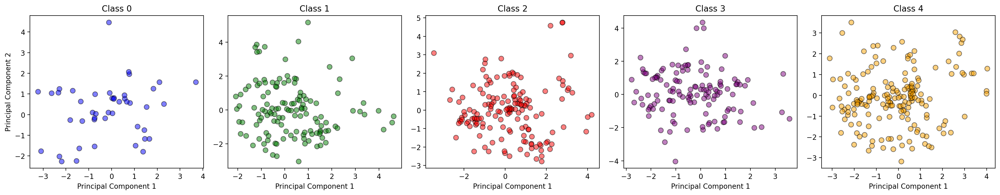

Test set metrics:
               precision    recall  f1-score   support

         0.0       0.00      0.00      0.00         7
         1.0       0.22      0.22      0.22        45
         2.0       0.35      0.36      0.35        75
         3.0       0.26      0.16      0.20        50
         4.0       0.35      0.49      0.41        57

    accuracy                           0.31       234
   macro avg       0.24      0.25      0.24       234
weighted avg       0.29      0.31      0.30       234

Accuracy: 0.31196581196581197
Precision: 0.29423036157782845
Recall: 0.31196581196581197
F1 Score: 0.29789670756655845


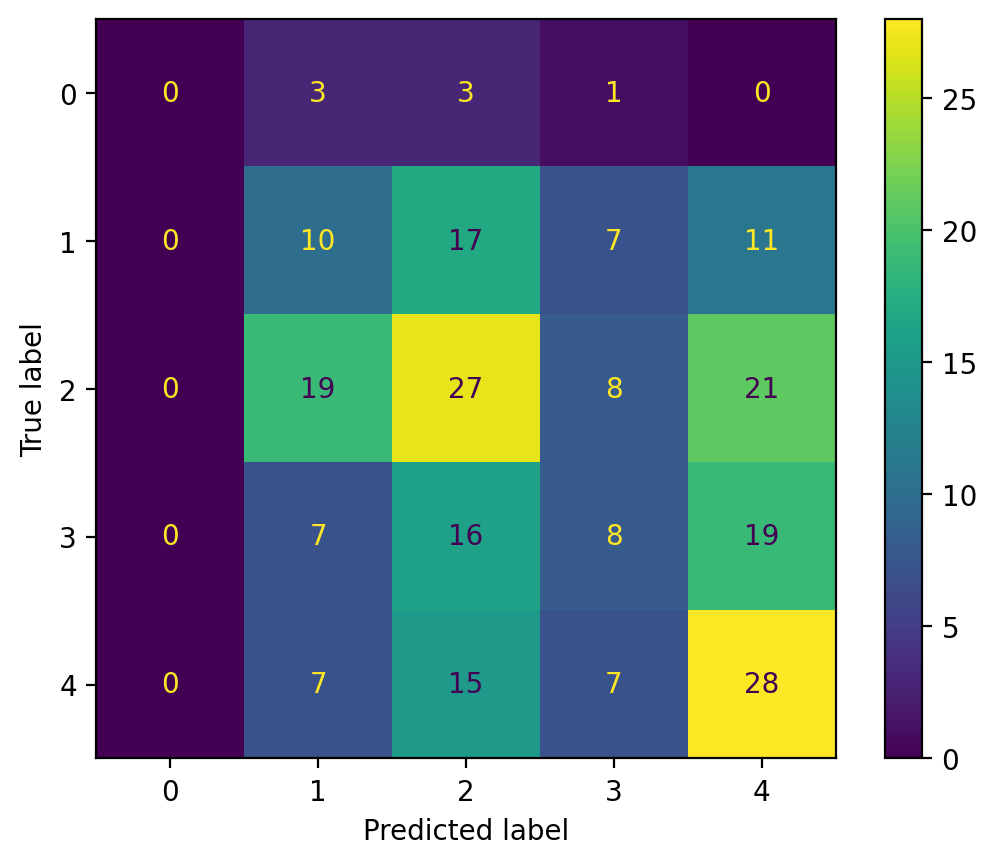

ROC AUC for class 0: 0.66
ROC AUC for class 1: 0.59
ROC AUC for class 2: 0.56
ROC AUC for class 3: 0.53
ROC AUC for class 4: 0.68


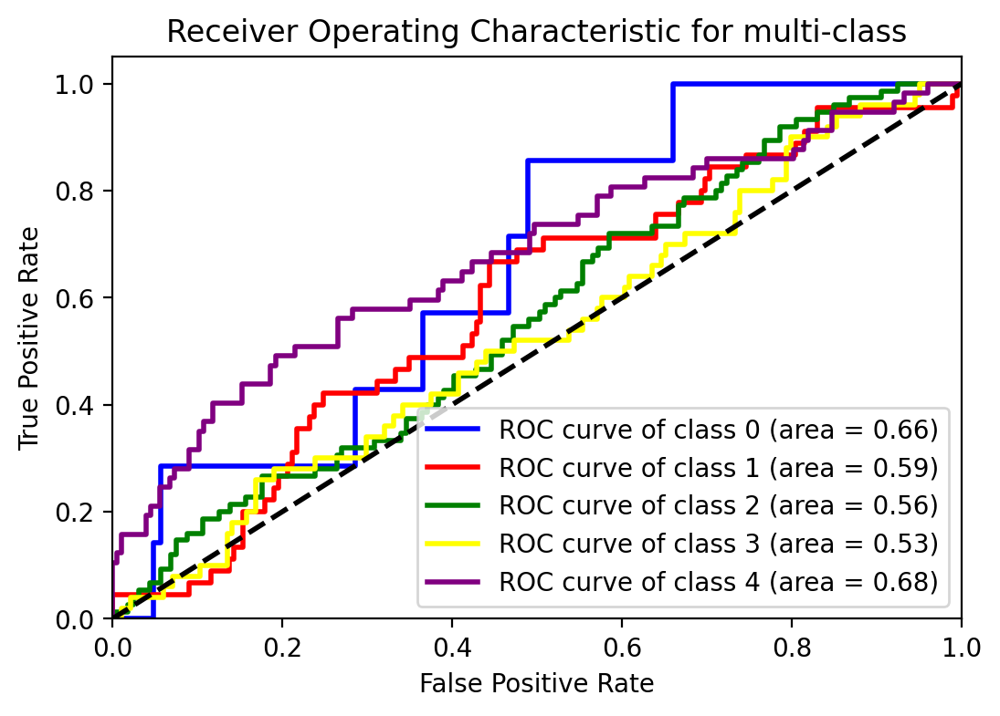

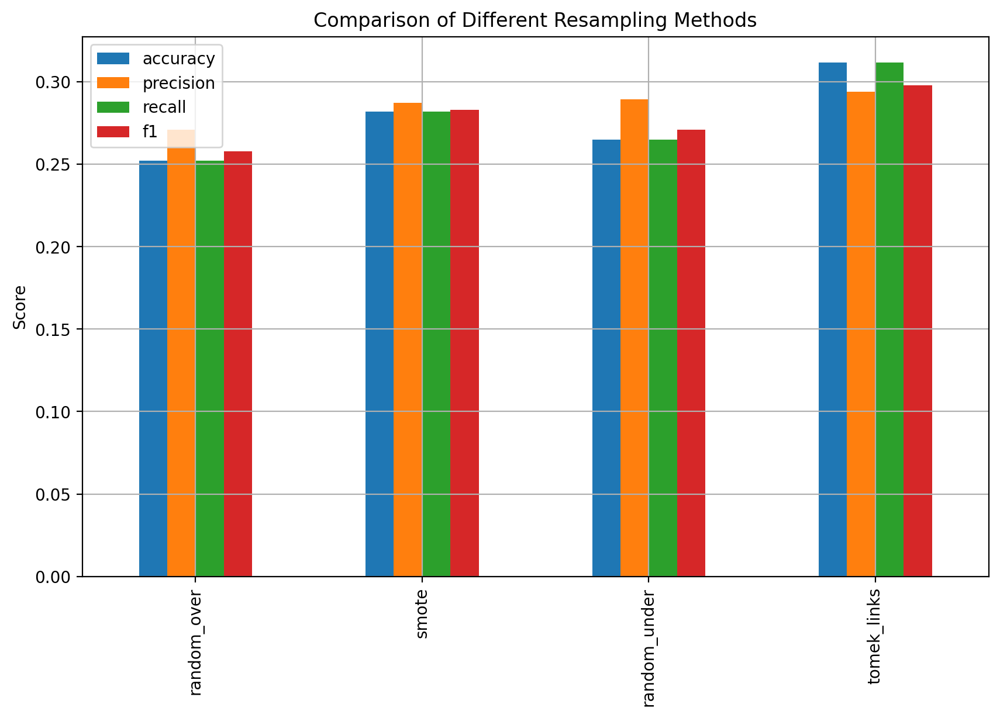

In [278]:
import matplotlib.pyplot as plt
from sklearn import metrics
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc, confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from collections import Counter

def train_and_evaluate(X, y, sampler=None, sampler_name="No balancing"):
    print(f"==================================== {sampler_name} ====================================")
    
    # Розділення даних на тренувальні та тестові вибірки
    X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state=42)

    print("Класи до балансування:", y_train.value_counts())

    # Застосування методу балансування (якщо вказано)
    if sampler:
        X_train, y_train = sampler.fit_resample(X_train, y_train)
        print("Класи після балансування:", (y_train.value_counts()))

    label_encoder = LabelEncoder()
    y_encoded = label_encoder.fit_transform(y_train)

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X_train)

    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X_scaled)

    fig, axes = plt.subplots(1, 5, figsize=(20, 4))

    classes = np.unique(y_encoded) 
    colors = ['blue', 'green', 'red', 'purple', 'orange']

    for i, ax in enumerate(axes):
        class_mask = y_encoded == classes[i]
        ax.scatter(X_pca[class_mask, 0], X_pca[class_mask, 1], color=colors[i], edgecolor='k', s=50, alpha=0.5);
        ax.set_title(f'Class {classes[i]}');
        ax.set_xlabel('Principal Component 1');
        if i == 0:
            ax.set_ylabel('Principal Component 2');

    plt.tight_layout();
    plt.show();

    # Стандартизація даних
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Створення моделі
    rf = RandomForestClassifier(max_features=0.6, min_samples_leaf=4, min_samples_split=15, n_estimators=45, random_state=42)
    rf.fit(X_train_scaled, y_train)

    # Оцінка моделі
    y_pred = rf.predict(X_test_scaled)
    y_prob = rf.predict_proba(X_test_scaled)

    # Розрахунок метрик
    accuracy = metrics.accuracy_score(y_test, y_pred)
    precision = metrics.precision_score(y_test, y_pred, average='weighted')
    recall = metrics.recall_score(y_test, y_pred, average='weighted')
    f1 = metrics.f1_score(y_test, y_pred, average='weighted')

    print('Test set metrics:\n', metrics.classification_report(y_test, y_pred))
    print("Accuracy:", accuracy)
    print("Precision:", precision)
    print("Recall:", recall)
    print("F1 Score:", f1)

    # Виведення матриці помилок
    conf_matrix = metrics.confusion_matrix(y_test, y_pred)
    disp = ConfusionMatrixDisplay(conf_matrix)
    disp.plot()
    plt.show()

    # ROC AUC
    fpr, tpr, roc_auc = {}, {}, {}
    n_classes = y_prob.shape[1]
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test == i, y_prob[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
        print(f'ROC AUC for class {i}: {roc_auc[i]:.2f}')

    # Побудова ROC-кривих для кожного класу
    plt.figure(figsize=(6, 4))
    colors = ['blue', 'red', 'green', 'yellow', 'purple']
    for i, color in zip(range(n_classes), colors):
        plt.plot(fpr[i], tpr[i], color=color, lw=2,
                 label=f'ROC curve of class {i} (area = {roc_auc[i]:.2f})')
    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic for multi-class')
    plt.legend(loc="lower right")
    plt.show()

    return accuracy, precision, recall, f1, roc_auc

results = {}
for method_name, sampler in resampling_methods.items():
    accuracy, precision, recall, f1, roc_auc = train_and_evaluate(X, y, sampler=sampler, sampler_name=method_name)
    results[method_name] = {
        'accuracy': accuracy,
        'precision': precision,
        'recall': recall,
        'f1': f1,
        'roc_auc': roc_auc
    }

metrics_df = pd.DataFrame(results).T
metrics_df.plot(kind='bar', figsize=(10, 6), title='Comparison of Different Resampling Methods');
plt.ylabel('Score');
plt.grid();
plt.show();

==================================== random_over ====================================
Класи до балансування: AdoptionSpeed
2.0              239
4.0              239
1.0              208
3.0              205
0.0               45
Name: count, dtype: int64
Класи після балансування: AdoptionSpeed
0.0              239
1.0              239
2.0              239
3.0              239
4.0              239
Name: count, dtype: int64


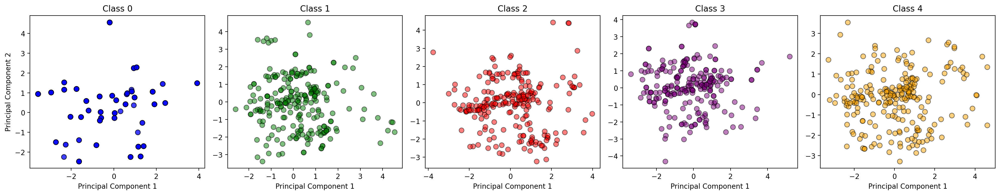

Test set metrics:
               precision    recall  f1-score   support

         0.0       0.00      0.00      0.00         7
         1.0       0.27      0.31      0.29        45
         2.0       0.29      0.21      0.25        75
         3.0       0.24      0.30      0.27        50
         4.0       0.38      0.32      0.34        57

    accuracy                           0.27       234
   macro avg       0.24      0.23      0.23       234
weighted avg       0.29      0.27      0.28       234

Accuracy: 0.2692307692307692
Precision: 0.28825164486929195
Recall: 0.2692307692307692
F1 Score: 0.2752296234512028


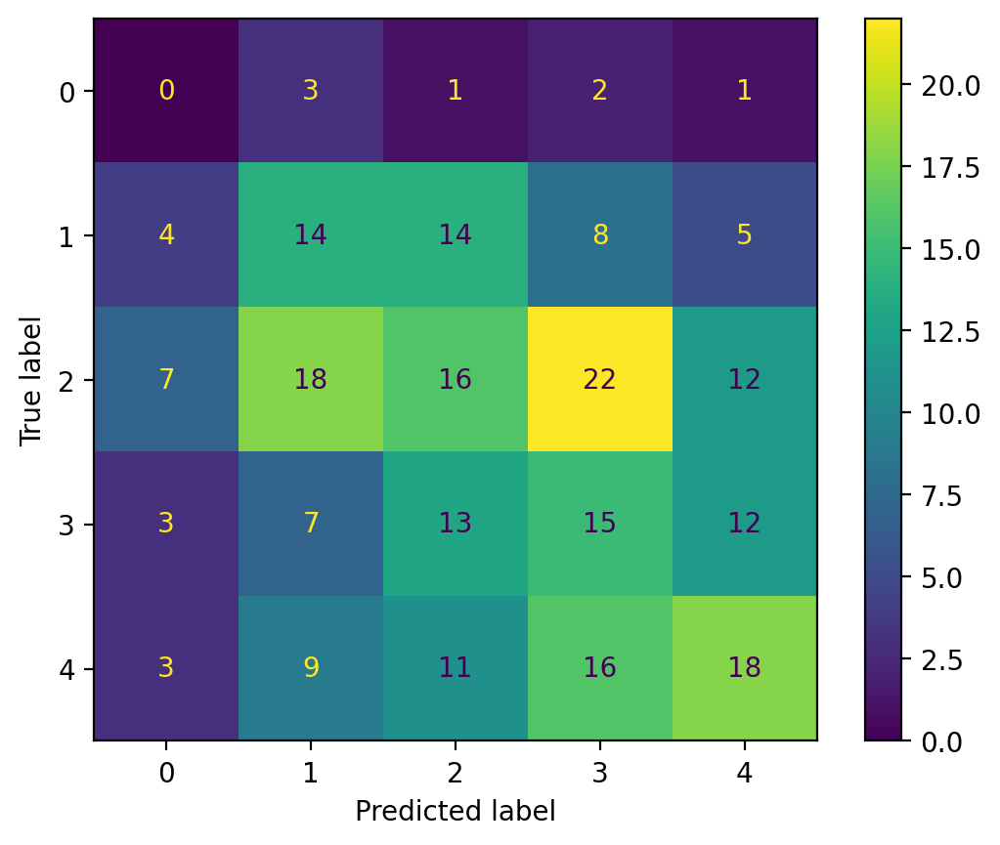

ROC AUC for class 0: 0.53
ROC AUC for class 1: 0.62
ROC AUC for class 2: 0.51
ROC AUC for class 3: 0.57
ROC AUC for class 4: 0.65


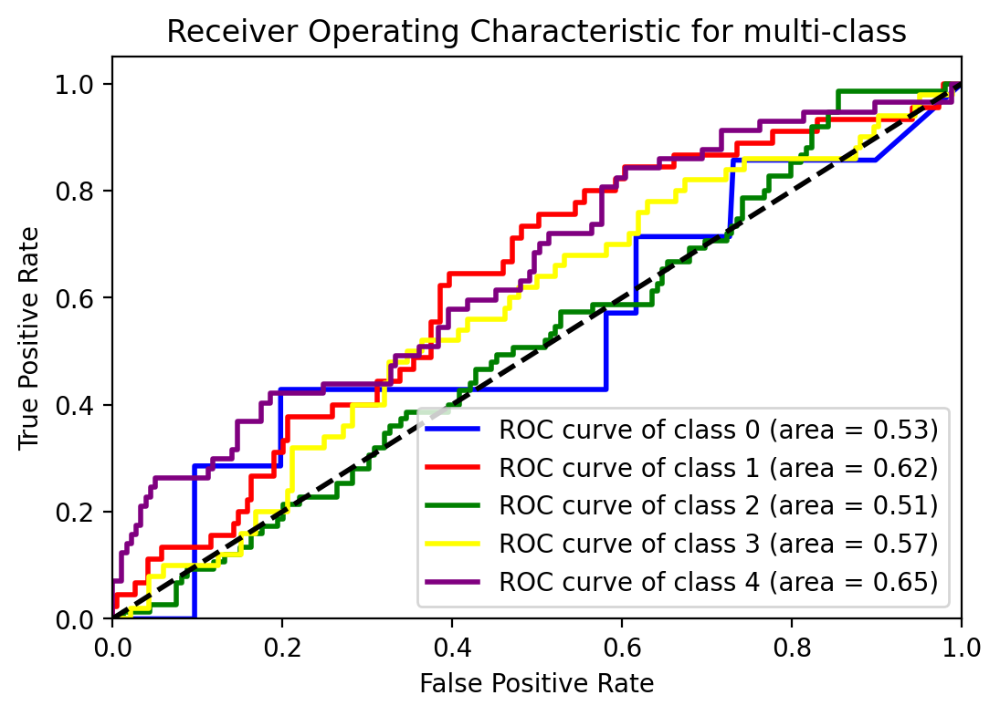

==================================== smote ====================================
Класи до балансування: AdoptionSpeed
2.0              239
4.0              239
1.0              208
3.0              205
0.0               45
Name: count, dtype: int64
Класи після балансування: AdoptionSpeed
0.0              239
1.0              239
2.0              239
3.0              239
4.0              239
Name: count, dtype: int64


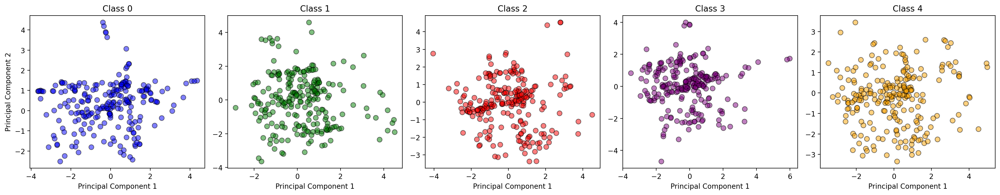

Test set metrics:
               precision    recall  f1-score   support

         0.0       0.14      0.14      0.14         7
         1.0       0.24      0.31      0.27        45
         2.0       0.31      0.29      0.30        75
         3.0       0.28      0.26      0.27        50
         4.0       0.40      0.37      0.38        57

    accuracy                           0.30       234
   macro avg       0.28      0.28      0.27       234
weighted avg       0.31      0.30      0.30       234

Accuracy: 0.3034188034188034
Precision: 0.30832836743560627
Recall: 0.3034188034188034
F1 Score: 0.30468774969528234


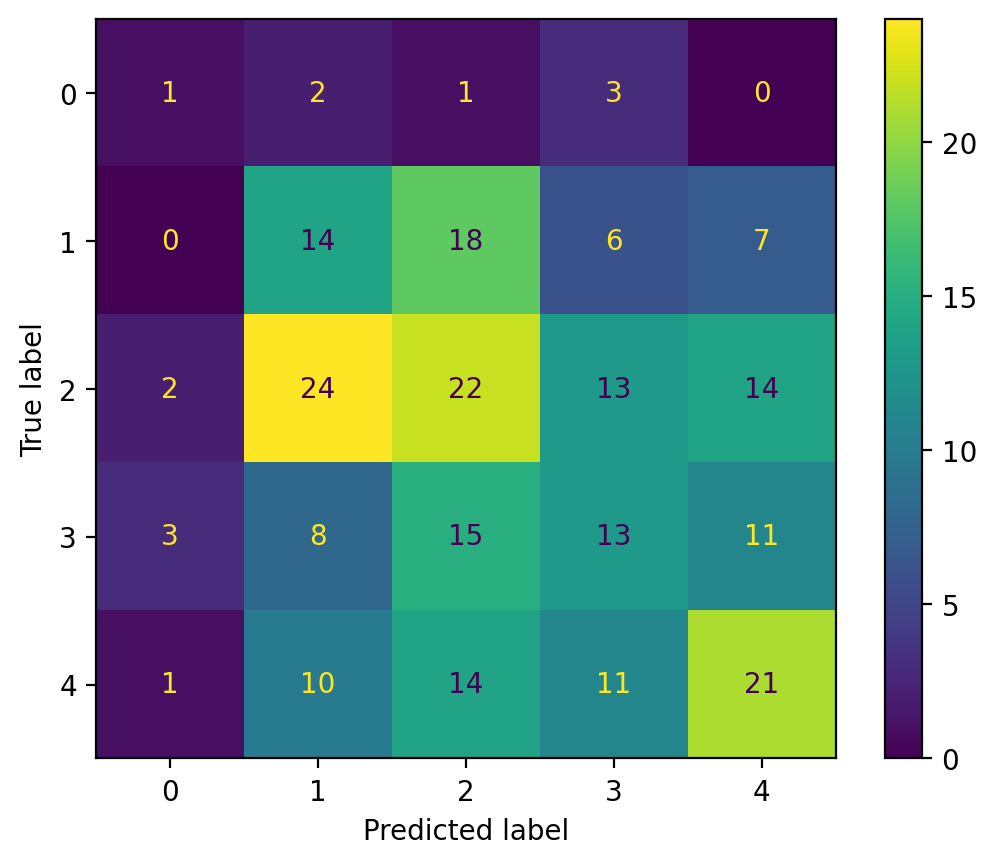

ROC AUC for class 0: 0.56
ROC AUC for class 1: 0.61
ROC AUC for class 2: 0.56
ROC AUC for class 3: 0.61
ROC AUC for class 4: 0.65


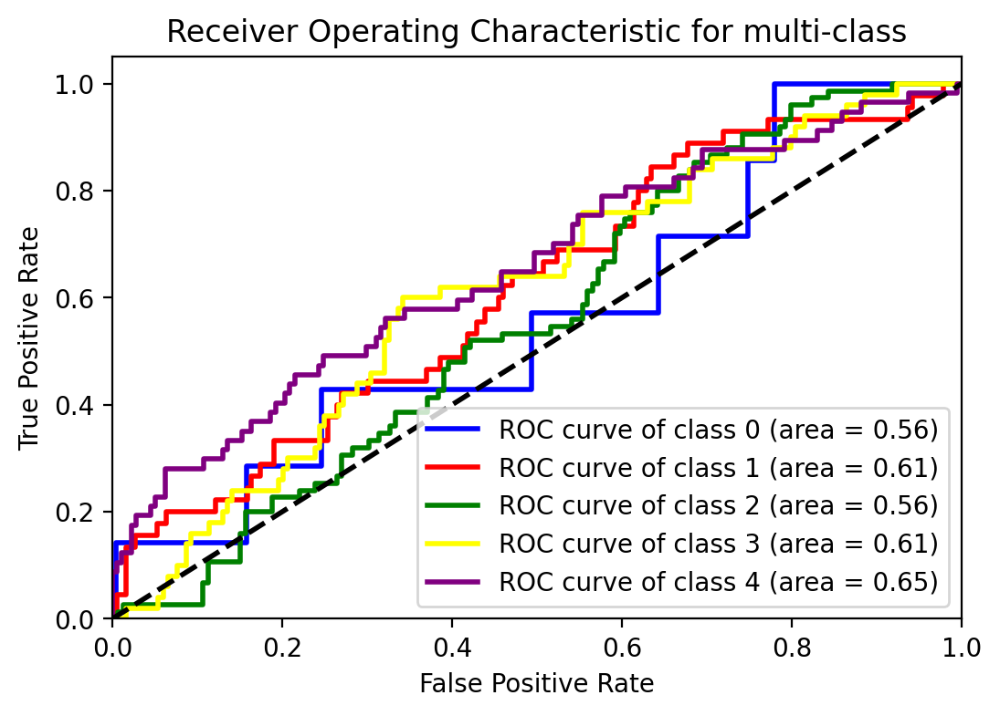

==================================== random_under ====================================
Класи до балансування: AdoptionSpeed
2.0              239
4.0              239
1.0              208
3.0              205
0.0               45
Name: count, dtype: int64
Класи після балансування: AdoptionSpeed
0.0              45
1.0              45
2.0              45
3.0              45
4.0              45
Name: count, dtype: int64


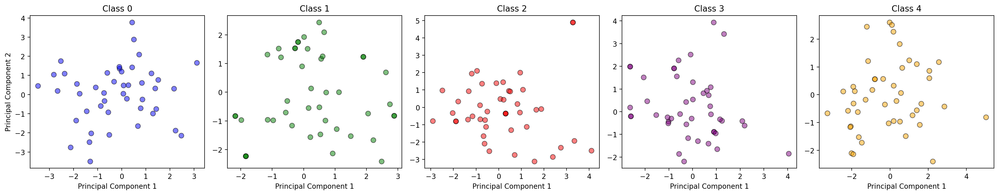

Test set metrics:
               precision    recall  f1-score   support

         0.0       0.06      0.29      0.10         7
         1.0       0.27      0.24      0.26        45
         2.0       0.33      0.36      0.35        75
         3.0       0.19      0.14      0.16        50
         4.0       0.41      0.30      0.35        57

    accuracy                           0.27       234
   macro avg       0.25      0.27      0.24       234
weighted avg       0.30      0.27      0.28       234

Accuracy: 0.27350427350427353
Precision: 0.30161769760048096
Recall: 0.27350427350427353
F1 Score: 0.28195547185196324


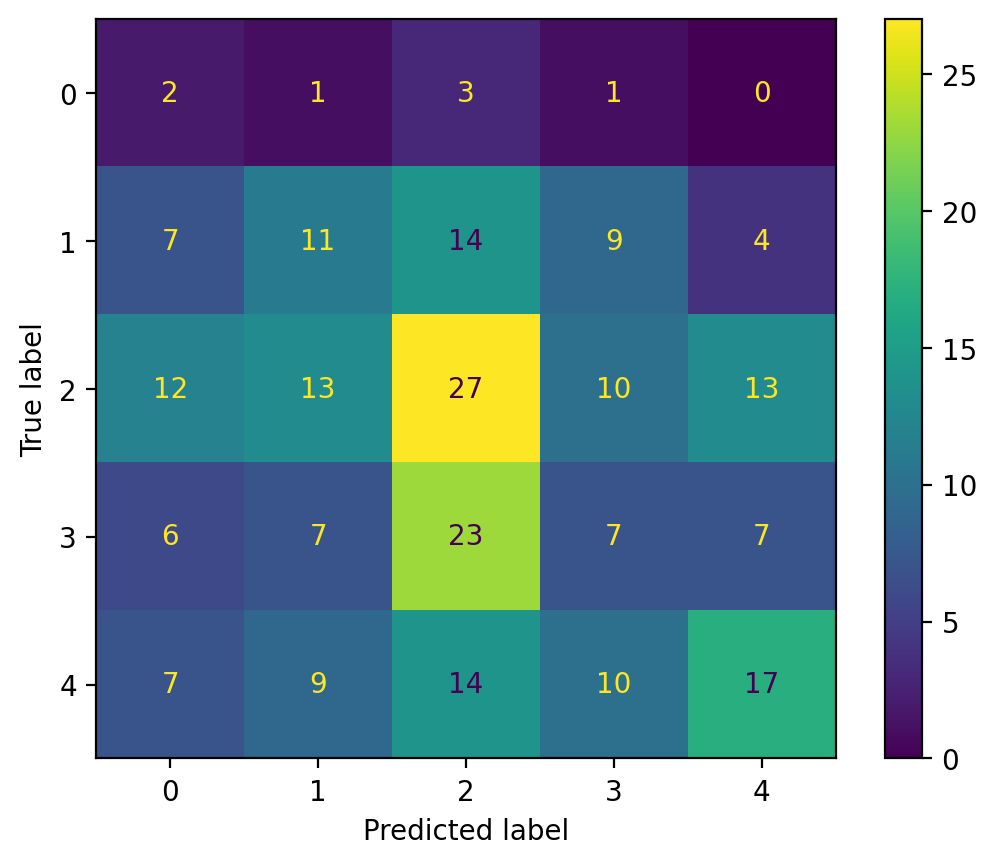

ROC AUC for class 0: 0.51
ROC AUC for class 1: 0.59
ROC AUC for class 2: 0.55
ROC AUC for class 3: 0.51
ROC AUC for class 4: 0.65


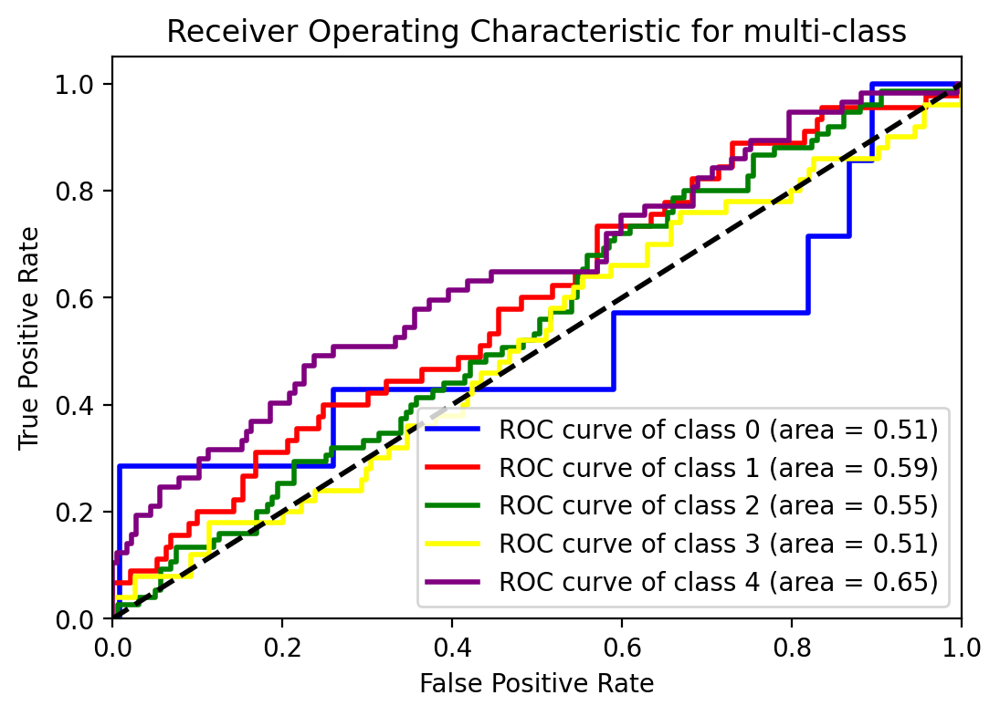

==================================== tomek_links ====================================
Класи до балансування: AdoptionSpeed
2.0              239
4.0              239
1.0              208
3.0              205
0.0               45
Name: count, dtype: int64
Класи після балансування: AdoptionSpeed
4.0              183
2.0              158
1.0              132
3.0              128
0.0               45
Name: count, dtype: int64


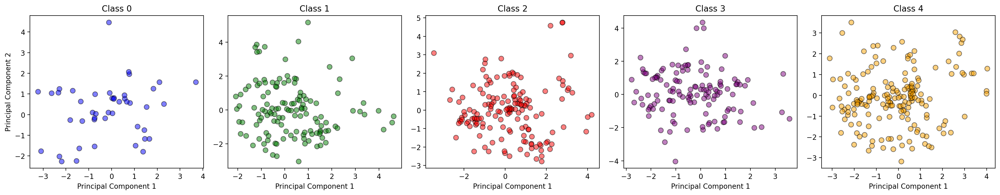

Test set metrics:
               precision    recall  f1-score   support

         0.0       0.00      0.00      0.00         7
         1.0       0.25      0.29      0.27        45
         2.0       0.37      0.33      0.35        75
         3.0       0.27      0.22      0.24        50
         4.0       0.37      0.47      0.42        57

    accuracy                           0.32       234
   macro avg       0.25      0.26      0.26       234
weighted avg       0.31      0.32      0.32       234

Accuracy: 0.3247863247863248
Precision: 0.3142775366419753
Recall: 0.3247863247863248
F1 Score: 0.3169919290111598


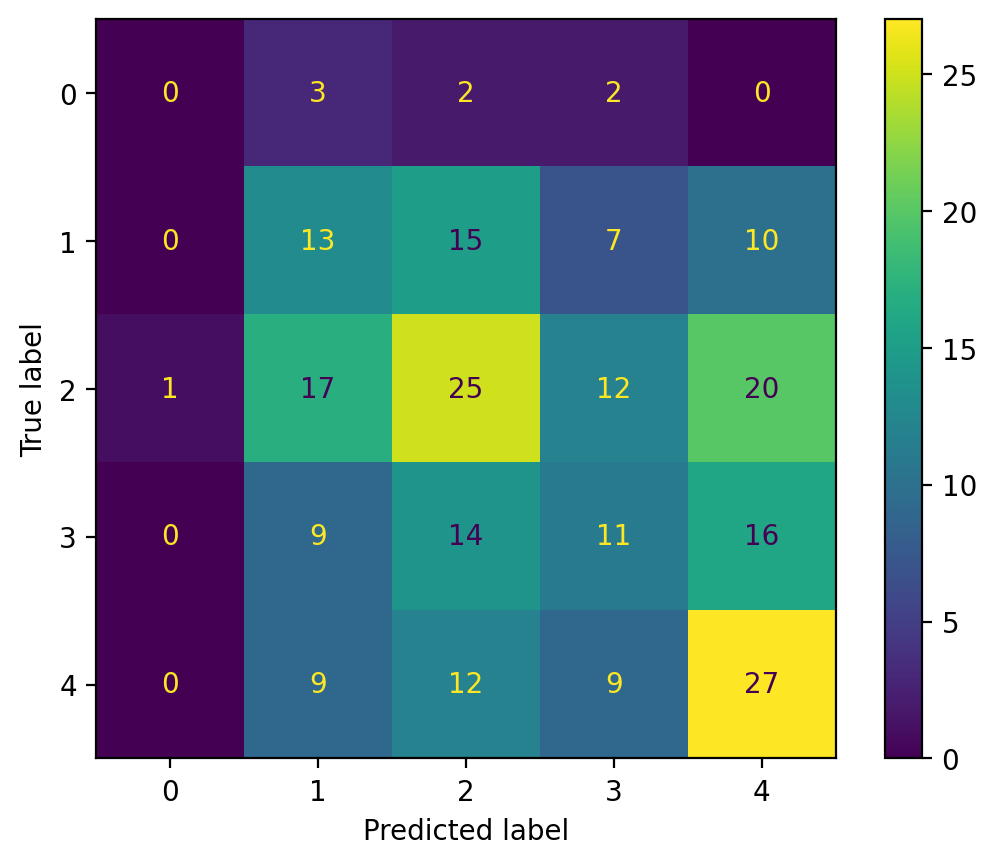

ROC AUC for class 0: 0.58
ROC AUC for class 1: 0.59
ROC AUC for class 2: 0.55
ROC AUC for class 3: 0.55
ROC AUC for class 4: 0.67


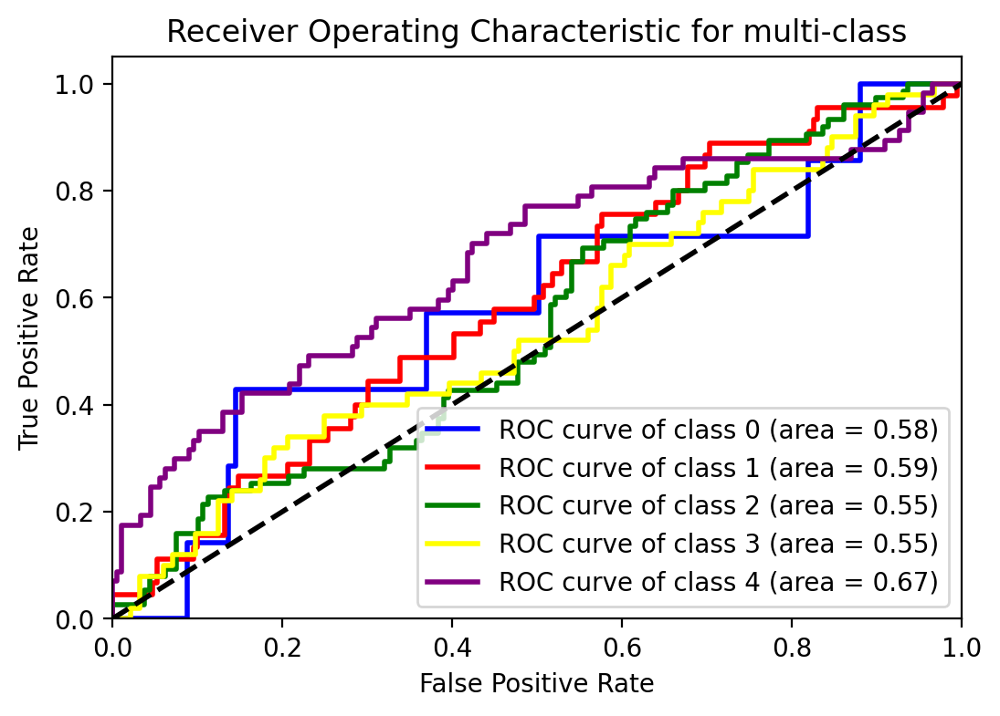

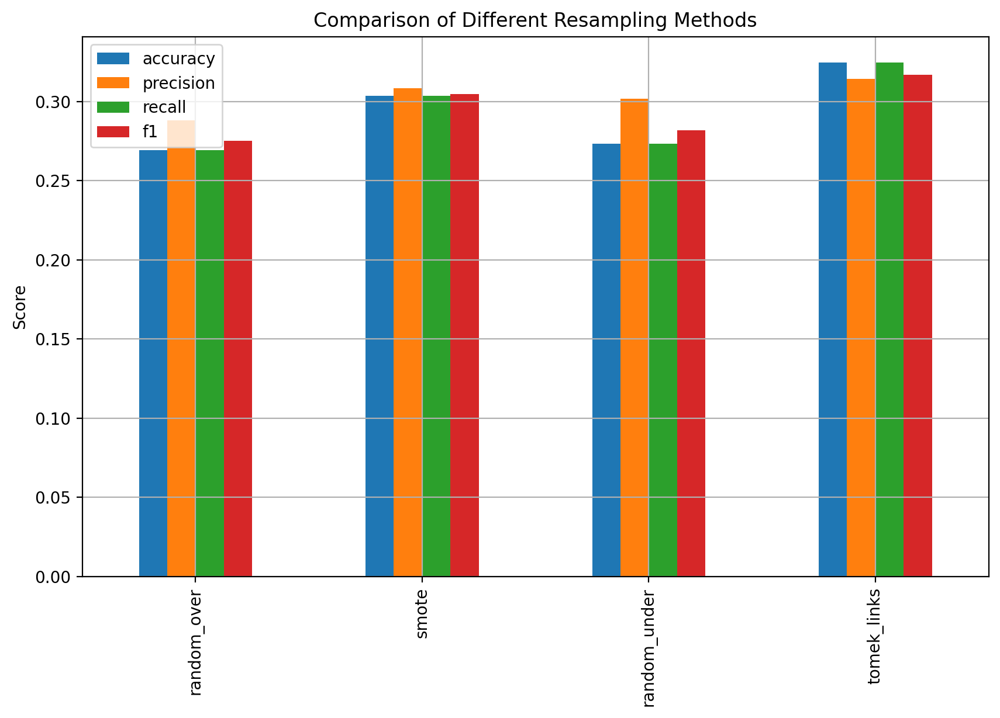

In [279]:
import matplotlib.pyplot as plt
from sklearn import metrics
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc, confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from collections import Counter

def train_and_evaluate(X, y, sampler=None, sampler_name="No balancing"):
    print(f"==================================== {sampler_name} ====================================")
    
    # Розділення даних на тренувальні та тестові вибірки
    X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state=42)

    print("Класи до балансування:", y_train.value_counts())

    # Застосування методу балансування (якщо вказано)
    if sampler:
        X_train, y_train = sampler.fit_resample(X_train, y_train)
        print("Класи після балансування:", (y_train.value_counts()))

    label_encoder = LabelEncoder()
    y_encoded = label_encoder.fit_transform(y_train)

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X_train)

    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X_scaled)

    fig, axes = plt.subplots(1, 5, figsize=(20, 4))

    classes = np.unique(y_encoded) 
    colors = ['blue', 'green', 'red', 'purple', 'orange']

    for i, ax in enumerate(axes):
        class_mask = y_encoded == classes[i]
        ax.scatter(X_pca[class_mask, 0], X_pca[class_mask, 1], color=colors[i], edgecolor='k', s=50, alpha=0.5);
        ax.set_title(f'Class {classes[i]}');
        ax.set_xlabel('Principal Component 1');
        if i == 0:
            ax.set_ylabel('Principal Component 2');

    plt.tight_layout();
    plt.show();

    # Стандартизація даних
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Створення моделі
    rf = RandomForestClassifier(max_features=0.5, min_samples_leaf=3, min_samples_split=11, n_estimators=55, random_state=42)
    rf.fit(X_train_scaled, y_train)

    # Оцінка моделі
    y_pred = rf.predict(X_test_scaled)
    y_prob = rf.predict_proba(X_test_scaled)

    # Розрахунок метрик
    accuracy = metrics.accuracy_score(y_test, y_pred)
    precision = metrics.precision_score(y_test, y_pred, average='weighted')
    recall = metrics.recall_score(y_test, y_pred, average='weighted')
    f1 = metrics.f1_score(y_test, y_pred, average='weighted')

    print('Test set metrics:\n', metrics.classification_report(y_test, y_pred))
    print("Accuracy:", accuracy)
    print("Precision:", precision)
    print("Recall:", recall)
    print("F1 Score:", f1)

    # Виведення матриці помилок
    conf_matrix = metrics.confusion_matrix(y_test, y_pred)
    disp = ConfusionMatrixDisplay(conf_matrix)
    disp.plot()
    plt.show()

    # ROC AUC
    fpr, tpr, roc_auc = {}, {}, {}
    n_classes = y_prob.shape[1]
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test == i, y_prob[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
        print(f'ROC AUC for class {i}: {roc_auc[i]:.2f}')

    # Побудова ROC-кривих для кожного класу
    plt.figure(figsize=(6, 4))
    colors = ['blue', 'red', 'green', 'yellow', 'purple']
    for i, color in zip(range(n_classes), colors):
        plt.plot(fpr[i], tpr[i], color=color, lw=2,
                 label=f'ROC curve of class {i} (area = {roc_auc[i]:.2f})')
    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic for multi-class')
    plt.legend(loc="lower right")
    plt.show()

    return accuracy, precision, recall, f1, roc_auc

results = {}
for method_name, sampler in resampling_methods.items():
    accuracy, precision, recall, f1, roc_auc = train_and_evaluate(X, y, sampler=sampler, sampler_name=method_name)
    results[method_name] = {
        'accuracy': accuracy,
        'precision': precision,
        'recall': recall,
        'f1': f1,
        'roc_auc': roc_auc
    }

metrics_df = pd.DataFrame(results).T
metrics_df.plot(kind='bar', figsize=(10, 6), title='Comparison of Different Resampling Methods');
plt.ylabel('Score');
plt.grid();
plt.show();

За результатами, отриманими з використанням гіперпараметрів, вибраних за допомогою Байєсової оптимізації, можна побачити деякі поліпшення у точності, повноті, F1-оцінці та ROC AUC для деяких класів порівняно з результатами базової моделі та моделей з різними методами балансування даних (random over, SMOTE, random under, та Tomek links).